In [212]:
import numpy as np
import xarray as xr
import re
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
from functools import partial
import matplotlib as mpl
import pandas as pd
from importlib import reload

from dask.distributed import wait
import seaborn as sns

In [213]:
import os, sys

# My imports
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'time_of_emergene_drafts'))
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'time_of_emergene_drafts', 'src'))

import constants
import toe_constants as toe_const
import toe_calc as toe
import toe_data_analysis as toe_data_an
import toe_plots# as toe_plots
import plotting_utils
from plotting_utils import add_lat_markers
toe_calc = toe
import utils

logger = utils.get_notebook_logger()

In [214]:
# client.close()

In [4]:
from dask.distributed import Client, wait
# client.close()
client = Client(threads_per_worker=1, n_workers=90, memory_limit=None)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 90
Total threads: 90,Total memory: 0 B
Status: running,Using processes: True
Comm: tcp://127.0.0.1:34633,Workers: 90
Dashboard: /proxy/8787/status,Total threads: 90
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:37699,Total threads: 1
Dashboard: /proxy/41781/status,Memory: 0 B
Nanny: tcp://127.0.0.1:44681,


2025-04-14 11:04:03,598 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 19e740bca104520d8be502f008d36052 initialized by task ('rechunk-merge-rechunk-transfer-de6b72e043a36fcf9a40b3bff7ab8470', 0, 0, 0, 0, 5, 0, 0, 0) executed on worker tcp://127.0.0.1:44295
2025-04-14 11:04:05,397 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 19e740bca104520d8be502f008d36052 deactivated due to stimulus 'task-finished-1744592645.3942778'
2025-04-14 11:04:45,922 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle 7eba265a64943845f5c4004b781ded35 initialized by task ('rechunk-merge-rechunk-transfer-330903de24f6c71a263e7900239ac7dc', 0, 0, 0, 0, 1, 0, 0, 0) executed on worker tcp://127.0.0.1:45507
2025-04-14 11:04:45,926 - distributed.shuffle._scheduler_plugin - WARNING - Shuffle f0a4d3e11a1bba190e2400f16c0b29fe initialized by task ('rechunk-merge-rechunk-transfer-57acf8b22f2c0be88b251e9b56bc5471', 0, 0, 0, 0, 4, 0, 0, 0) executed on worker tcp://127.0.0.1:38139
2025-04-14

###### Hidden Warnings

In [5]:
sys.stderr = open(os.devnull, 'w');

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.07/lib/python3.10/site-packages/dask/_task_spec.py:739: RuntimeWarning: All-NaN slice encountered
  return self.func(*new_argspec, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.07/lib/python3.10/site-packages/dask/_task_spec.py:739: RuntimeWarning: All-NaN slice encountered
  return self.func(*new_argspec, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.07/lib/python3.10/site-packages/dask/_task_spec.py:739: RuntimeWarning: All-NaN slice encountered
  return self.func(*new_argspec, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.07/lib/python3.10/site-packages/dask/_task_spec.py:739: RuntimeWarning: All-NaN slice encountered
  return self.func(*new_argspec, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.07/lib/python3.10/site-packages/dask/_task_spec.py:739: RuntimeWarning: All-NaN slice encountered
  return self.func(*new_argspec, **kwargs)


<h1 style='color:yellow'> General Functions</h1>

<h2 style='color:cyan; background-color:#0b3d3b; padding:10px; border-radius:5px;'> Opening Files </h2>

In [6]:
CHUNK_DICT = {
    'best_tas': {'time':-1, 'lat':180//3},
    'access': {'member': -1, 'time':-1, 'lon':144//6, 'lat':72//12},
    'era5': {'time':-1, 'lon':1440//12, 'lat':-1},
    'access': {'time':-1, 'member':1, 'lat': -1, 'lon':-1}#144//3}

}

def get_chunks(name):
    if 'best' in name: return CHUNK_DICT['best_tas']
    elif 'access' in name: return CHUNK_DICT['access']
    elif 'access' in name: return CHUNK_DICT['access']
    return 'auto' 

In [7]:
def open_files_datatree(fname_dict, tree_name: str, chunks=None, **kwargs):
    """
    Opens multiple NetCDF files and organizes them into a DataTree.

    Parameters:
    - fname_dict (dict): Dictionary where keys are names and values are file paths.
    - tree_name (str): Name for the root of the DataTree.
    - **kwargs: Additional keyword arguments passed to `xr.open_dataset`.

    Returns:
    - xr.DataTree: A DataTree object containing the datasets.
    """
    data_tree_dict = {}
    for name, path in fname_dict.items():
        # if chunks == 'dataset': chunks = CHUNK_DICT.get('era5' if 'era5' in name else 'best')
        chunk = get_chunks(name) if chunks is None else chunks
        print(f'{name} - {chunk}')
        ds = xr.open_dataset(path, **kwargs).chunk(chunk)
        ds.attrs['name'] = name
        dt = xr.DataTree(ds, name=name)
        data_tree_dict[name] = dt
        

    tree = xr.DataTree(name=tree_name, children=data_tree_dict)
    return tree

In [8]:
class FileNameManager:
    def __init__(self, file_names: list, root_path: str):
        """
        Initialize the FileNameManager with a list of file names and a root path.

        Parameters:
        - file_names (list): List of file name strings.
        - root_path (str): The root directory path.
        """
        self.file_names = file_names
        self.root_path = root_path

    def generate_dict(self, fname: str = None, extension: str = None) -> dict:
        """
        Generate a dictionary mapping a simplified name (from file_names) to full paths.
    
        Parameters:
        - fname (str, optional): File name to be appended to each directory.
        - extension (str, optional): If provided, only directories with this extension will be included.
    
        Returns:
        - dict: Dictionary with cleaned names as keys and full file paths as values.
        """
        file_dict = {}
    
        for f in self.file_names:
            if extension and not f.endswith(extension):
                continue  # Skip files that don't match the extension
    
            # Remove extension if it exists, then clean the name
            name = f.rsplit('.', 1)[0] if '.' in f else f
            name = name.split('(')[0].rstrip('_ ').strip()  # Remove anything after '(' and clean
    
            path = os.path.join(self.root_path, f, fname) if fname else os.path.join(self.root_path, f)
            file_dict[name] = path
    
        return file_dict

    def generate_dict_no_strip(self, fname: str) -> dict:
        """
        Generate a dictionary mapping a simplified name (from file_names) to full paths.

        Parameters:
        - fname (str): File name to be appended to each directory.

        Returns:
        - dict: Dictionary with simplified names as keys and full file paths as values.
        """
        return {
            f: os.path.join(self.root_path, f, fname)
            for f in self.file_names
        }
    def __repr__(self):
        return f'{self.root_path}' + f'\n----\n{self.file_names}'

In [9]:
# Get just the files that have the string 
all_files =  np.sort(os.listdir(constants.TOE_SAVE_DIR))
all_files

array(['.ipynb_checkpoints', 'access_ssp585_pr_(1880_1909)',
       'access_ssp585_pr_region_aggregation.zarr',
       'access_ssp585_pr_region_aggregationv2.zarr',
       'access_ssp585_tas_(1880_1909)',
       'access_ssp585_tas_multi_base_period.zarr',
       'access_ssp585_tas_multi_base_period_v2.zarr',
       'access_ssp585_tas_multi_base_period_v3.zarr',
       'access_ssp585_tas_multi_base_period_v4.zarr',
       'access_ssp585_tas_multi_base_period_v5_tmp.zarr',
       'access_ssp585_tas_region_aggregation.zarr',
       'best_tas_(1880_1910)', 'best_tas_(1890_1920)',
       'best_tas_(1900_1930)', 'best_tas_(1910_1940)',
       'best_tas_(1920_1950)', 'best_tas_(1920_1950)_16p0x16p0',
       'best_tas_(1920_1950)_2p0x2p0', 'best_tas_(1920_1950)_32p0x32p0',
       'best_tas_(1920_1950)_4p0x4p0', 'best_tas_(1920_1950)_8p0x8p0',
       'best_tas_(1930_1960)', 'best_tas_(1940_1970)',
       'best_tas_multi_base_period.zarr',
       'best_tas_region_aggregation.zarr', 'best_tas_reg

<h2 style='color:cyan; background-color:#0b3d3b; padding:10px; border-radius:5px;'> ToE Calculation </h2>

In [10]:
def get_test_threshold(test: str, threshold_profile:toe_const.ThresholdProfileBase) -> float:
    """
    Get the threshold value for a given test based on the specified threshold profile.

    Parameters:
    ----------
    test : str
        The name of the test (e.g., a p-value test, overlap test, etc.).
    threshold_profile : toe_const.ThresholdProfileBase
        An instance of the threshold profile containing threshold values.

    Returns:
    -------
    float or None
        The threshold value associated with the test, or None if the test is unknown.
    """
    if test in toe_const.PVALUE_TESTS: return threshold_profile.pvalue_threshold
    elif test in toe_const.OVERLAP_TESTS: return threshold_profile.overlap_threshold
    elif 'hd' in test: return threshold_profile.hd_threshold
    elif 'sn' in test: return threshold_profile.sn_threshold
    else: return None

In [11]:
# for test in list(toe_metric_tree[list(toe_metric_tree)[0]]): 
#     threshold = get_test_threshold(test, toe_const.ThresholdProfileUnusual)
#     print(test, threshold)

In [12]:
get_test_threshold('sn', toe_const.ThresholdProfileUnusual)

1

In [13]:
def get_permanent_exceedance_multi_metrics(toe_metrics_ds: xr.Dataset,
                                           threshold_profile:toe_const.ThresholdProfileBase,
                                           max_value=False, end_slice=15, logginglevel='ERROR'):
    """
    Determine the year of permanent exceedance for multiple tests in the dataset.

    Parameters:
    ----------
    toe_metrics_ds : xarray.Dataset
        An xarray Dataset containing time series metrics for multiple tests.
    threshold_profile : toe_const.ThresholdProfileBase
        An instance of the threshold profile containing threshold values.

    Returns:
    -------
    xarray.Dataset
        A merged dataset containing the year of permanent exceedance for all tests.
    """
    utils.change_logginglevel(logginglevel)

    logger.debug(toe_metrics_ds)
    logger.debug('\n----------\n')
    logger.debug(f'{max_value=}, {end_slice=}')
        
    exceedance_list = []

    for test in toe_metrics_ds:
        # Retrieve the threshold dynamically
        threshold = get_test_threshold(test, threshold_profile)

        # Determine the comparison function
        comp_func = np.greater_equal if (('sn' in test) or ('hd' in test)) else np.less
        logger.info(f'{test=} - {threshold=} - {comp_func}')

        # Apply absolute value for 'sn'-related tests
        data = np.abs(toe_metrics_ds[test]) if 'sn' in test else toe_metrics_ds[test]

        # Calculate permanent exceedance
        exceedance_da = toe.get_permanent_exceedance(
            data, threshold=threshold, comparison_func=comp_func, trim_nan=True)

        if max_value:

            if isinstance(max_value, bool):
                max_to_use = toe_metrics_ds.time.dt.year.values[-end_slice]
                logger.debug(f'max_value is bool: {max_to_use=} with {end_slice}')

            elif isinstance(max_value, (int, float)) and not isinstance(max_value, bool):
                logger.debug(f'custom max selected {max_to_use=}')
                max_to_use = max_value

            logger.debug(f'{max_to_use=}')
            exceedance_da = xr.where(exceedance_da>max_to_use, np.nan, exceedance_da)
                
            
        exceedance_list.append(exceedance_da)

    toe_ds = xr.merge(exceedance_list)
    return toe_ds

In [14]:
def check_for_null(ds): return not ds.dims and not ds.data_vars
def get_non_emergence(toe_ds): return xr.where(np.isnan(toe_ds), 1, 0)

# tree_subset_vars = lambda ds: None if check_for_null(ds) else ds[vars_with_multi_thresh]

In [15]:
def tree_subset_vars(ds, variables):
    current_vars = list(ds)
    overlapping_vars = list(set(current_vars) & set(variables))
    return ds[overlapping_vars]

In [16]:
def remove_vars(ds, variables_to_remove):
    current_vars = list(ds)
    vars_to_keeps = [var for var in current_vars if var not in variables_to_remove]
    return ds[vars_to_keeps]

In [17]:
def sign_final_time(toe_metrics_ds): 
    if check_for_null(toe_metrics_ds): return
    da = xr.where(toe_metrics_ds.sn_lowess_full.isel(time=-1) > 0, 1, -1)
    da.name = 'sign'
    ds = da.to_dataset()
    return ds

<h1 style='color:yellow'> ToE Main </h1>

<h2 style='color:cyan; background-color:#0b3d3b; padding:10px; border-radius:5px;'>Opening Data </h2>

In [18]:
PI_CHUNKS = {'time':-1, 'lat':'auto', 'lon':'auto'}

In [19]:
# # PICONTROL_PATH = '/g/data/oi10/replicas/CMIP6/CMIP/NCAR/CESM2/piControl/r1i1p1f1/Amon/tas/gn/v20190320'
# # PICONTROL_PATH = "/g/data/fs38/publications/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/piControl/r1i1p1f1/Amon/tas/gn/v20210316"
# ESMPICONTROL_PATH =\
#     ("/g/data/fs38/publications/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/"
#     "esm-piControl/r1i1p1f2/Amon/tas/gn/v20250307")
# # ESMPCONTROL_PATH2 = '/g/data/fs38/publications/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/esm-piControl/r1i1p1f2/Amon/tas/gn/v20250307'

# # ESM_PI_CONTROL_PATH_3 = ("/g/data/fs38/publications/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/"
#                         # "esm-piControl/r1i3p1f2/Amon/tas/gn/v20250307")

In [20]:
# # le_pi_ds = xr.open_mfdataset(os.path.join(ESM_PI_CONTROL_PATH_3, '*.nc'), use_cftime=True).persist()
# le_pi_ds = xr.open_mfdataset(os.path.join(ESMPICONTROL_PATH, '*.nc'),
#                              use_cftime=True).chunk(PI_CHUNKS).persist()
# le_pi_ds = le_pi_ds['tas'].resample(time='YE').mean().persist()

# le_pi_ds.to_zarr(
#     '/g/data/w40/ab2313/time_of_emergence/access_esmpicontrol_2.zarr', mode='w')
# wait(le_pi_ds);

In [21]:
PICONTROL_PATH = '/g/data/w40/ab2313/time_of_emergence/access_picontrol.zarr'
# ESMPICONTROL_PATH = '/g/data/w40/ab2313/time_of_emergence/access_esmpicontrol.zarr'

In [22]:
# le_esmpi_ds = xr.open_dataset(ESMPICONTROL_PATH, engine='zarr', use_cftime=True)['tas'].chunk(PI_CHUNKS).persist()#.compute()
# wait(le_pi_ds);

In [23]:
le_pi_ds = xr.open_dataset(PICONTROL_PATH, engine='zarr', use_cftime=True)['tas'].chunk(PI_CHUNKS).persist()#.compute()
wait(le_pi_ds);

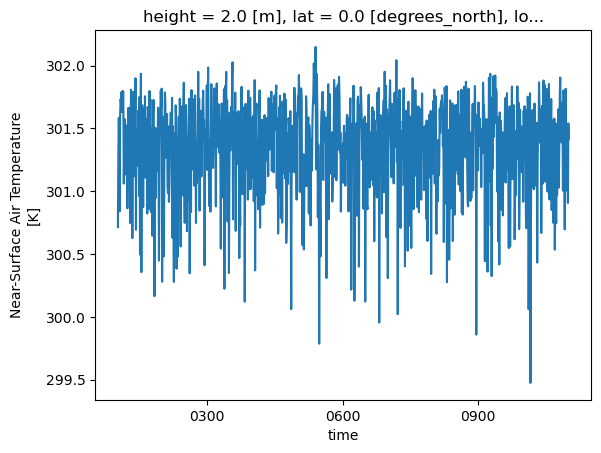

In [24]:
# le_esmpi_ds.sel(lat=0, lon=145, method='nearest').plot()
le_pi_ds.sel(lat=0, lon=145, method='nearest').plot()

In [25]:
# files = [
#     'best_tas_(1920_1950)',
#     'access_ssp585_tas_(1920_1950)'
# ]

files = [
    'best_tas_(1880_1910)',
    'access_ssp585_tas_(1880_1909)',
    'access_ssp585_pr_(1880_1909)'

]

In [26]:
os.listdir(os.path.join(constants.TOE_SAVE_DIR, files[1]))

['data.zarr', 'toe_metrics.zarr', 'data_availability_mask.zarr', 'signal.zarr']

In [27]:
# files = [f for f in files if 'access_ssp585_r10i1p1f1_pr_QSJUN_(1959_1989' not in f]
# files

In [28]:
base_file_manager = FileNameManager(files, constants.TOE_SAVE_DIR) #+ '/error')
base_file_manager

/g/data/w40/ab2313/time_of_emergence/toe_metrics
----
['best_tas_(1880_1910)', 'access_ssp585_tas_(1880_1909)', 'access_ssp585_pr_(1880_1909)']

In [29]:
fname_metric_dict = base_file_manager.generate_dict('toe_metrics.zarr')
fname_signal_dict = base_file_manager.generate_dict('signal.zarr')
fname_data_dict = base_file_manager.generate_dict('data.zarr')
data_availability_mask_dict = base_file_manager.generate_dict('data_availability_mask.zarr')

fname_data_dict

{'best_tas': '/g/data/w40/ab2313/time_of_emergence/toe_metrics/best_tas_(1880_1910)/data.zarr',
 'access_ssp585_tas': '/g/data/w40/ab2313/time_of_emergence/toe_metrics/access_ssp585_tas_(1880_1909)/data.zarr',
 'access_ssp585_pr': '/g/data/w40/ab2313/time_of_emergence/toe_metrics/access_ssp585_pr_(1880_1909)/data.zarr'}

In [30]:
%%time
toe_metric_tree = open_files_datatree(
    fname_metric_dict, 'metrics', engine='zarr', use_cftime=True).persist()
wait(toe_metric_tree)

best_tas - {'time': -1, 'lat': 60}
access_ssp585_tas - {'time': -1, 'member': 1, 'lat': -1, 'lon': -1}
access_ssp585_pr - {'time': -1, 'member': 1, 'lat': -1, 'lon': -1}
CPU times: user 197 ms, sys: 46.8 ms, total: 244 ms
Wall time: 232 ms


DoneAndNotDoneFutures(done=set(), not_done=set())

In [31]:
# This ensures that all the metrics have the same length (S/N ratioes with LOWESS are longer)
toe_metric_tree['access_ssp585_pr'] = toe_metric_tree['access_ssp585_pr'].isel(time=slice(None, -15))

In [32]:
list(toe_metric_tree)

['best_tas', 'access_ssp585_tas', 'access_ssp585_pr']

In [33]:
toe_metric_tree

<xarray.DataTree 'metrics'>
Group: /
├── Group: /best_tas
│       Dimensions:          (lat: 180, lon: 360, time: 115)
│       Coordinates:
│         * lat              (lat) float32 720B -89.5 -88.5 -87.5 ... 87.5 88.5 89.5
│         * lon              (lon) float32 1kB -179.5 -178.5 -177.5 ... 178.5 179.5
│         * time             (time) object 920B 1895-12-31 00:00:00 ... 2009-12-31 00...
│       Data variables:
│           frac             (lat, lon, time) float64 60MB dask.array<chunksize=(60, 360, 115), meta=np.ndarray>
│           hd               (lat, lon, time) float64 60MB dask.array<chunksize=(60, 360, 115), meta=np.ndarray>
│           ks               (lat, lon, time) float64 60MB dask.array<chunksize=(60, 360, 115), meta=np.ndarray>
│           perkins          (lat, lon, time) float64 60MB dask.array<chunksize=(60, 360, 115), meta=np.ndarray>
│           sn_hawkins_base  (lat, lon, time) float64 60MB dask.array<chunksize=(60, 360, 115), meta=np.ndarray>
│           sn_hawkins_full  (lat, lon, time) float64 60MB dask.array<chunksize=(60, 360, 115), meta=np.ndarray>
│           sn_lowess_base   (lat, lon, time) float64 60MB dask.array<chunksize=(60, 360, 115), meta=np.ndarray>
│           sn_lowess_full   (lat, lon, time) float64 60MB dask.array<chunksize=(60, 360, 115), meta=np.ndarray>
│           sn_mean          (lat, lon, time) float64 60MB dask.array<chunksize=(60, 360, 115), meta=np.ndarray>
│           sn_mean_roll     (lat, lon, time) float64 60MB dask.array<chunksize=(60, 360, 115), meta=np.ndarray>
│           ttest            (lat, lon, time) float64 60MB dask.array<chunksize=(60, 360, 115), meta=np.ndarray>
│       Attributes:
│           long_name:  Kolmogorov-Smirnov
│           name:       best_tas
├── Group: /access_ssp585_tas
│       Dimensions:         (member: 40, lat: 72, lon: 144, time: 191)
│       Coordinates:
│           height          float64 8B ...
│         * lat             (lat) float64 576B -88.75 -86.25 -83.75 ... 86.25 88.75
│         * lon             (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
│         * member          (member) <U7 1kB 'r10i1p1' 'r11i1p1' ... 'r8i1p1' 'r9i1p1'
│         * time            (time) object 2kB 1895-12-31 00:00:00 ... 2085-12-31 00:0...
│       Data variables:
│           frac            (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
│           hd              (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
│           ks              (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
│           perkins         (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
│           sn_lowess_base  (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
│           sn_lowess_full  (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
│           sn_mean         (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
│           sn_mean_roll    (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
│           ttest           (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
│       Attributes:
│           long_name:  Kolmogorov-Smirnov
│           name:       access_ssp585_tas
└── Group: /access_ssp585_pr
        Dimensions:         (member: 40, lat: 72, lon: 144, time: 206)
        Coordinates:
          * lat             (lat) float64 576B -88.75 -86.25 -83.75 ... 86.25 88.75
          * lon             (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
          * member          (member) <U7 1kB 'r10i1p1' 'r11i1p1' ... 'r8i1p1' 'r9i1p1'
          * time            (time) object 2kB 1880-12-31 00:00:00 ... 2085-12-31 00:0...
        Data

In [34]:
list(toe_metric_tree)

['best_tas', 'access_ssp585_tas', 'access_ssp585_pr']

In [35]:
data_tree = open_files_datatree(
    fname_data_dict, 'data', engine='zarr', use_cftime=True).persist()
wait(data_tree)

best_tas - {'time': -1, 'lat': 60}
access_ssp585_tas - {'time': -1, 'member': 1, 'lat': -1, 'lon': -1}
access_ssp585_pr - {'time': -1, 'member': 1, 'lat': -1, 'lon': -1}


DoneAndNotDoneFutures(done=set(), not_done=set())

In [36]:
signal_tree = open_files_datatree(
    fname_signal_dict, 'signal', engine='zarr', use_cftime=True).persist()
wait(signal_tree);

best_tas - {'time': -1, 'lat': 60}
access_ssp585_tas - {'time': -1, 'member': 1, 'lat': -1, 'lon': -1}
access_ssp585_pr - {'time': -1, 'member': 1, 'lat': -1, 'lon': -1}


In [37]:
data_availability_tree = open_files_datatree(
    data_availability_mask_dict, 'data_availability_mask', engine='zarr', chunks='auto').compute()
wait(data_availability_tree);

best_tas - auto
access_ssp585_tas - auto
access_ssp585_pr - auto


In [38]:
data_availability_mask_dict

{'best_tas': '/g/data/w40/ab2313/time_of_emergence/toe_metrics/best_tas_(1880_1910)/data_availability_mask.zarr',
 'access_ssp585_tas': '/g/data/w40/ab2313/time_of_emergence/toe_metrics/access_ssp585_tas_(1880_1909)/data_availability_mask.zarr',
 'access_ssp585_pr': '/g/data/w40/ab2313/time_of_emergence/toe_metrics/access_ssp585_pr_(1880_1909)/data_availability_mask.zarr'}

In [39]:
region_agg_dict ={
 'access_ssp585_tas': '/g/data/w40/ab2313/time_of_emergence/toe_metrics/access_ssp585_tas_region_aggregation.zarr',
 'access_ssp585_pr': '/g/data/w40/ab2313/time_of_emergence/toe_metrics/access_ssp585_pr_region_aggregationv2.zarr',
 'best_tas': '/g/data/w40/ab2313/time_of_emergence/toe_metrics/best_tas_region_aggregation.zarr'
}

In [40]:
region_agg_tree = open_files_datatree(
    region_agg_dict, 'toe_metric', engine='zarr', chunks='auto').compute()

access_ssp585_tas - auto
access_ssp585_pr - auto
best_tas - auto


In [41]:
region_agg_tree

<xarray.DataTree 'toe_metric'>
Group: /
├── Group: /access_ssp585_tas
│       Dimensions:         (region: 10, member: 40, time: 221)
│       Coordinates:
│           height          float64 8B 2.0
│         * member          (member) <U7 1kB 'r10i1p1' 'r11i1p1' ... 'r8i1p1' 'r9i1p1'
│         * region          (region) object 80B 'global' 'land' ... 'arctic' 'antarctic'
│         * time            (time) datetime64[ns] 2kB 1880-12-31 ... 2100-12-31
│       Data variables:
│           frac            (region, member, time) float64 707kB 89.23 ... 1.267e-58
│           ks              (region, member, time) float64 707kB 0.9935 ... 2.017e-12
│           noise           (region, member, time) float64 707kB 0.1255 ... -0.3053
│           signal          (region, member, time) float64 707kB -0.01017 ... 5.898
│           sn              (region, member, time) float64 707kB -0.09251 ... 16.94
│           sn_lowess_full  (region, member, time) float64 707kB -0.1104 ... 16.58
│       Attributes:
│           name:     access_ssp585_tas
├── Group: /access_ssp585_pr
│       Dimensions:         (region: 10, member: 40, time: 221)
│       Coordinates:
│         * member          (member) <U7 1kB 'r10i1p1' 'r11i1p1' ... 'r8i1p1' 'r9i1p1'
│         * region          (region) object 80B 'global' 'land' ... 'arctic' 'antarctic'
│         * time            (time) datetime64[ns] 2kB 1880-12-31 ... 2100-12-31
│       Data variables:
│           frac            (region, member, time) float64 707kB 84.54 ... 4.909e-26
│           ks              (region, member, time) float64 707kB 0.9935 ... 2.017e-12
│           noise           (region, member, time) float64 707kB 2.353 1.55 ... -14.87
│           pr              (region, member, time) float64 707kB 1.174e+03 ... 522.8
│           signal          (region, member, time) float64 707kB 0.2141 0.2433 ... 136.7
│           sn              (region, member, time) float64 707kB 0.05702 ... 15.0
│           sn_lowess_full  (region, member, time) float64 707kB 0.05984 0.068 ... 13.3
│       Attributes:
│           name:     access_ssp585_pr
└── Group: /best_tas
        Dimensions:         (region: 10, time: 145)
        Coordinates:
          * region          (region) object 80B 'global' 'land' ... 'arctic' 'antarctic'
          * time            (time) datetime64[ns] 1kB 1880-12-31 ... 2024-12-31
        Data variables:
            frac            (region, time) float64 12kB 84.86 83.39 87.2 ... 33.79 33.01
            ks              (region, time) float64 12kB 1.0 0.996 ... 2.613e-05
            noise           (region, time) float64 12kB 0.02347 0.1364 ... -1.713
            signal          (region, time) float64 12kB 0.03079 0.02903 ... 0.7908
            sn              (region, time) float64 12kB 0.2787 0.2628 ... 3.256 3.352
            sn_lowess_full  (region, time) float64 12kB 0.297 0.2801 ... 2.223 2.288
        Attributes:
            name:     best_tas

In [42]:
lsm_dict = {
    'best': '/g/data/w40/ab2313/time_of_emergence/best/best_mask.zarr',
    'access': '/g/data/w40/ab2313/time_of_emergence/access_lsm.zarr',
    # 'access_ssp585_pr': '/g/data/w40/ab2313/time_of_emergence/access_lsm.zarr'
}

In [43]:
lsm_tree = open_files_datatree(
    lsm_dict, 'lsm', engine='zarr', chunks='auto').persist()
wait(lsm_tree);

best - auto
access - auto


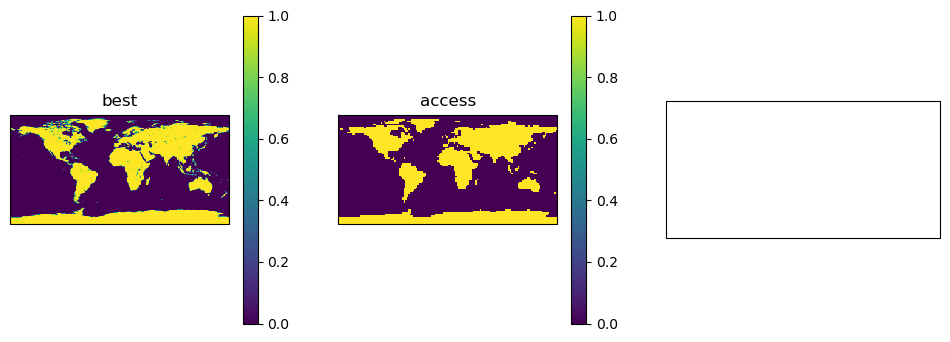

In [44]:
fig = plt.figure(figsize=(12, 4))
axes = [fig.add_subplot(1, 3, i, projection=ccrs.PlateCarree()) for i in range(1, 4)]

for num,variable in enumerate(lsm_tree):
    lsm_tree[variable].to_dataset().to_array().plot(ax=axes[num])
    axes[num].set_title(variable)

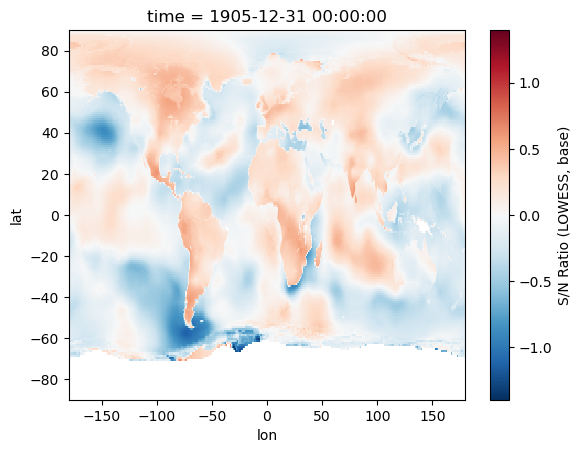

In [45]:
toe_metric_tree.best_tas.to_dataset()['sn_lowess_base'].isel(time=10).plot()

<h2 style='color:cyan; background-color:#0b3d3b; padding:10px; border-radius:5px;'>Calculations </h2>

<h3 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Ensemble S/N Ratio Calculation Intercept </h3>

TODO: This should be moved back to where the calculations are done

In [46]:
import climtas

In [47]:
target_grid = data_tree.access_ssp585_tas.tas.isel(time=0).squeeze().drop_vars('time')

In [48]:
regridder = climtas.regrid.Regridder(le_pi_ds, target_grid)

In [49]:
le_pi_ds = regridder.regrid(le_pi_ds)

In [50]:
le_pi_ds = le_pi_ds.compute()

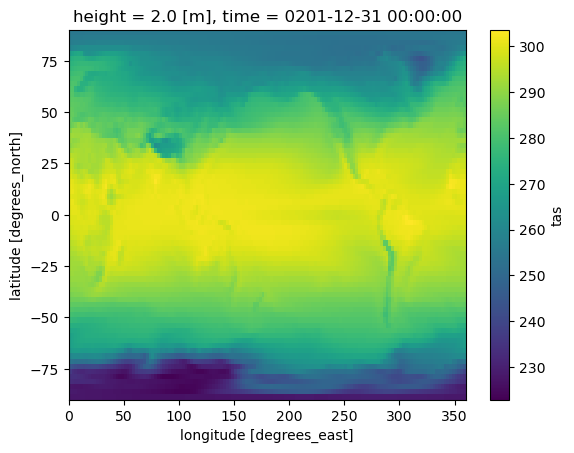

In [51]:
le_pi_ds.isel(time=100).plot()

In [52]:
le_pi_ds_noise = le_pi_ds.std(dim='time').compute()

In [53]:
singal_ens_median = data_tree.access_ssp585_tas.to_dataset().tas.median(dim='member')

In [54]:
singal_access_ds = signal_tree.access_ssp585_tas.to_dataset().signal_lowess

In [55]:
sn_pi = (singal_access_ds/le_pi_ds_noise).persist()
sn_ens_med = (singal_ens_median/le_pi_ds_noise).persist()
wait(sn_ens_med);

In [56]:
sn_pi.name = 'sn_pi'
sn_ens_med.name = 'sn_ens_med'

In [57]:
toe_metric_access = toe_metric_tree.access_ssp585_tas.to_dataset()

In [58]:
CHUNK_DICT['access']

{'time': -1, 'member': 1, 'lat': -1, 'lon': -1}

In [59]:
# toe_metric_access = xr.merge([toe_metric_access, sn_ens_med.to_dataset(), sn_pi.to_dataset()])
toe_metric_access['sn_pi'] = sn_pi
toe_metric_access['sn_ens_med'] = sn_ens_med

toe_metric_access = toe_metric_access.chunk(CHUNK_DICT['access'])#.persist()
# toe_metric_access = xr.DataTree(toe_metric_access)

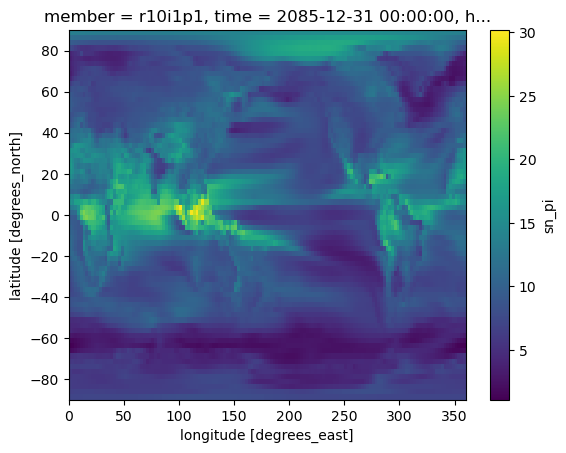

In [60]:
toe_metric_access.sn_pi.isel(time=-1, member=0).plot()

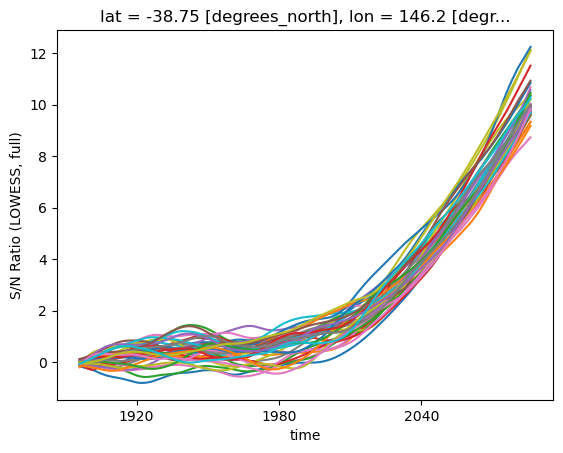

In [61]:
toe_metric_access.sn_lowess_full.sel(lat=-39, lon=145, method='nearest').plot(hue='member', add_legend=False);

In [62]:
toe_metric_tree['access_ssp585_tas'] = toe_metric_access

In [63]:
toe_metric_tree['access_ssp585_tas']

<xarray.DataTree 'access_ssp585_tas'>
Group: /access_ssp585_tas
    Dimensions:         (lat: 72, lon: 144, member: 40, time: 191)
    Coordinates:
      * lat             (lat) float64 576B -88.75 -86.25 -83.75 ... 86.25 88.75
      * lon             (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
      * member          (member) <U7 1kB 'r10i1p1' 'r11i1p1' ... 'r8i1p1' 'r9i1p1'
      * time            (time) object 2kB 1895-12-31 00:00:00 ... 2085-12-31 00:0...
        height          float64 8B ...
    Data variables:
        frac            (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        hd              (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        ks              (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        perkins         (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        sn_lowess_base  (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        sn_lowess_full  (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        sn_mean         (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        sn_mean_roll    (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        ttest           (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        sn_pi           (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        sn_ens_med      (lat, lon, time) float64 16MB dask.array<chunksize=(72, 144, 191), meta=np.ndarray>
    Attributes:
        long_name:  Kolmogorov-Smirnov
        name:       access_ssp585_tas

<h3 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'>Main </h3>

In [64]:
def calculate_percent_member_emergence(toe_ds, preserve=True, percentile=50):
    '''
    Calculate the percentile-based emergence across ensemble members.
    
    Parameters:
    - toe_ds: xarray Dataset or DataArray with a 'member' coordinate.
    - preserve (bool): If True, preserves datasets even if 'member' coordinate is absent.
    - percentile (int or float): Percentile threshold for emergence (e.g., 50 for median).
    
    Returns:
    - xarray Dataset or DataArray with reduced 'member' dimension, replaced by the specified percentile.
    '''
    
    if 'member' not in toe_ds.coords:
        return toe_ds if preserve else None

    metrics_with_member = [
        'frac', 'hd', 'ks', 'sn_lowess_base',
        'sn_lowess_full', 'sn_mean', 'sn_mean_roll',
        'sn_pi', 'ttest'
    ]

    if isinstance(toe_ds, xr.Dataset):
        overlapping_metrics = list(set(toe_ds.data_vars) & set(metrics_with_member))
        toe_subset_ds = toe_ds[overlapping_metrics]
    else:
        toe_subset_ds = toe_ds
        
    toe_50pct_access = xr.apply_ufunc(
        toe_data_an.compute_pct_emergence,
        toe_subset_ds,
        kwargs=dict(percentile=percentile),
        input_core_dims=[['member']],
        output_core_dims=[[]],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float]
    )

    if isinstance(toe_ds, xr.Dataset):
        if 'sn_ens_med' in toe_ds and isinstance(toe_50pct_access, xr.Dataset):
            toe_50pct_access['sn_ens_med'] = toe_ds['sn_ens_med']

    return toe_50pct_access


In [65]:
# def calculate_percent_member_emergence(toe_ds, preserve=True, percentile=50):
#     '''
#     Presere means even if member is not there in a branch it is still kept
#     '''

    
#     if 'member' not in list(toe_ds.coords):
#         if preserve==True: return toe_ds
#         else: return

#     metrics_with_member = ['frac', 'hd', 'ks', 'sn_lowess_base', # 'perkins',
#        'sn_lowess_full', 'sn_mean', 'sn_mean_roll', 'sn_pi', 'ttest']

#     if isinstance(toe_ds, xr.Dataset):
#         overlapping_metrics = list(set(list(toe_ds)) & set(metrics_with_member))
#         toe_subset_ds = toe_ds[overlapping_metrics]
#     else:
#         toe_subset_ds = toe_ds
        
#     toe_50pct_access = xr.apply_ufunc(
#         toe_data_an.compute_pct_emergence,
#         toe_subset_ds,
#         kwargs = dict(percentile=percentile),
#         input_core_dims=[['member']],
#         output_core_dims=[[]],
#         vectorize=True,
#         dask='parallelized',
#         output_dtypes=[float]
#     )

#     # This variable does not have members
#     if isinstance(toe_ds, xr.Dataset):
#         if 'sn_ens_med' in list(toe_ds):
            
#             toe_50pct_access['sn_ens_med'] = toe_ds['sn_ens_med']

#     return toe_50pct_access

In [66]:
# Remove perkins skill score
toe_metric_tree = toe_metric_tree.map_over_datasets(remove_vars, ['perkins'])

In [67]:
toe_access_time_subset_tree = get_permanent_exceedance_multi_metrics(
    toe_metric_tree.access_ssp585_tas.sel(time=slice('1895', '2009')), toe_const.ThresholdProfileUnusual,).compute()

In [68]:
reload(toe_const)

<module 'toe_constants' from '/home/563/ab2313/Documents/time_of_emergene_drafts/src/toe_constants.py'>

In [69]:
toe_const.ThresholdProfileUnusual()

ThresholdProfileUnusual(sn_threshold=1, pvalue_threshold=0.01, overlap_threshold=62, hd_threshold=33)

In [70]:
# Base function with shared keyword args
base_get_permanent_exceedance = partial(
    get_permanent_exceedance_multi_metrics, 
    max_value=False,
    end_slice=16,
    logginglevel='INFO'
)

# Specific variants for each threshold profile
partial_get_permanent_exceedance_unusual = partial(
    base_get_permanent_exceedance,
    threshold_profile=toe_const.ThresholdProfileUnusual
)

partial_get_permanent_exceedance_unfamiliar = partial(
    base_get_permanent_exceedance,
    threshold_profile=toe_const.ThresholdProfileUnfamiliar
)

partial_get_permanent_exceedance_unknown = partial(
    base_get_permanent_exceedance,
    threshold_profile=toe_const.ThresholdProfileUnknown
)

In [71]:
toe_tree = toe_metric_tree.map_over_datasets(
    partial_get_permanent_exceedance_unusual).compute()

 - test='frac' - threshold=62 - <ufunc 'less'>
 - test='hd' - threshold=33 - <ufunc 'greater_equal'>
 - test='ks' - threshold=0.01 - <ufunc 'less'>
 - test='sn_hawkins_base' - threshold=1 - <ufunc 'greater_equal'>
 - test='sn_hawkins_full' - threshold=1 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=1 - <ufunc 'greater_equal'>
 - test='sn_lowess_full' - threshold=1 - <ufunc 'greater_equal'>
 - test='sn_mean' - threshold=1 - <ufunc 'greater_equal'>
 - test='sn_mean_roll' - threshold=1 - <ufunc 'greater_equal'>
 - test='ttest' - threshold=0.01 - <ufunc 'less'>
 - test='frac' - threshold=62 - <ufunc 'less'>
 - test='hd' - threshold=33 - <ufunc 'greater_equal'>
 - test='ks' - threshold=0.01 - <ufunc 'less'>
 - test='sn_lowess_base' - threshold=1 - <ufunc 'greater_equal'>
 - test='sn_lowess_full' - threshold=1 - <ufunc 'greater_equal'>
 - test='sn_mean' - threshold=1 - <ufunc 'greater_equal'>
 - test='sn_mean_roll' - threshold=1 - <ufunc 'greater_equal'>
 - test='ttest' - th

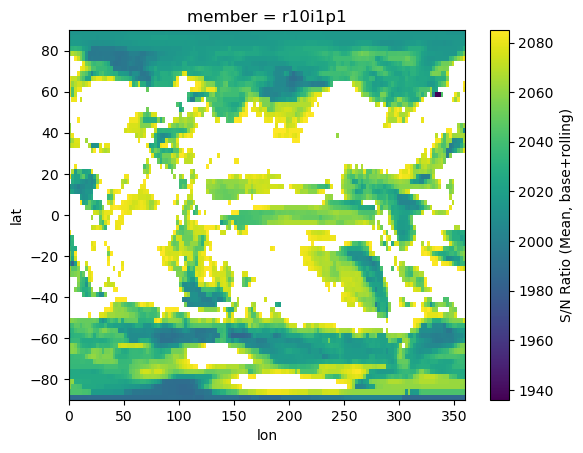

In [72]:
toe_tree.access_ssp585_pr.sn_mean_roll.isel(member=0).plot()

In [73]:
toe_tree.access_ssp585_pr.max()

<xarray.DataTree 'access_ssp585_pr'>
Group: /
    Dimensions:         ()
    Data variables:
        frac            float64 8B 2.085e+03
        hd              float64 8B 2.085e+03
        ks              float64 8B 2.085e+03
        sn_ens_med      float64 8B 2.085e+03
        sn_lowess_base  float64 8B 2.085e+03
        sn_lowess_full  float64 8B 2.085e+03
        sn_mean         float64 8B 2.085e+03
        sn_mean_roll    float64 8B 2.085e+03
        sn_pi           float64 8B 2.085e+03
        ttest           float64 8B 2.085e+03

In [74]:
sign_tf_tree = toe_metric_tree.map_over_datasets(sign_final_time).compute()

In [75]:
vars_with_multi_thresh =[
    'frac', 'hd', #'perkins',
    'sn_lowess_base', 'sn_lowess_full',
    'sn_mean', 'sn_mean_roll', 'sn_pi', 'sn_ens_med'
]

In [76]:
toe_subset_metric_tree = toe_metric_tree.map_over_datasets(tree_subset_vars, vars_with_multi_thresh).persist()
wait(toe_subset_metric_tree);

In [77]:
from dataclasses import dataclass
@dataclass(frozen=True, repr=False)
class ThresholdProfileTTtest(toe_const.ThresholdProfileBase):
    sn_threshold: float = 0.84
    pvalue_threshold: float = 0.01

@dataclass(frozen=True, repr=False)
class ThresholdProfileUnfamiliarCross(toe_const.ThresholdProfileBase):
    '''
    This is for checking the number of years from the emergence at the expected
    (two for S/N ratio and 32% for overlap and what was found)
    '''
    sn_threshold: float = 2.37
    overlap_threshold: float = 38


@dataclass(frozen=True, repr=False)
class ThresholdProfileUnknownCross(toe_const.ThresholdProfileBase):
    '''
    This is for checking the number of years from the emergence at the expected
    (three for S/N ratio and 13% for overlap and what was found)
    '''
    sn_threshold: float = 3.67
    overlap_threshold: float = 20

In [78]:
partial_get_permanent_exceedance_ttest = partial(
    base_get_permanent_exceedance,
    threshold_profile=ThresholdProfileTTtest)


partial_get_permanent_exceedance_unfamiliar_cross = partial(
    base_get_permanent_exceedance,
    threshold_profile=ThresholdProfileUnfamiliarCross)

partial_get_permanent_exceedance_unknown_cross = partial(
    base_get_permanent_exceedance,
    threshold_profile=ThresholdProfileUnknownCross)

In [79]:
cross_metric_tree = toe_metric_tree.map_over_datasets(
    tree_subset_vars,
    ['frac',
    'sn_lowess_base', 'sn_lowess_full',
    'sn_mean', 'sn_mean_roll', 'sn_pi', 'sn_ens_med']).persist()

In [80]:
toe_tree_cross_unfamiliar = cross_metric_tree.map_over_datasets(
    partial_get_permanent_exceedance_unfamiliar_cross).compute()

 - test='sn_mean_roll' - threshold=2.37 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=2.37 - <ufunc 'greater_equal'>
 - test='sn_mean' - threshold=2.37 - <ufunc 'greater_equal'>
 - test='frac' - threshold=38 - <ufunc 'less'>
 - test='sn_lowess_full' - threshold=2.37 - <ufunc 'greater_equal'>
 - test='sn_mean_roll' - threshold=2.37 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=2.37 - <ufunc 'greater_equal'>
 - test='sn_pi' - threshold=2.37 - <ufunc 'greater_equal'>
 - test='sn_mean' - threshold=2.37 - <ufunc 'greater_equal'>
 - test='sn_ens_med' - threshold=2.37 - <ufunc 'greater_equal'>
 - test='frac' - threshold=38 - <ufunc 'less'>
 - test='sn_lowess_full' - threshold=2.37 - <ufunc 'greater_equal'>
 - test='sn_mean_roll' - threshold=2.37 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=2.37 - <ufunc 'greater_equal'>
 - test='sn_pi' - threshold=2.37 - <ufunc 'greater_equal'>
 - test='sn_mean' - threshold=2.37 - <ufunc 'greater_equal'>
 - 

In [81]:
toe_tree_cross_unknown = cross_metric_tree.map_over_datasets(
    partial_get_permanent_exceedance_unknown_cross).compute()

 - test='sn_mean_roll' - threshold=3.67 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=3.67 - <ufunc 'greater_equal'>
 - test='sn_mean' - threshold=3.67 - <ufunc 'greater_equal'>
 - test='frac' - threshold=20 - <ufunc 'less'>
 - test='sn_lowess_full' - threshold=3.67 - <ufunc 'greater_equal'>
 - test='sn_mean_roll' - threshold=3.67 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=3.67 - <ufunc 'greater_equal'>
 - test='sn_pi' - threshold=3.67 - <ufunc 'greater_equal'>
 - test='sn_mean' - threshold=3.67 - <ufunc 'greater_equal'>
 - test='sn_ens_med' - threshold=3.67 - <ufunc 'greater_equal'>
 - test='frac' - threshold=20 - <ufunc 'less'>
 - test='sn_lowess_full' - threshold=3.67 - <ufunc 'greater_equal'>
 - test='sn_mean_roll' - threshold=3.67 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=3.67 - <ufunc 'greater_equal'>
 - test='sn_pi' - threshold=3.67 - <ufunc 'greater_equal'>
 - test='sn_mean' - threshold=3.67 - <ufunc 'greater_equal'>
 - 

In [82]:
(
    toe_tree.access_ssp585_tas.sn_mean - toe_tree_cross_unknown.access_ssp585_tas.sn_mean
).median(dim='member').median()

<xarray.DataArray 'sn_mean' ()> Size: 8B
array(-37.5)
Coordinates:
    height   float64 8B 2.0

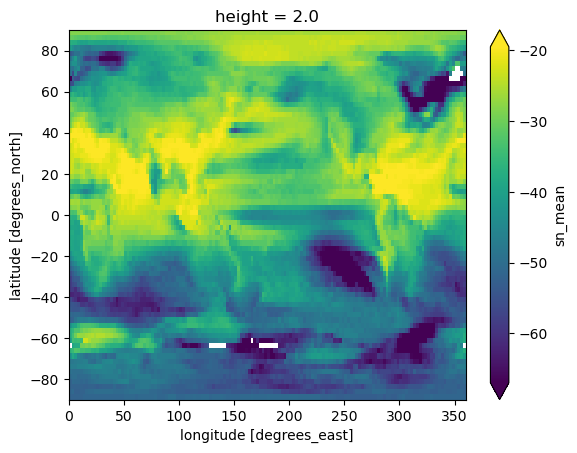

In [83]:
(
    toe_tree.access_ssp585_tas.sn_mean - toe_tree_cross_unknown.access_ssp585_tas.sn_mean
).median(dim='member').plot(robust=True)

In [84]:
sn_ttest_subset_metric_tree = toe_metric_tree.map_over_datasets(
    tree_subset_vars,
    ['ttest',
    'sn_lowess_base', 'sn_lowess_full',
    'sn_mean', 'sn_mean_roll', 'sn_pi', 'sn_ens_med']).persist()

In [85]:
toe_tree_ttest = sn_ttest_subset_metric_tree.map_over_datasets(
    partial_get_permanent_exceedance_ttest).compute()

 - test='sn_mean_roll' - threshold=0.84 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=0.84 - <ufunc 'greater_equal'>
 - test='sn_mean' - threshold=0.84 - <ufunc 'greater_equal'>
 - test='ttest' - threshold=0.01 - <ufunc 'less'>
 - test='sn_lowess_full' - threshold=0.84 - <ufunc 'greater_equal'>
 - test='sn_mean_roll' - threshold=0.84 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=0.84 - <ufunc 'greater_equal'>
 - test='sn_pi' - threshold=0.84 - <ufunc 'greater_equal'>
 - test='sn_mean' - threshold=0.84 - <ufunc 'greater_equal'>
 - test='ttest' - threshold=0.01 - <ufunc 'less'>
 - test='sn_ens_med' - threshold=0.84 - <ufunc 'greater_equal'>
 - test='sn_lowess_full' - threshold=0.84 - <ufunc 'greater_equal'>
 - test='sn_mean_roll' - threshold=0.84 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=0.84 - <ufunc 'greater_equal'>
 - test='sn_pi' - threshold=0.84 - <ufunc 'greater_equal'>
 - test='sn_mean' - threshold=0.84 - <ufunc 'greater_equal

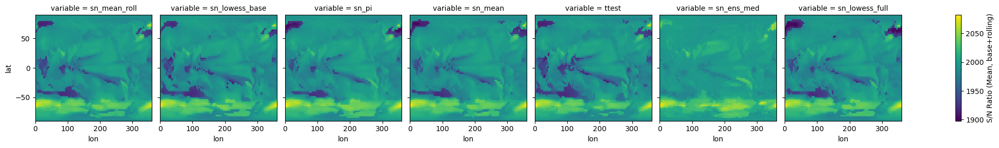

In [86]:
toe_tree_ttest.access_ssp585_tas.to_dataset().to_array().isel(member=0).plot(col='variable')

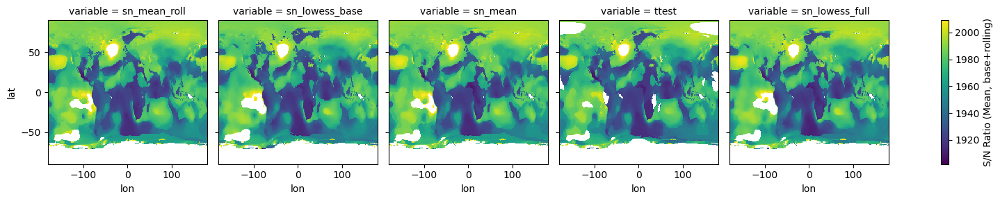

In [87]:
toe_tree_ttest.best_tas.to_dataset().to_array().plot(col='variable')

In [88]:
metric_region_agg_tree = region_agg_tree.map_over_datasets(tree_subset_vars, ['sn', 'ks', 'frac']).compute()
metric_region_agg_tree_no_hype = region_agg_tree.map_over_datasets(tree_subset_vars, ['sn', 'frac']).compute()

In [89]:
metric_region_agg_tree

<xarray.DataTree 'toe_metric'>
Group: /
├── Group: /access_ssp585_tas
│       Dimensions:  (region: 10, member: 40, time: 221)
│       Coordinates:
│           height   float64 8B 2.0
│         * member   (member) <U7 1kB 'r10i1p1' 'r11i1p1' ... 'r8i1p1' 'r9i1p1'
│         * region   (region) object 80B 'global' 'land' ... 'arctic' 'antarctic'
│         * time     (time) datetime64[ns] 2kB 1880-12-31 1881-12-31 ... 2100-12-31
│       Data variables:
│           frac     (region, member, time) float64 707kB 89.23 92.9 ... 1.267e-58
│           sn       (region, member, time) float64 707kB -0.09251 -0.07864 ... 16.94
│           ks       (region, member, time) float64 707kB 0.9935 0.9977 ... 2.017e-12
│       Attributes:
│           name:     access_ssp585_tas
├── Group: /access_ssp585_pr
│       Dimensions:  (region: 10, member: 40, time: 221)
│       Coordinates:
│         * member   (member) <U7 1kB 'r10i1p1' 'r11i1p1' ... 'r8i1p1' 'r9i1p1'
│         * region   (region) object 80B 'global' 'land' ... 'arctic' 'antarctic'
│         * time     (time) datetime64[ns] 2kB 1880-12-31 1881-12-31 ... 2100-12-31
│       Data variables:
│           frac     (region, member, time) float64 707kB 84.54 88.88 ... 4.909e-26
│           sn       (region, member, time) float64 707kB 0.05702 0.06479 ... 14.75 15.0
│           ks       (region, member, time) float64 707kB 0.9935 0.9987 ... 2.017e-12
│       Attributes:
│           name:     access_ssp585_pr
└── Group: /best_tas
        Dimensions:  (region: 10, time: 145)
        Coordinates:
          * region   (region) object 80B 'global' 'land' ... 'arctic' 'antarctic'
          * time     (time) datetime64[ns] 1kB 1880-12-31 1881-12-31 ... 2024-12-31
        Data variables:
            frac     (region, time) float64 12kB 84.86 83.39 87.2 ... 32.42 33.79 33.01
            sn       (region, time) float64 12kB 0.2787 0.2628 0.2469 ... 3.256 3.352
            ks       (region, time) float64 12kB 1.0 0.996 1.0 ... 1.267e-05 2.613e-05
        Attributes:
            name:     best_tas

In [90]:
toe_region_agg_unknown = metric_region_agg_tree_no_hype.map_over_datasets(
    partial_get_permanent_exceedance_unknown).compute()

 - test='frac' - threshold=13 - <ufunc 'less'>
 - test='sn' - threshold=3 - <ufunc 'greater_equal'>
 - test='frac' - threshold=13 - <ufunc 'less'>
 - test='sn' - threshold=3 - <ufunc 'greater_equal'>
 - test='frac' - threshold=13 - <ufunc 'less'>
 - test='sn' - threshold=3 - <ufunc 'greater_equal'>


In [91]:
toe_region_agg_unfamiliar = metric_region_agg_tree_no_hype.map_over_datasets(
    partial_get_permanent_exceedance_unfamiliar).compute()

 - test='frac' - threshold=32 - <ufunc 'less'>
 - test='sn' - threshold=2 - <ufunc 'greater_equal'>
 - test='frac' - threshold=32 - <ufunc 'less'>
 - test='sn' - threshold=2 - <ufunc 'greater_equal'>
 - test='frac' - threshold=32 - <ufunc 'less'>
 - test='sn' - threshold=2 - <ufunc 'greater_equal'>


In [92]:
toe_region_agg = metric_region_agg_tree.map_over_datasets(
    partial_get_permanent_exceedance_unusual).compute()

 - test='frac' - threshold=62 - <ufunc 'less'>
 - test='sn' - threshold=1 - <ufunc 'greater_equal'>
 - test='ks' - threshold=0.01 - <ufunc 'less'>
 - test='frac' - threshold=62 - <ufunc 'less'>
 - test='sn' - threshold=1 - <ufunc 'greater_equal'>
 - test='ks' - threshold=0.01 - <ufunc 'less'>
 - test='frac' - threshold=62 - <ufunc 'less'>
 - test='sn' - threshold=1 - <ufunc 'greater_equal'>
 - test='ks' - threshold=0.01 - <ufunc 'less'>


In [93]:
toe_unfamiliar = toe_subset_metric_tree.map_over_datasets(
    partial_get_permanent_exceedance_unfamiliar).compute()

 - test='sn_mean_roll' - threshold=2 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=2 - <ufunc 'greater_equal'>
 - test='sn_mean' - threshold=2 - <ufunc 'greater_equal'>
 - test='hd' - threshold=66 - <ufunc 'greater_equal'>
 - test='frac' - threshold=32 - <ufunc 'less'>
 - test='sn_lowess_full' - threshold=2 - <ufunc 'greater_equal'>
 - test='sn_mean_roll' - threshold=2 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=2 - <ufunc 'greater_equal'>
 - test='sn_pi' - threshold=2 - <ufunc 'greater_equal'>
 - test='sn_mean' - threshold=2 - <ufunc 'greater_equal'>
 - test='hd' - threshold=66 - <ufunc 'greater_equal'>
 - test='sn_ens_med' - threshold=2 - <ufunc 'greater_equal'>
 - test='frac' - threshold=32 - <ufunc 'less'>
 - test='sn_lowess_full' - threshold=2 - <ufunc 'greater_equal'>
 - test='sn_mean_roll' - threshold=2 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=2 - <ufunc 'greater_equal'>
 - test='sn_pi' - threshold=2 - <ufunc 'greater_equ

In [94]:
toe_unknown = toe_subset_metric_tree.map_over_datasets(
    partial_get_permanent_exceedance_unknown).compute()

 - test='sn_mean_roll' - threshold=3 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=3 - <ufunc 'greater_equal'>
 - test='sn_mean' - threshold=3 - <ufunc 'greater_equal'>
 - test='hd' - threshold=82 - <ufunc 'greater_equal'>
 - test='frac' - threshold=13 - <ufunc 'less'>
 - test='sn_lowess_full' - threshold=3 - <ufunc 'greater_equal'>
 - test='sn_mean_roll' - threshold=3 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=3 - <ufunc 'greater_equal'>
 - test='sn_pi' - threshold=3 - <ufunc 'greater_equal'>
 - test='sn_mean' - threshold=3 - <ufunc 'greater_equal'>
 - test='hd' - threshold=82 - <ufunc 'greater_equal'>
 - test='sn_ens_med' - threshold=3 - <ufunc 'greater_equal'>
 - test='frac' - threshold=13 - <ufunc 'less'>
 - test='sn_lowess_full' - threshold=3 - <ufunc 'greater_equal'>
 - test='sn_mean_roll' - threshold=3 - <ufunc 'greater_equal'>
 - test='sn_lowess_base' - threshold=3 - <ufunc 'greater_equal'>
 - test='sn_pi' - threshold=3 - <ufunc 'greater_equ

In [95]:
toe_unknown.access_ssp585_pr.max()

<xarray.DataTree 'access_ssp585_pr'>
Group: /
    Dimensions:         ()
    Data variables:
        sn_mean_roll    float64 8B 2.085e+03
        sn_lowess_base  float64 8B 2.085e+03
        sn_pi           float64 8B 2.085e+03
        sn_mean         float64 8B 2.085e+03
        hd              float64 8B 2.085e+03
        sn_ens_med      float64 8B 2.085e+03
        frac            float64 8B 2.085e+03
        sn_lowess_full  float64 8B 2.085e+03

In [96]:
# THe regions that do not everge (this is where there is no emergence at the final time step)
does_not_emerge_tree = toe_tree.map_over_datasets(get_non_emergence).compute()
does_not_emerge_unfamiliar_tree = toe_unfamiliar.map_over_datasets(get_non_emergence).compute()
does_not_emerge_unknown_tree = toe_unknown.map_over_datasets(get_non_emergence).compute()

In [97]:
toe_frac_zero_tree = xr.DataTree.from_dict({
    b: toe.get_permanent_exceedance(toe_metric_tree[b].frac, 0.1, np.less_equal).compute().to_dataset()
    for b in toe_metric_tree
})

In [98]:
toe_frac_50_tree = xr.DataTree.from_dict({
    b: toe.get_permanent_exceedance(toe_metric_tree[b].frac, 50, np.less_equal).compute().to_dataset()
    for b in toe_metric_tree
})

In [99]:
# toe_best_base_period_ds['sn_lowess_base'].plot(col='base_period', col_wrap=3)

In [100]:
toe_tree

<xarray.DataTree 'metrics'>
Group: /
├── Group: /best_tas
│       Dimensions:          (lat: 180, lon: 360)
│       Coordinates:
│         * lat              (lat) float32 720B -89.5 -88.5 -87.5 ... 87.5 88.5 89.5
│         * lon              (lon) float32 1kB -179.5 -178.5 -177.5 ... 178.5 179.5
│       Data variables:
│           frac             (lat, lon) float64 518kB nan nan ... 1.987e+03 1.987e+03
│           hd               (lat, lon) float64 518kB nan nan ... 1.984e+03 1.984e+03
│           ks               (lat, lon) float64 518kB nan nan ... 1.993e+03 1.993e+03
│           sn_hawkins_base  (lat, lon) float64 518kB nan nan ... 1.931e+03 1.931e+03
│           sn_hawkins_full  (lat, lon) float64 518kB nan nan ... 1.976e+03 1.976e+03
│           sn_lowess_base   (lat, lon) float64 518kB nan nan ... 1.989e+03 1.989e+03
│           sn_lowess_full   (lat, lon) float64 518kB nan nan ... 1.994e+03 1.994e+03
│           sn_mean          (lat, lon) float64 518kB nan nan ... 1.993e+03 1.993e+03
│           sn_mean_roll     (lat, lon) float64 518kB nan nan ... 1.992e+03 1.992e+03
│           ttest            (lat, lon) float64 518kB nan nan ... 1.991e+03 1.991e+03
│       Attributes:
│           bmax:        23.400606155395508
│           bmin:        -7.221845626831055
│           bw_method:   0.2
│           long_name:   Fractional Geometric Area
│           num_points:  1000
│           window:      30
├── Group: /access_ssp585_tas
│       Dimensions:         (lat: 72, lon: 144, member: 40)
│       Coordinates:
│         * lat             (lat) float64 576B -88.75 -86.25 -83.75 ... 86.25 88.75
│         * lon             (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
│         * member          (member) <U7 1kB 'r10i1p1' 'r11i1p1' ... 'r8i1p1' 'r9i1p1'
│           height          float64 8B 2.0
│       Data variables:
│           frac            (member, lat, lon) float64 3MB 1.997e+03 ... 1.998e+03
│           hd              (member, lat, lon) float64 3MB 1.993e+03 ... 1.995e+03
│           ks              (member, lat, lon) float64 3MB 1.993e+03 ... 1.997e+03
│           sn_lowess_base  (member, lat, lon) float64 3MB 1.997e+03 ... 1.997e+03
│           sn_lowess_full  (member, lat, lon) float64 3MB 2.002e+03 ... 1.998e+03
│           sn_mean         (member, lat, lon) float64 3MB 2.004e+03 ... 1.998e+03
│           sn_mean_roll    (member, lat, lon) float64 3MB 2.002e+03 ... 1.998e+03
│           ttest           (member, lat, lon) float64 3MB 1.987e+03 ... 1.997e+03
│           sn_pi           (member, lat, lon) float64 3MB 2e+03 2e+03 ... 1.998e+03
│           sn_ens_med      (lat, lon) float64 83kB 1.999e+03 1.999e+03 ... 1.997e+03
│       Attributes:
│           bmax:        314.4096705544513
│           bmin:        221.04195517900644
│           bw_method:   0.2
│           long_name:   Fractional Geometric Area
│           num_points:  1000
│           window:      30
└── Group: /access_ssp585_pr
        Dimensions:         (lat: 72, lon: 144, member: 40)
        Coordinates:
          * lat             (lat) float64 576B -88.75 -86.25 -83.75 ... 86.25 88.75
          * lon             (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
          * member          (member) <U7 1kB 'r10i1p1' 'r11i1p1' ... 'r8i1p1' 'r9i1p1'
        Data variables:
            frac            (member, lat, lon) float64 3MB 2.06e+03 ... 2.015e+03
            hd              (member, lat, lon) float64 3MB 2.003e+03 ... 2.013e+03
            ks              (member, lat, lon) float64 3MB 1.976e+03 ... 2.015e+03
            sn_ens_med      (lat, lon) float64 83kB 2.045e+03 2.045e+03 ... 2.021e+03
            sn_lowess_base  (member, lat, lon) float64 3MB 1.955e+03 ... 2.016e+03
            sn_lowess_full  (member, lat, lon) float64 3MB 2.015e+03 ... 2.019e+03
            sn_mean         (member, lat, lon) float64 3MB 2.016e+03 ... 2.015e+03
            sn_mean_roll    (member, lat, lon) float64 3MB 1.987e+03 ... 2.014e

In [101]:
toe_50pct_tree = toe_tree.map_over_datasets(calculate_percent_member_emergence).persist()
toe_50pct_unfamiliar_tree = toe_unfamiliar.map_over_datasets(calculate_percent_member_emergence).persist()
toe_50pct_unknown_tree = toe_unknown.map_over_datasets(calculate_percent_member_emergence).persist()

wait(toe_50pct_tree);

In [102]:
toe_50pct_tree

<xarray.DataTree 'metrics'>
Group: /
├── Group: /best_tas
│       Dimensions:          (lat: 180, lon: 360)
│       Coordinates:
│         * lat              (lat) float32 720B -89.5 -88.5 -87.5 ... 87.5 88.5 89.5
│         * lon              (lon) float32 1kB -179.5 -178.5 -177.5 ... 178.5 179.5
│       Data variables:
│           frac             (lat, lon) float64 518kB nan nan ... 1.987e+03 1.987e+03
│           hd               (lat, lon) float64 518kB nan nan ... 1.984e+03 1.984e+03
│           ks               (lat, lon) float64 518kB nan nan ... 1.993e+03 1.993e+03
│           sn_hawkins_base  (lat, lon) float64 518kB nan nan ... 1.931e+03 1.931e+03
│           sn_hawkins_full  (lat, lon) float64 518kB nan nan ... 1.976e+03 1.976e+03
│           sn_lowess_base   (lat, lon) float64 518kB nan nan ... 1.989e+03 1.989e+03
│           sn_lowess_full   (lat, lon) float64 518kB nan nan ... 1.994e+03 1.994e+03
│           sn_mean          (lat, lon) float64 518kB nan nan ... 1.993e+03 1.993e+03
│           sn_mean_roll     (lat, lon) float64 518kB nan nan ... 1.992e+03 1.992e+03
│           ttest            (lat, lon) float64 518kB nan nan ... 1.991e+03 1.991e+03
│       Attributes:
│           bmax:        23.400606155395508
│           bmin:        -7.221845626831055
│           bw_method:   0.2
│           long_name:   Fractional Geometric Area
│           num_points:  1000
│           window:      30
├── Group: /access_ssp585_tas
│       Dimensions:         (lat: 72, lon: 144)
│       Coordinates:
│         * lat             (lat) float64 576B -88.75 -86.25 -83.75 ... 86.25 88.75
│         * lon             (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
│           height          float64 8B 2.0
│       Data variables:
│           sn_mean_roll    (lat, lon) float64 83kB 1.995e+03 1.995e+03 ... 1.992e+03
│           sn_lowess_base  (lat, lon) float64 83kB 1.994e+03 1.994e+03 ... 1.993e+03
│           sn_lowess_full  (lat, lon) float64 83kB 1.995e+03 1.994e+03 ... 1.992e+03
│           sn_pi           (lat, lon) float64 83kB 1.995e+03 1.995e+03 ... 1.993e+03
│           sn_mean         (lat, lon) float64 83kB 1.994e+03 1.994e+03 ... 1.992e+03
│           ttest           (lat, lon) float64 83kB 1.984e+03 1.984e+03 ... 1.989e+03
│           hd              (lat, lon) float64 83kB 1.984e+03 1.983e+03 ... 1.986e+03
│           frac            (lat, lon) float64 83kB 1.995e+03 1.995e+03 ... 1.992e+03
│           ks              (lat, lon) float64 83kB 1.992e+03 1.992e+03 ... 1.991e+03
│           sn_ens_med      (lat, lon) float64 83kB 1.999e+03 1.999e+03 ... 1.997e+03
└── Group: /access_ssp585_pr
        Dimensions:         (lat: 72, lon: 144)
        Coordinates:
          * lat             (lat) float64 576B -88.75 -86.25 -83.75 ... 86.25 88.75
          * lon             (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
        Data variables:
            sn_mean_roll    (lat, lon) float64 83kB 2.038e+03 2.038e+03 ... 2.017e+03
            sn_lowess_base  (lat, lon) float64 83kB 2.034e+03 2.033e+03 ... 2.016e+03
            sn_lowess_full  (lat, lon) float64 83kB 2.041e+03 2.041e+03 ... 2.019e+03
            sn_pi           (lat, lon) float64 83kB 2.034e+03 2.034e+03 ... 2.016e+03
            sn_mean         (lat, lon) float64 83kB 2.039e+03 2.039e+03 ... 2.017e+03
            ttest           (lat, lon) float64 83kB 2.022e+03 2.022e+03 ... 2.01e+03
            hd              (lat, lon) float64 83kB 2.037e+03 2.035e+03 ... 2.005e+03
            frac            (lat, lon) float64 83kB 2.047e+03 2.047e+03 ... 2.013e+03
            ks              (lat, lon) float64 83kB 2.035e+03 2.035e+03 ... 2.013e+03
            sn_ens_med      (lat, lon) float64 83kB 2.045e+03 2.045e+03 ... 2.021e+03

In [103]:
does_not_emerge_50pct_tree = toe_50pct_tree.map_over_datasets(get_non_emergence).compute()
does_not_emerge_50pct_unfamiliar_tree = toe_50pct_unfamiliar_tree.map_over_datasets(get_non_emergence).compute()
does_not_emerge_50pct_unknown_tree = toe_50pct_unknown_tree.map_over_datasets(get_non_emergence).compute()

In [104]:
toe_50pct_tree

<xarray.DataTree 'metrics'>
Group: /
├── Group: /best_tas
│       Dimensions:          (lat: 180, lon: 360)
│       Coordinates:
│         * lat              (lat) float32 720B -89.5 -88.5 -87.5 ... 87.5 88.5 89.5
│         * lon              (lon) float32 1kB -179.5 -178.5 -177.5 ... 178.5 179.5
│       Data variables:
│           frac             (lat, lon) float64 518kB nan nan ... 1.987e+03 1.987e+03
│           hd               (lat, lon) float64 518kB nan nan ... 1.984e+03 1.984e+03
│           ks               (lat, lon) float64 518kB nan nan ... 1.993e+03 1.993e+03
│           sn_hawkins_base  (lat, lon) float64 518kB nan nan ... 1.931e+03 1.931e+03
│           sn_hawkins_full  (lat, lon) float64 518kB nan nan ... 1.976e+03 1.976e+03
│           sn_lowess_base   (lat, lon) float64 518kB nan nan ... 1.989e+03 1.989e+03
│           sn_lowess_full   (lat, lon) float64 518kB nan nan ... 1.994e+03 1.994e+03
│           sn_mean          (lat, lon) float64 518kB nan nan ... 1.993e+03 1.993e+03
│           sn_mean_roll     (lat, lon) float64 518kB nan nan ... 1.992e+03 1.992e+03
│           ttest            (lat, lon) float64 518kB nan nan ... 1.991e+03 1.991e+03
│       Attributes:
│           bmax:        23.400606155395508
│           bmin:        -7.221845626831055
│           bw_method:   0.2
│           long_name:   Fractional Geometric Area
│           num_points:  1000
│           window:      30
├── Group: /access_ssp585_tas
│       Dimensions:         (lat: 72, lon: 144)
│       Coordinates:
│         * lat             (lat) float64 576B -88.75 -86.25 -83.75 ... 86.25 88.75
│         * lon             (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
│           height          float64 8B 2.0
│       Data variables:
│           sn_mean_roll    (lat, lon) float64 83kB 1.995e+03 1.995e+03 ... 1.992e+03
│           sn_lowess_base  (lat, lon) float64 83kB 1.994e+03 1.994e+03 ... 1.993e+03
│           sn_lowess_full  (lat, lon) float64 83kB 1.995e+03 1.994e+03 ... 1.992e+03
│           sn_pi           (lat, lon) float64 83kB 1.995e+03 1.995e+03 ... 1.993e+03
│           sn_mean         (lat, lon) float64 83kB 1.994e+03 1.994e+03 ... 1.992e+03
│           ttest           (lat, lon) float64 83kB 1.984e+03 1.984e+03 ... 1.989e+03
│           hd              (lat, lon) float64 83kB 1.984e+03 1.983e+03 ... 1.986e+03
│           frac            (lat, lon) float64 83kB 1.995e+03 1.995e+03 ... 1.992e+03
│           ks              (lat, lon) float64 83kB 1.992e+03 1.992e+03 ... 1.991e+03
│           sn_ens_med      (lat, lon) float64 83kB 1.999e+03 1.999e+03 ... 1.997e+03
└── Group: /access_ssp585_pr
        Dimensions:         (lat: 72, lon: 144)
        Coordinates:
          * lat             (lat) float64 576B -88.75 -86.25 -83.75 ... 86.25 88.75
          * lon             (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
        Data variables:
            sn_mean_roll    (lat, lon) float64 83kB 2.038e+03 2.038e+03 ... 2.017e+03
            sn_lowess_base  (lat, lon) float64 83kB 2.034e+03 2.033e+03 ... 2.016e+03
            sn_lowess_full  (lat, lon) float64 83kB 2.041e+03 2.041e+03 ... 2.019e+03
            sn_pi           (lat, lon) float64 83kB 2.034e+03 2.034e+03 ... 2.016e+03
            sn_mean         (lat, lon) float64 83kB 2.039e+03 2.039e+03 ... 2.017e+03
            ttest           (lat, lon) float64 83kB 2.022e+03 2.022e+03 ... 2.01e+03
            hd              (lat, lon) float64 83kB 2.037e+03 2.035e+03 ... 2.005e+03
            frac            (lat, lon) float64 83kB 2.047e+03 2.047e+03 ... 2.013e+03
            ks              (lat, lon) float64 83kB 2.035e+03 2.035e+03 ... 2.013e+03
            sn_ens_med      (lat, lon) float64 83kB 2.045e+03 2.045e+03 ... 2.021e+03

<h3 style='color:green'> Time Series </h3>

In [105]:
def percent_emerged(toe_metric_ds, toe_ds, does_not_emerge_ds, return_all=False):
    # Check for null input
    if check_for_null(toe_metric_ds): return

    # print(toe_metric_ds, toe_ds, sep='\n---\n')

    # Ensure proper handling of xarray objects
    if not isinstance(toe_metric_ds, (xr.Dataset, xr.DataArray)):
        raise TypeError(f"Expected xarray.Dataset or xarray.DataArray, got {type(toe_metric_ds)}")
    
    # Ensure time dimension is valid
    if 'time' not in toe_metric_ds.dims or not hasattr(toe_metric_ds.time, 'dt'):
        raise ValueError("The 'time' dimension is missing or not a datetime array in toe_metric_ds.")

    # Apply binary emergence calculation
    binary_emergence_ds = xr.apply_ufunc(
        toe_data_an.calculate_returned_binary_ds,
        toe_metric_ds,
        toe_ds,
        toe_metric_ds.time.dt.year.values,
        input_core_dims=[['time'], [], ['time']],
        output_core_dims=[['time']],
        vectorize=True,
        dask='parallelized'
    )
    
    # Convert values to binary (1 or 0)
    binary_emergence_ds = xr.where(binary_emergence_ds == 1, 1, 0)
    # Only return where the dataset does emerge (seems to be issue for some reason)
    binary_emergence_ds = binary_emergence_ds.where(does_not_emerge_ds == 0)
    
    # Compute weights and percentage emergence
    only_1s_ds = xr.ones_like(binary_emergence_ds.isel(time=0))
    weights = toe_data_an.compute_weights(binary_emergence_ds)
    
    emergence_time_series_ds = toe_data_an.percentage_lat_lons(
        binary_emergence_ds, only_1s_ds, weights
    )

    if return_all: return emergence_time_series_ds, binary_emergence_ds, only_1s_ds
    
    return emergence_time_series_ds

In [106]:
# ets_ds, be_ds, oo_ds = percent_emerged(
#     toe_metric_tree.best_tas.to_dataset(),
#     toe_tree.best_tas.to_dataset(),
#     does_not_emerge_tree.best_tas.to_dataset(),
#     return_all=True)

In [107]:
test_toe_metric_ds = toe_metric_tree.access_ssp585_tas.to_dataset().median(dim='member').chunk('auto')
test_toe_ds = toe_tree.access_ssp585_tas.to_dataset().median(dim='member').astype(int).chunk('auto')
test_does_not_emerge_ds = does_not_emerge_tree.access_ssp585_tas.to_dataset().median(dim='member').chunk('auto')

In [108]:
toe_metric_median_tree = toe_metric_tree.median(dim='member').persist()
wait(toe_metric_median_tree);

In [109]:
ets_ds, be_ds, oo_ds = percent_emerged(
    test_toe_metric_ds,
    test_toe_ds,
    test_does_not_emerge_ds,
    return_all=True)

In [110]:
ets_ds = ets_ds.compute()

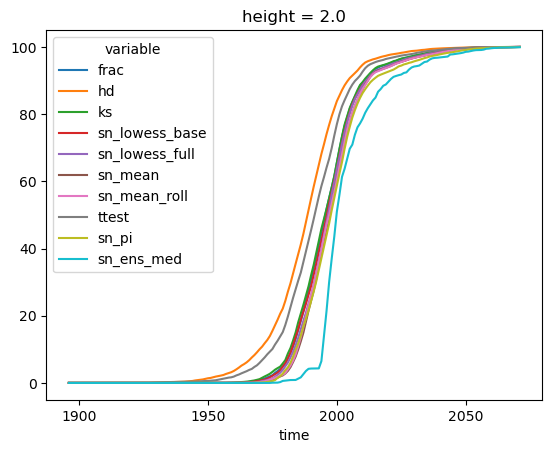

In [111]:
ets_ds.to_array().isel(time=slice(None, -15)).plot(hue='variable');

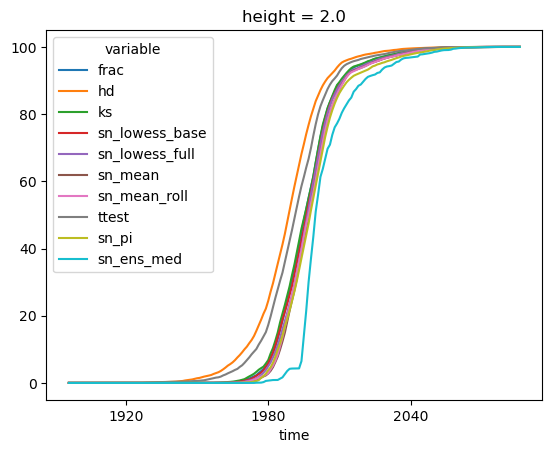

In [112]:
ets_ds.to_array().plot(hue='variable');

In [113]:
def percent_emerged_regions_over_tree(
    toe_metric_tree: xr.DataTree,
    toe_tree: xr.DataTree,
    does_not_emerge_tree: xr.DataTree,
    lsm_tree: xr.DataTree,
    logginglevel='ERROR'
) -> xr.DataTree:
    """
    Compute the percentage of emerged regions for each branch in the input trees.

    For each branch in `toe_metric_tree`, this function:
      - Converts corresponding branches in all input trees to xarray Datasets.
      - Calls `toe_data_an.percent_emerged_regions` to compute the percentage of emerged regions.
      - Stores the results in a dictionary and converts it into an xarray DataTree.

    Parameters:
        toe_metric_tree (xr.DataTree): Tree of metric data.
        toe_tree (xr.DataTree): Tree of toe data.
        does_not_emerge_tree (xr.DataTree): Tree of regions that do not emerge.
        lsm_tree (xr.DataTree): Tree of land surface mask data.

    Returns:
        xr.DataTree: A computed DataTree with time series of emerged region percentages.
    """
    utils.change_logginglevel(logginglevel)
    percent_time_dict = {}
    for branch in list(toe_metric_tree):
        logger.info(branch)
        model = branch.split('_')[0]
        lsm_da = lsm_tree[model].to_dataset().to_array().squeeze('variable')
        percent_time_dict[branch] = toe_data_an.percent_emerged_regions(
            toe_metric_tree[branch].to_dataset(),
            toe_tree[branch].to_dataset(),
            does_not_emerge_tree[branch].to_dataset(),
            lsm_da,
            logginglevel='INFO'
        )
    
    emergence_time_series_tree = xr.DataTree.from_dict(percent_time_dict)
    return emergence_time_series_tree.compute()

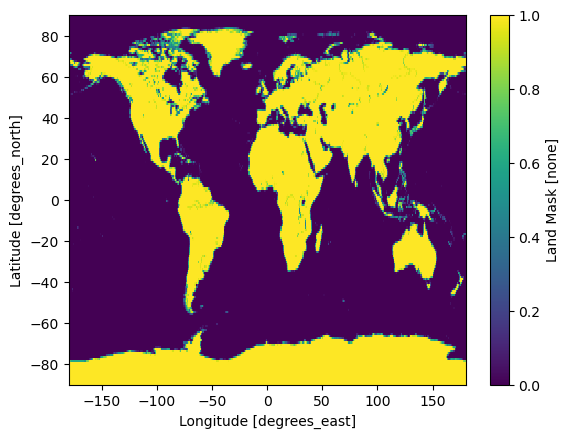

In [114]:
lsm_tree.best.land_mask.plot()

In [115]:
does_not_emerge_50pct_tree
toe_50pct_tree

<xarray.DataTree 'metrics'>
Group: /
├── Group: /best_tas
│       Dimensions:          (lat: 180, lon: 360)
│       Coordinates:
│         * lat              (lat) float32 720B -89.5 -88.5 -87.5 ... 87.5 88.5 89.5
│         * lon              (lon) float32 1kB -179.5 -178.5 -177.5 ... 178.5 179.5
│       Data variables:
│           frac             (lat, lon) float64 518kB nan nan ... 1.987e+03 1.987e+03
│           hd               (lat, lon) float64 518kB nan nan ... 1.984e+03 1.984e+03
│           ks               (lat, lon) float64 518kB nan nan ... 1.993e+03 1.993e+03
│           sn_hawkins_base  (lat, lon) float64 518kB nan nan ... 1.931e+03 1.931e+03
│           sn_hawkins_full  (lat, lon) float64 518kB nan nan ... 1.976e+03 1.976e+03
│           sn_lowess_base   (lat, lon) float64 518kB nan nan ... 1.989e+03 1.989e+03
│           sn_lowess_full   (lat, lon) float64 518kB nan nan ... 1.994e+03 1.994e+03
│           sn_mean          (lat, lon) float64 518kB nan nan ... 1.993e+03 1.993e+03
│           sn_mean_roll     (lat, lon) float64 518kB nan nan ... 1.992e+03 1.992e+03
│           ttest            (lat, lon) float64 518kB nan nan ... 1.991e+03 1.991e+03
│       Attributes:
│           bmax:        23.400606155395508
│           bmin:        -7.221845626831055
│           bw_method:   0.2
│           long_name:   Fractional Geometric Area
│           num_points:  1000
│           window:      30
├── Group: /access_ssp585_tas
│       Dimensions:         (lat: 72, lon: 144)
│       Coordinates:
│         * lat             (lat) float64 576B -88.75 -86.25 -83.75 ... 86.25 88.75
│         * lon             (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
│           height          float64 8B 2.0
│       Data variables:
│           sn_mean_roll    (lat, lon) float64 83kB 1.995e+03 1.995e+03 ... 1.992e+03
│           sn_lowess_base  (lat, lon) float64 83kB 1.994e+03 1.994e+03 ... 1.993e+03
│           sn_lowess_full  (lat, lon) float64 83kB 1.995e+03 1.994e+03 ... 1.992e+03
│           sn_pi           (lat, lon) float64 83kB 1.995e+03 1.995e+03 ... 1.993e+03
│           sn_mean         (lat, lon) float64 83kB 1.994e+03 1.994e+03 ... 1.992e+03
│           ttest           (lat, lon) float64 83kB 1.984e+03 1.984e+03 ... 1.989e+03
│           hd              (lat, lon) float64 83kB 1.984e+03 1.983e+03 ... 1.986e+03
│           frac            (lat, lon) float64 83kB 1.995e+03 1.995e+03 ... 1.992e+03
│           ks              (lat, lon) float64 83kB 1.992e+03 1.992e+03 ... 1.991e+03
│           sn_ens_med      (lat, lon) float64 83kB 1.999e+03 1.999e+03 ... 1.997e+03
└── Group: /access_ssp585_pr
        Dimensions:         (lat: 72, lon: 144)
        Coordinates:
          * lat             (lat) float64 576B -88.75 -86.25 -83.75 ... 86.25 88.75
          * lon             (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
        Data variables:
            sn_mean_roll    (lat, lon) float64 83kB 2.038e+03 2.038e+03 ... 2.017e+03
            sn_lowess_base  (lat, lon) float64 83kB 2.034e+03 2.033e+03 ... 2.016e+03
            sn_lowess_full  (lat, lon) float64 83kB 2.041e+03 2.041e+03 ... 2.019e+03
            sn_pi           (lat, lon) float64 83kB 2.034e+03 2.034e+03 ... 2.016e+03
            sn_mean         (lat, lon) float64 83kB 2.039e+03 2.039e+03 ... 2.017e+03
            ttest           (lat, lon) float64 83kB 2.022e+03 2.022e+03 ... 2.01e+03
            hd              (lat, lon) float64 83kB 2.037e+03 2.035e+03 ... 2.005e+03
            frac            (lat, lon) float64 83kB 2.047e+03 2.047e+03 ... 2.013e+03
            ks              (lat, lon) float64 83kB 2.035e+03 2.035e+03 ... 2.013e+03
            sn_ens_med      (lat, lon) float64 83kB 2.045e+03 2.045e+03 ... 2.021e+03

In [116]:
list(toe_metric_median_tree.access_ssp585_tas)

['frac',
 'hd',
 'ks',
 'sn_lowess_base',
 'sn_lowess_full',
 'sn_mean',
 'sn_mean_roll',
 'ttest',
 'sn_pi',
 'sn_ens_med']

In [117]:
list(toe_50pct_tree.access_ssp585_tas)

['sn_mean_roll',
 'sn_lowess_base',
 'sn_lowess_full',
 'sn_pi',
 'sn_mean',
 'ttest',
 'hd',
 'frac',
 'ks',
 'sn_ens_med']

In [118]:
emergence_time_series_50pct_tree = percent_emerged_regions_over_tree(
    toe_metric_median_tree.chunk({'time':-1, 'lat':'auto', 'lon':'auto'}),
    toe_50pct_tree,
    does_not_emerge_50pct_tree,
    lsm_tree
)

 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTuples.MID_LAT_SH
 - regionLatLonTuples.MID_LAT_NH
 - regionLatLonTuples.ARCTIC
 - regionLatLonTuples.ANTARCTIC
 - ['global' 'land' 'ocean' 'nh' 'sh' 'tropics' 'mid_lat_sh' 'mid_lat_nh'
 'arctic' 'antarctic']
 - access_ssp585_tas
 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTuples.MID_LAT_SH
 - regionLatLonTuples.MID_LAT_NH
 - regionLatLonTuples.ARCTIC
 - regionLatLonTuples.ANTARCTIC
 - ['global' 'land' 'ocean' 'nh' 'sh' 'tropics' 'mid_lat_sh' 'mid_lat_nh'
 'arctic' 'antarctic']
 - access_ssp585_pr
 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTupl

In [119]:
emergence_time_series_50pct_unknown_tree = percent_emerged_regions_over_tree(
    (toe_metric_median_tree.chunk({'time':-1, 'lat':'auto', 'lon':'auto'})
     .map_over_datasets(remove_vars, ['ks', 'ttest', 'sn_hawkins_full', 'sn_hawkins_base'])),
    toe_50pct_unknown_tree,
    does_not_emerge_50pct_unknown_tree,
    lsm_tree
)

 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTuples.MID_LAT_SH
 - regionLatLonTuples.MID_LAT_NH
 - regionLatLonTuples.ARCTIC
 - regionLatLonTuples.ANTARCTIC
 - ['global' 'land' 'ocean' 'nh' 'sh' 'tropics' 'mid_lat_sh' 'mid_lat_nh'
 'arctic' 'antarctic']
 - access_ssp585_tas
 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTuples.MID_LAT_SH
 - regionLatLonTuples.MID_LAT_NH
 - regionLatLonTuples.ARCTIC
 - regionLatLonTuples.ANTARCTIC
 - ['global' 'land' 'ocean' 'nh' 'sh' 'tropics' 'mid_lat_sh' 'mid_lat_nh'
 'arctic' 'antarctic']
 - access_ssp585_pr
 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTupl

In [120]:
emergence_time_series_50pct_unfamiliar_tree = percent_emerged_regions_over_tree(
    (toe_metric_median_tree.chunk({'time':-1, 'lat':'auto', 'lon':'auto'})
     .map_over_datasets(remove_vars, ['ks', 'ttest', 'sn_hawkins_full', 'sn_hawkins_base'])),
    toe_50pct_unfamiliar_tree,
    does_not_emerge_50pct_unfamiliar_tree,
    lsm_tree
)

 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTuples.MID_LAT_SH
 - regionLatLonTuples.MID_LAT_NH
 - regionLatLonTuples.ARCTIC
 - regionLatLonTuples.ANTARCTIC
 - ['global' 'land' 'ocean' 'nh' 'sh' 'tropics' 'mid_lat_sh' 'mid_lat_nh'
 'arctic' 'antarctic']
 - access_ssp585_tas
 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTuples.MID_LAT_SH
 - regionLatLonTuples.MID_LAT_NH
 - regionLatLonTuples.ARCTIC
 - regionLatLonTuples.ANTARCTIC
 - ['global' 'land' 'ocean' 'nh' 'sh' 'tropics' 'mid_lat_sh' 'mid_lat_nh'
 'arctic' 'antarctic']
 - access_ssp585_pr
 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTupl

In [121]:
emergence_time_series_50pct_tree = percent_emerged_regions_over_tree(
    toe_metric_median_tree.chunk({'time':-1, 'lat':'auto', 'lon':'auto'}),
    toe_50pct_tree,
    does_not_emerge_50pct_tree,
    lsm_tree
)

 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTuples.MID_LAT_SH
 - regionLatLonTuples.MID_LAT_NH
 - regionLatLonTuples.ARCTIC
 - regionLatLonTuples.ANTARCTIC
 - ['global' 'land' 'ocean' 'nh' 'sh' 'tropics' 'mid_lat_sh' 'mid_lat_nh'
 'arctic' 'antarctic']
 - access_ssp585_tas
 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTuples.MID_LAT_SH
 - regionLatLonTuples.MID_LAT_NH
 - regionLatLonTuples.ARCTIC
 - regionLatLonTuples.ANTARCTIC
 - ['global' 'land' 'ocean' 'nh' 'sh' 'tropics' 'mid_lat_sh' 'mid_lat_nh'
 'arctic' 'antarctic']
 - access_ssp585_pr
 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTupl

In [122]:
emergence_time_series_tree = percent_emerged_regions_over_tree(
    toe_metric_tree,
    toe_tree,
    does_not_emerge_tree,
    lsm_tree
)

 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTuples.MID_LAT_SH
 - regionLatLonTuples.MID_LAT_NH
 - regionLatLonTuples.ARCTIC
 - regionLatLonTuples.ANTARCTIC
 - ['global' 'land' 'ocean' 'nh' 'sh' 'tropics' 'mid_lat_sh' 'mid_lat_nh'
 'arctic' 'antarctic']
 - access_ssp585_tas
 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTuples.MID_LAT_SH
 - regionLatLonTuples.MID_LAT_NH
 - regionLatLonTuples.ARCTIC
 - regionLatLonTuples.ANTARCTIC
 - ['global' 'land' 'ocean' 'nh' 'sh' 'tropics' 'mid_lat_sh' 'mid_lat_nh'
 'arctic' 'antarctic']
 - access_ssp585_pr
 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTupl

In [123]:
toe_metric_tree.access_ssp585_tas

<xarray.DataTree 'access_ssp585_tas'>
Group: /access_ssp585_tas
    Dimensions:         (member: 40, lat: 72, lon: 144, time: 191)
    Coordinates:
      * lat             (lat) float64 576B -88.75 -86.25 -83.75 ... 86.25 88.75
      * lon             (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
      * member          (member) <U7 1kB 'r10i1p1' 'r11i1p1' ... 'r8i1p1' 'r9i1p1'
      * time            (time) object 2kB 1895-12-31 00:00:00 ... 2085-12-31 00:0...
        height          float64 8B 2.0
    Data variables:
        frac            (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        hd              (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        ks              (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        sn_lowess_base  (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        sn_lowess_full  (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        sn_mean         (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        sn_mean_roll    (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        ttest           (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        sn_pi           (member, lat, lon, time) float64 634MB dask.array<chunksize=(1, 72, 144, 191), meta=np.ndarray>
        sn_ens_med      (lat, lon, time) float64 16MB dask.array<chunksize=(72, 144, 191), meta=np.ndarray>
    Attributes:
        long_name:  Kolmogorov-Smirnov
        name:       access_ssp585_tas

In [124]:
emergence_time_series_unknown_tree = percent_emerged_regions_over_tree(
    toe_subset_metric_tree,
    toe_unknown,
    does_not_emerge_unknown_tree,
    lsm_tree)

 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTuples.MID_LAT_SH
 - regionLatLonTuples.MID_LAT_NH
 - regionLatLonTuples.ARCTIC
 - regionLatLonTuples.ANTARCTIC
 - ['global' 'land' 'ocean' 'nh' 'sh' 'tropics' 'mid_lat_sh' 'mid_lat_nh'
 'arctic' 'antarctic']
 - access_ssp585_tas
 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTuples.MID_LAT_SH
 - regionLatLonTuples.MID_LAT_NH
 - regionLatLonTuples.ARCTIC
 - regionLatLonTuples.ANTARCTIC
 - ['global' 'land' 'ocean' 'nh' 'sh' 'tropics' 'mid_lat_sh' 'mid_lat_nh'
 'arctic' 'antarctic']
 - access_ssp585_pr
 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTupl

In [125]:
emergence_time_series_unfamiliar_tree = percent_emerged_regions_over_tree(
    toe_subset_metric_tree,
    toe_unfamiliar,
    does_not_emerge_unfamiliar_tree,
    lsm_tree
)

 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTuples.MID_LAT_SH
 - regionLatLonTuples.MID_LAT_NH
 - regionLatLonTuples.ARCTIC
 - regionLatLonTuples.ANTARCTIC
 - ['global' 'land' 'ocean' 'nh' 'sh' 'tropics' 'mid_lat_sh' 'mid_lat_nh'
 'arctic' 'antarctic']
 - access_ssp585_tas
 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTuples.MID_LAT_SH
 - regionLatLonTuples.MID_LAT_NH
 - regionLatLonTuples.ARCTIC
 - regionLatLonTuples.ANTARCTIC
 - ['global' 'land' 'ocean' 'nh' 'sh' 'tropics' 'mid_lat_sh' 'mid_lat_nh'
 'arctic' 'antarctic']
 - access_ssp585_pr
 - regionLatLonTuples.GLOBAL
 - regionLatLonTuples.LAND
 - regionLatLonTuples.OCEAN
 - regionLatLonTuples.NH
 - regionLatLonTuples.SH
 - regionLatLonTuples.TROPICS
 - regionLatLonTupl

In [126]:
emergence_time_series_tree['access_ssp585_tas']['sn_lowess_full'].isel(member=0)#.plot(hue='region');

<xarray.DataArray 'sn_lowess_full' (region: 10, time: 191)> Size: 15kB
array([[  0.,   0.,   0., ..., 100., 100., 100.],
       [  0.,   0.,   0., ..., 100., 100., 100.],
       [  0.,   0.,   0., ..., 100., 100., 100.],
       ...,
       [  0.,   0.,   0., ..., 100., 100., 100.],
       [  0.,   0.,   0., ..., 100., 100., 100.],
       [  0.,   0.,   0., ..., 100., 100., 100.]])
Coordinates:
  * region    (region) object 80B 'global' 'land' ... 'arctic' 'antarctic'
    member    <U7 28B 'r10i1p1'
  * time      (time) object 2kB 1895-12-31 00:00:00 ... 2085-12-31 00:00:00
    height    float64 8B 2.0
    variable  <U4 16B 'mask'

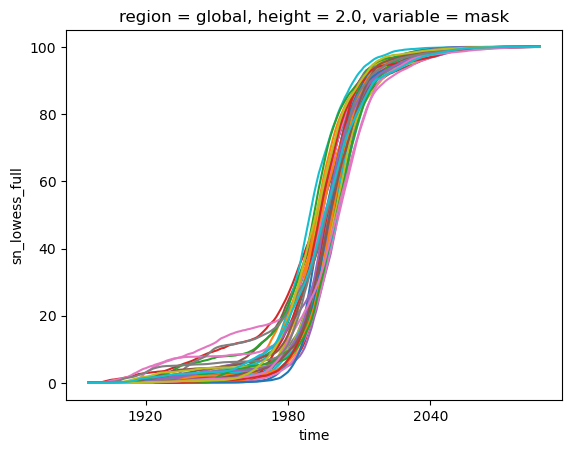

In [127]:
fig = plt.figure()
ax = fig.add_subplot()
emergence_time_series_tree['access_ssp585_tas']['sn_lowess_full'].isel(region=0).plot(ax=ax,hue='member', add_legend=False);
# ax.axvline(pd.Timestamp('2080-01-01'), color='k', linestyle='--', label='2080')

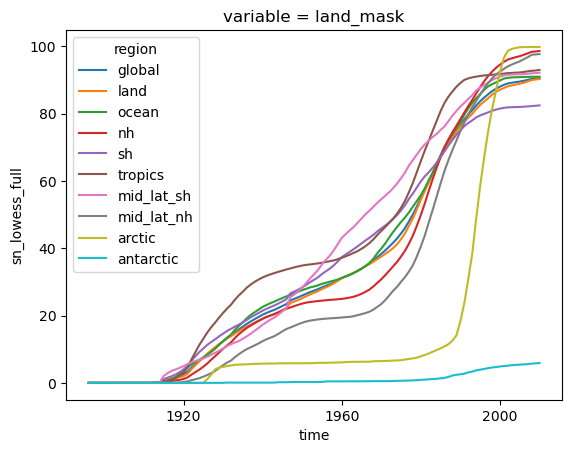

In [128]:
emergence_time_series_tree['best_tas']['sn_lowess_full'].plot(hue='region');

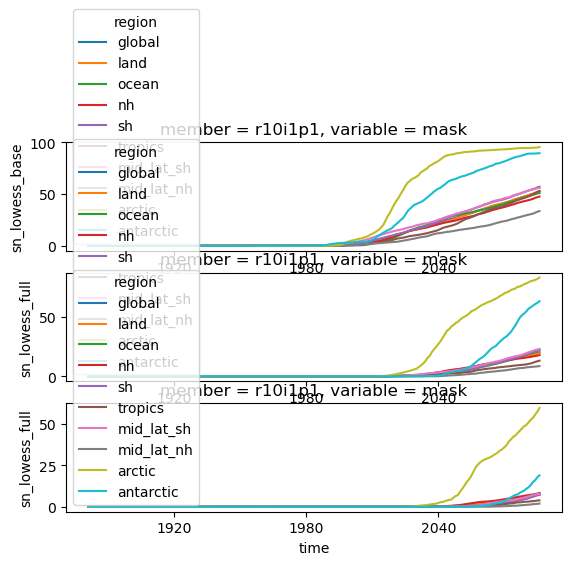

In [129]:
fig, axes = plt.subplots(3, 1)

emergence_time_series_tree['access_ssp585_pr']['sn_lowess_base'].isel(member=0).plot(ax=axes[0], hue='region');
emergence_time_series_unfamiliar_tree['access_ssp585_pr']['sn_lowess_full'].isel(member=0).plot(ax=axes[1], hue='region');
emergence_time_series_unknown_tree['access_ssp585_pr']['sn_lowess_full'].isel(member=0).plot(ax=axes[2], hue='region');

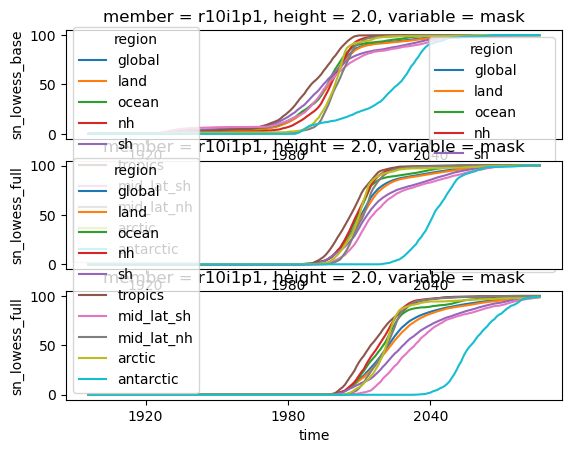

In [130]:
fig, axes = plt.subplots(3, 1)

emergence_time_series_tree['access_ssp585_tas']['sn_lowess_base'].isel(member=0).plot(ax=axes[0], hue='region');
emergence_time_series_unfamiliar_tree['access_ssp585_tas']['sn_lowess_full'].isel(member=0).plot(ax=axes[1], hue='region');
emergence_time_series_unknown_tree['access_ssp585_tas']['sn_lowess_full'].isel(member=0).plot(ax=axes[2], hue='region');

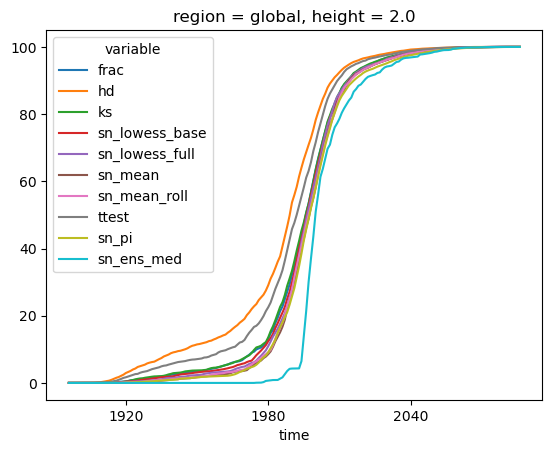

In [131]:
emergence_time_series_tree['access_ssp585_tas'].to_dataset().sel(region='global').median(dim='member').to_array().plot(hue='variable');

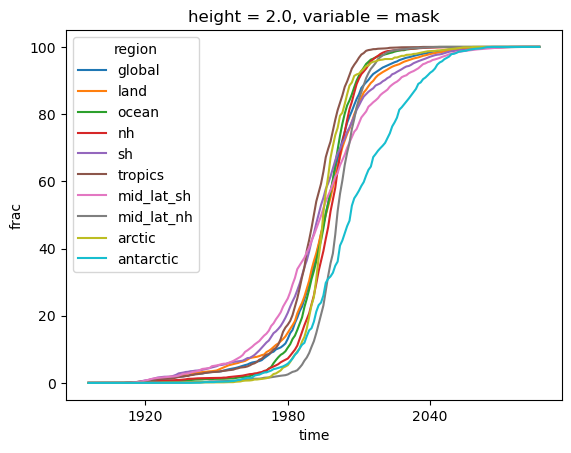

In [132]:
emergence_time_series_tree['access_ssp585_tas'].to_dataset().frac.median(dim='member').plot(hue='region');

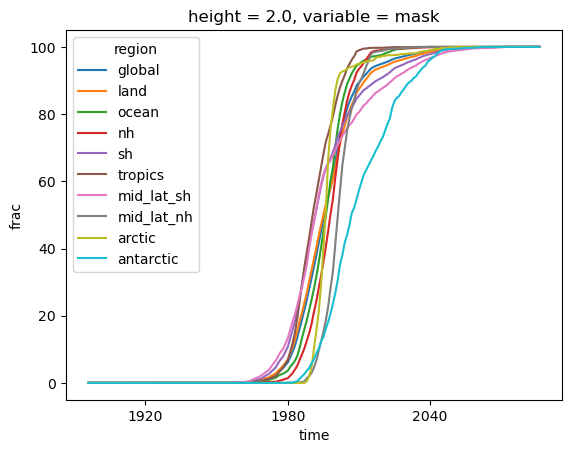

In [133]:
emergence_time_series_50pct_tree.access_ssp585_tas.frac.plot(hue='region');

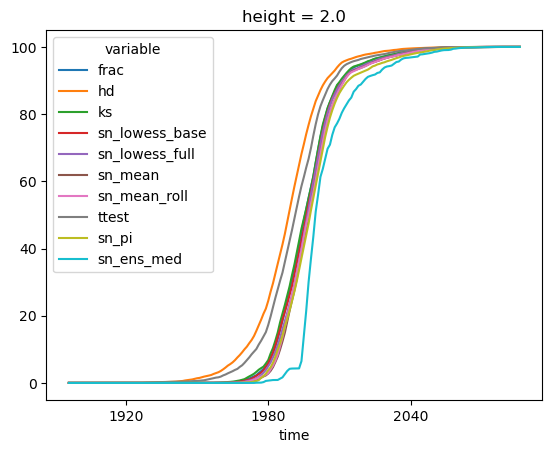

In [134]:
ets_ds.to_array().plot(hue='variable');



In [135]:
# percent_time_dict = {}
# for branch in list(toe_metric_tree):
#     print(branch)
#     percent_time_dict[branch] = toe_data_an.percent_emerged_regions(
#         toe_metric_tree[branch].to_dataset(),
#         toe_tree[branch].to_dataset(),
#         does_not_emerge_tree[branch].to_dataset(),
#         best_lsm_ds if 'best' in branch else era_lsm_ds,
#         logginglevel='INFO'
#     )

# emergence_time_series_tree = xr.DataTree.from_dict(percent_time_dict)

In [136]:
# emergence_time_series_tree = emergence_time_series_tree.compute()

<h3 style='color:green'> Emergence cross values </h3>

In [137]:
from itertools import permutations
from dataclasses import dataclass
import toe_data_analysis
reload(toe_data_analysis)

<module 'toe_data_analysis' from '/home/563/ab2313/Documents/time_of_emergene_drafts/src/toe_data_analysis.py'>

In [138]:
@dataclass(frozen=True)
class MetricPair:
    metric: str
    toe: str

In [139]:
def val_of_x_at_toe_of_y(toe_metric_da, toe_da):
    """
    Calculate the value of a metric (X) at the time of emergence (TOE) for a given dataset.

    Parameters
    ----------
    toe_metric_da : xarray.DataArray
        The data array containing the metric (X) time series from which the value at the TOE is calculated.
        It should have a 'time' dimension.
    toe_da : xarray.DataArray
        The data array representing the year of emergence (TOE). This defines the time point for which
        the value of the metric is calculated.
    
    Returns
    -------
    xarray.DataArray
        A DataArray containing the value of the metric at the time of emergence.
    """
    
    toe_x_at_y = xr.apply_ufunc(
        toe_data_analysis.find_value_at_emergence_arg,
        toe_metric_da, # Time series
        toe_da, # Year of emergence
        kwargs = {'time_years': toe_metric_da.time.dt.year.values},
        input_core_dims = [['time'], []],
        output_core_dims=[[]],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float])
    
    return toe_x_at_y

In [140]:
metrics_test_ds = toe_metric_tree['access_ssp585_tas'].to_dataset()['frac'].median(dim='member').compute()
toe_test_ds = toe_unfamiliar['access_ssp585_tas'].to_dataset()['sn_lowess_base'].median(dim='member').compute().astype(int)

In [141]:
reload(toe_data_analysis)

<module 'toe_data_analysis' from '/home/563/ab2313/Documents/time_of_emergene_drafts/src/toe_data_analysis.py'>

In [142]:
test_cross = xr.apply_ufunc(
        toe_data_analysis.find_value_at_emergence_arg,
        metrics_test_ds, # Time series
        toe_test_ds, # Year of emergence
        kwargs = {'time_years': metrics_test_ds.time.dt.year.values},
        input_core_dims = [['time'], []],
        output_core_dims=[[]],
        vectorize=True,
        # dask='parallelized',
        # output_dtypes=[float]
).compute()
    

In [143]:
test_cross.median()

<xarray.DataArray ()> Size: 8B
array(36.843299)
Coordinates:
    height   float64 8B 2.0

In [144]:
td = val_of_x_at_toe_of_y(
    metrics_test_ds.squeeze(), toe_test_ds.squeeze()
).compute()

In [145]:
def all_perms_x_at_y_emergence(toe_metric_ds, toe_ds, filtered_pairs, apply_median=False):
    """
    Generate a dataset of metric values (X) at the time of emergence (TOE) for all valid metric-TOE pairs.

    Parameters
    ----------
    toe_metric_ds : xarray.Dataset
        A dataset containing various metrics (X) as time series data.
    toe_ds : xarray.Dataset
        A dataset containing the time of emergence (TOE) for corresponding metrics.

    Returns
    -------
    xarray.Dataset
        A dataset where each variable represents a metric value (X) at its corresponding time of emergence (TOE).
        The variable names are in the format '<metric>_at_<toe>_emergence'.
        Returns None if `toe_metric_ds` contains null values.
    """
    # Check if the input dataset contains null values; exit early if so
    if check_for_null(toe_metric_ds):  return

    if apply_median and 'member' in list(toe_ds): 
        toe_metric_ds = toe_metric_ds.median(dim='member')
        toe_ds = toe_ds.median(dim='member')

    
    x_at_y_emergence_dict = {}
    for pair in filtered_pairs:
        name = f'{pair.metric}_at_{pair.toe}_emergence'
        x_at_y_emergence_da = val_of_x_at_toe_of_y(
            toe_metric_ds[pair.metric],  # Metric time series
            toe_ds[pair.toe]            # Year of emergence
        ).compute()  # Compute the result to ensure it's not lazy (useful for Dask arrays)

        x_at_y_emergence_dict[name] = x_at_y_emergence_da # pari old key
    x_at_y_emergence_ds = xr.Dataset(x_at_y_emergence_dict)
    
    return x_at_y_emergence_ds


In [146]:
# td = val_of_x_at_toe_of_y(
#     toe_metric_tree['best_tas'].to_dataset()['frac'],
#     toe_tree['best_tas'].to_dataset()['ks']
# ).compute()

In [147]:
toe_data_an.find_value_at_emergence_arg

<function toe_data_analysis.find_value_at_emergence_arg(arr: Union[numpy._typing._array_like._SupportsArray[numpy.dtype[Any]], numpy._typing._nested_sequence._NestedSequence[numpy._typing._array_like._SupportsArray[numpy.dtype[Any]]], bool, int, float, complex, str, bytes, numpy._typing._nested_sequence._NestedSequence[Union[bool, int, float, complex, str, bytes]]], year_of_emergence: int, time_years: Union[numpy._typing._array_like._SupportsArray[numpy.dtype[Any]], numpy._typing._nested_sequence._NestedSequence[numpy._typing._array_like._SupportsArray[numpy.dtype[Any]]], bool, int, float, complex, str, bytes, numpy._typing._nested_sequence._NestedSequence[Union[bool, int, float, complex, str, bytes]]]) -> float>

In [148]:
np.array(list(toe_tree['best_tas']))

array(['frac', 'hd', 'ks', 'sn_hawkins_base', 'sn_hawkins_full',
       'sn_lowess_base', 'sn_lowess_full', 'sn_mean', 'sn_mean_roll',
       'ttest'], dtype='<U15')

In [149]:
list(toe_metric_tree.best_tas)

['frac',
 'hd',
 'ks',
 'sn_hawkins_base',
 'sn_hawkins_full',
 'sn_lowess_base',
 'sn_lowess_full',
 'sn_mean',
 'sn_mean_roll',
 'ttest']

In [150]:
metrics = np.array(
    [
        'frac', 'hd', 'ks',  'ttest',# 'perkins', 
        'sn_lowess_base', 'sn_lowess_full', 'sn_mean', 'sn_mean_roll', 
    ])

In [151]:
hype_tests = {'ks', 'ttest'}

In [152]:
# Get the permutatoins of all metrics, but not when a is ttest or ks
filtered_pairs = [
    MetricPair(metric, toe)
    for metric, toe in permutations(metrics, 2)
    if metric not in hype_tests
]

In [153]:
filtered_pairs_no_hyp = [p for p in filtered_pairs
                         if ((p.metric not in hype_tests) and (p.toe not in hype_tests))]

In [154]:
len(filtered_pairs_no_hyp), len(filtered_pairs)

(30, 42)

In [155]:
filtered_pairs[0].metric

'frac'

In [156]:
filtered_pairs[0]

MetricPair(metric='frac', toe='hd')

In [157]:
filtered_pairs[:3]

[MetricPair(metric='frac', toe='hd'),
 MetricPair(metric='frac', toe='ks'),
 MetricPair(metric='frac', toe='ttest')]

In [158]:
len(filtered_pairs)

42

In [159]:
# x_at_y_emergence_with_member_tree = xr.map_over_datasets(
#     partial(
#         all_perms_x_at_y_emergence, filtered_pairs=filtered_pairs, apply_median=False),
#     toe_metric_tree,
#     toe_tree
# )

In [160]:
# x_at_y_emergence_with_member_tree.access_ssp585_tas.sn_lowess_base_at_frac_emergence.median().values.item()

In [161]:
# x_at_y_emergence_with_member_tree.access_ssp585_tas.sn_lowess_base_at_frac_emergence.median(dim='member').plot()


In [162]:
# x_at_y_emergence_with_member_tree.access_ssp585_tas.frac_at_sn_lowess_base_emergence.median(dim='member').plot()


In [163]:
x_at_y_emergence_tree = xr.map_over_datasets(
    partial(
        all_perms_x_at_y_emergence, filtered_pairs=filtered_pairs, apply_median=False),
    toe_metric_tree,
    toe_tree
)

In [164]:
x_at_y_emergence_unfamiliar_tree = xr.map_over_datasets(
    partial(
        all_perms_x_at_y_emergence, filtered_pairs=filtered_pairs_no_hyp,apply_median=False),
    toe_metric_tree,
    toe_unfamiliar
)

In [165]:
x_at_y_emergence_unknown_tree = xr.map_over_datasets(
    partial(
        all_perms_x_at_y_emergence, filtered_pairs=filtered_pairs_no_hyp, apply_median=False),
    toe_metric_tree,
    toe_unknown
)

In [166]:
x_at_y_emergence_unknown_tree.access_ssp585_tas.frac_at_sn_lowess_base_emergence.median().values.item()

20.097278668845018

In [167]:
x_at_y_emergence_unknown_tree.access_ssp585_tas.sn_lowess_base_at_frac_emergence.median().values.item()

3.666734517680199

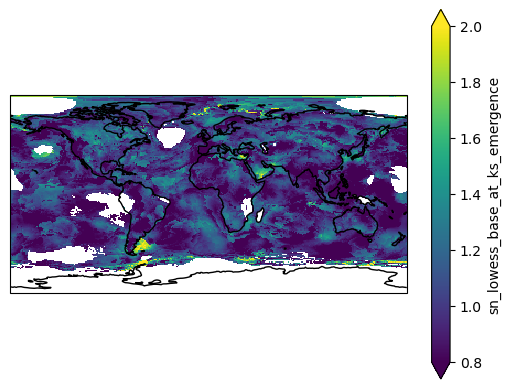

In [168]:
fig = plt.figure()
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
x_at_y_emergence_tree['best_tas'].to_dataset()['sn_lowess_base_at_ks_emergence'].plot(vmin=0.8, vmax=2, ax=ax)
ax.coastlines()

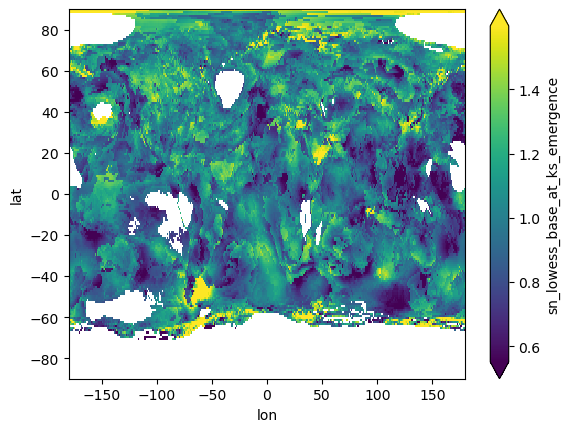

In [169]:
x_at_y_emergence_tree['best_tas'].to_dataset()['sn_lowess_base_at_ks_emergence'].plot(robust=True)

In [170]:
x_at_y_emergence_tree['best_tas'].to_dataset().mean().to_array()

<xarray.DataArray (variable: 42)> Size: 336B
array([67.60447337, 61.34777378, 64.3608325 , 60.0968262 , 58.32651688,
       57.13422266, 57.79564325, 41.184606  , 40.4493069 , 37.48615806,
       41.69590498, 43.33643705, 44.44368313, 43.80687821,  0.99935504,
        0.67269423,  1.00075136,  0.88448532,  1.18601473,  1.2209433 ,
        1.17518773,  0.91677661,  0.63014329,  0.90413754,  0.79188117,
        0.94564969,  1.06548612,  1.03839883,  0.90922132,  0.62718658,
        0.88874073,  0.77852359,  0.92501955,  1.01177045,  1.02767205,
        0.93270392,  0.6443831 ,  0.90932686,  0.7986612 ,  0.95296912,
        1.04974729,  1.0982339 ])
Coordinates:
  * variable  (variable) object 336B 'frac_at_hd_emergence' ... 'sn_mean_roll...

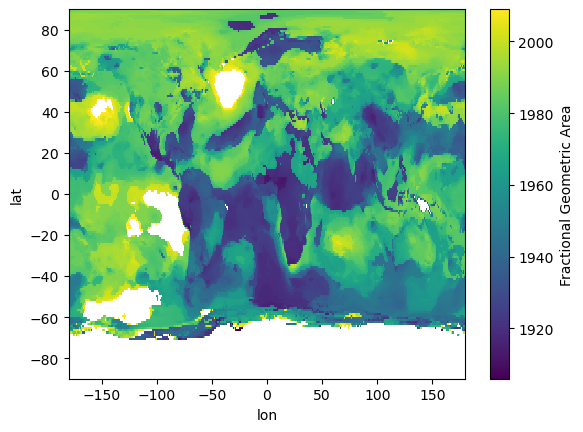

In [171]:
toe_tree.best_tas.frac.plot()

In [172]:
toe_frac_zero_tree

<xarray.DataTree>
Group: /
├── Group: /best_tas
│       Dimensions:  (lat: 180, lon: 360)
│       Coordinates:
│         * lat      (lat) float32 720B -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
│         * lon      (lon) float32 1kB -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
│       Data variables:
│           frac     (lat, lon) float64 518kB nan nan nan nan nan ... nan nan nan nan
├── Group: /access_ssp585_tas
│       Dimensions:  (lat: 72, lon: 144, member: 40)
│       Coordinates:
│         * lat      (lat) float64 576B -88.75 -86.25 -83.75 ... 83.75 86.25 88.75
│         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│         * member   (member) <U7 1kB 'r10i1p1' 'r11i1p1' ... 'r8i1p1' 'r9i1p1'
│           height   float64 8B 2.0
│       Data variables:
│           frac     (member, lat, lon) float64 3MB 2.075e+03 2.075e+03 ... 2.038e+03
└── Group: /access_ssp585_pr
        Dimensions:  (lat: 72, lon: 144, member: 40)
        Coordinates:
          * lat      (lat) float64 576B -88.75 -86.25 -83.75 ... 83.75 86.25 88.75
          * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
          * member   (member) <U7 1kB 'r10i1p1' 'r11i1p1' ... 'r8i1p1' 'r9i1p1'
        Data variables:
            frac     (member, lat, lon) float64 3MB nan nan nan ... 2.074e+03 2.074e+03

In [173]:
val_of_x_at_toe_of_y

<function __main__.val_of_x_at_toe_of_y(toe_metric_da, toe_da)>

In [174]:
sn_at_zero_overlap = val_of_x_at_toe_of_y(
    toe_metric_tree.access_ssp585_tas.sn_lowess_base,
    toe_frac_zero_tree.access_ssp585_tas
).compute().to_array()

sn_at_zero_overlap.name = 'sn_lowess_base'

In [175]:
sn_at_50_overlap = val_of_x_at_toe_of_y(
    toe_metric_tree.access_ssp585_tas.sn_lowess_base,
    toe_frac_50_tree.access_ssp585_tas
).compute().to_array()

sn_at_50_overlap.name = 'sn_lowess_base'

In [176]:
sn_at_zero_overlap.median(), sn_at_50_overlap.median()

(<xarray.DataArray 'sn_lowess_base' ()> Size: 8B
 array(6.28494589)
 Coordinates:
     height   float64 8B 2.0,
 <xarray.DataArray 'sn_lowess_base' ()> Size: 8B
 array(1.53434345)
 Coordinates:
     height   float64 8B 2.0)

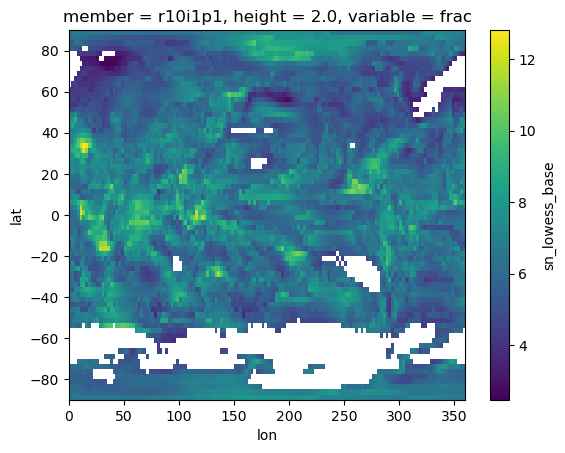

In [177]:
sn_at_zero_overlap.isel(member=0).plot()#.plot()

#### Experimental

In [178]:
def lag_one_autocorr(da):
    """
    Computes the lag-1 autocorrelation along the time dimension for an xarray DataArray.

    Parameters:
        da (xarray.DataArray): Input data with time as a dimension.

    Returns:
        xarray.DataArray: Lag-1 autocorrelation at each spatial point.
    """
    mean_x = da.mean(dim="time")
    num = ((da.shift(time=-1) - mean_x) * (da - mean_x)).sum(dim="time")
    den = ((da - mean_x) ** 2).sum(dim="time")
    
    return (num / den)#.isel(time=0)  # Drop the shifted time dimension

In [179]:
detrended_ds = data_tree.access_ssp585_tas.tas - signal_tree.access_ssp585_tas.signal_mean
detrended_ds = detrended_ds.compute()

In [180]:
lag_one_ds = lag_one_autocorr(detrended_ds)#le_pi_ds)

In [181]:
lag_one_ds = lag_one_ds.clip(min=-0.95, max=0.8)

In [182]:
N = 30
N_eff_ds = N * (1-lag_one_ds)/(1+lag_one_ds)

In [183]:
from scipy.stats import t as t_inv

In [184]:
def calcualte_t_crit(df, alpha=0.01):
    return t_inv.ppf(1 - alpha/2, df)

In [185]:
# Calculate degrees of freedom from both samples combined
df_eff_ds = 2 * N_eff_ds - 2

In [186]:
t_crit_ds = xr.apply_ufunc(
    calcualte_t_crit, 
    df_eff_ds, 
    # input_core_dims=[[]],
    vectorize=True
)

In [187]:
sn_crit_ds = t_crit_ds * np.sqrt(2/N_eff_ds)

In [188]:
xr.corr(x_at_y_emergence_tree['access_ssp585_tas'].sn_mean_at_ttest_emergence.isel(member=0),
       sn_crit_ds)

<xarray.DataArray ()> Size: 8B
array(0.29943361)
Coordinates:
    height   float64 8B 2.0

In [189]:
sn_crit_ds.median()

<xarray.DataArray ()> Size: 8B
array(0.83016322)
Coordinates:
    height   float64 8B 2.0

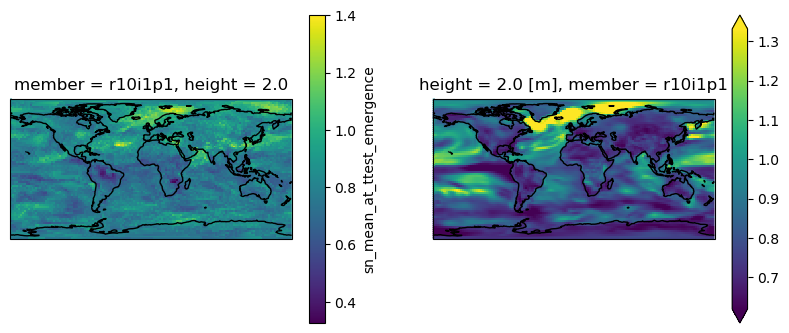

In [190]:
fig = plt.figure(figsize=(10, 4))
axes = [fig.add_subplot(1, 2, i, projection=ccrs.PlateCarree()) for i in range(1, 3)]

x_at_y_emergence_tree['access_ssp585_tas'].sn_mean_at_ttest_emergence.isel(member=0).plot(ax=axes[0])
sn_crit_ds.isel(member=0).plot(robust=True, ax=axes[1])

[ax.coastlines() for ax in axes]

(array([   336.,   5427.,  40576., 104001., 114713.,  84867.,  39888.,
         17860.,   5751.,   1301.]),
 array([-0.33855877, -0.2247029 , -0.11084702,  0.00300886,  0.11686474,
         0.23072061,  0.34457649,  0.45843237,  0.57228825,  0.68614412,
         0.8       ]),
 <BarContainer object of 10 artists>)

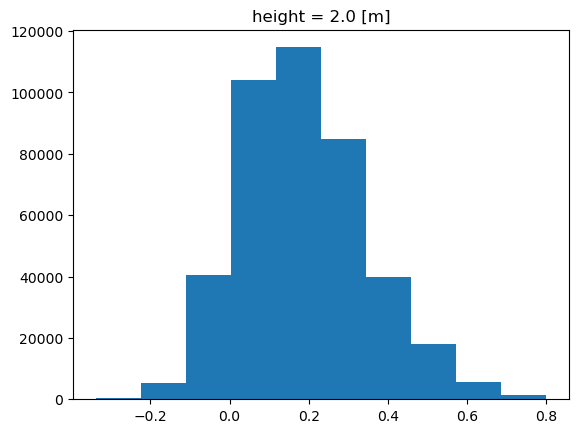

In [191]:
lag_one_ds.plot()

(array([1.09660e+04, 5.69450e+04, 1.23951e+05, 1.23288e+05, 7.32030e+04,
        2.10750e+04, 4.33000e+03, 7.50000e+02, 1.87000e+02, 2.50000e+01]),
 array([ 3.33333333,  9.07110074, 14.80886815, 20.54663556, 26.28440297,
        32.02217037, 37.75993778, 43.49770519, 49.2354726 , 54.97324001,
        60.71100742]),
 <BarContainer object of 10 artists>)

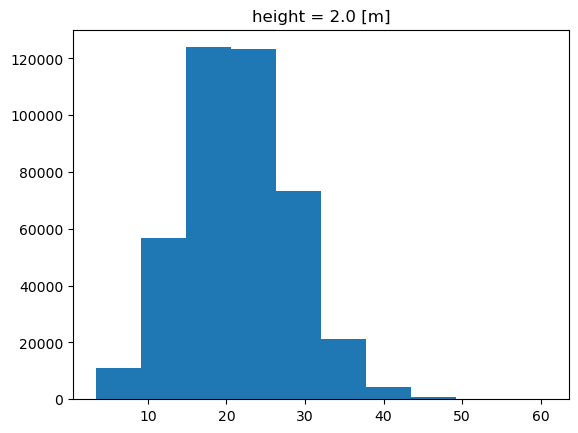

In [192]:
N_eff_ds.plot()

In [193]:
sn_crit_ds.median()

<xarray.DataArray ()> Size: 8B
array(0.83016322)
Coordinates:
    height   float64 8B 2.0

<h2 style='color:cyan; background-color:#0b3d3b; padding:10px; border-radius:5px;'> Plots </h2>

<h3 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Set-up </h3>

In [194]:
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker
from dataclasses import dataclass
from toe_plots import test_colors
from plotting_utils import create_discrete_colorbar, style_plot
from toe_plots import percent_emerged_series, METRIC_MAP,NAME_MAPPING

In [195]:
@dataclass
class PlotLevels:
    start: int
    stop: int
    step: int

    def generate_range(self):
        """Generate a numpy array based on the start, stop, and step."""
        return np.arange(self.start, self.stop, self.step)

In [196]:
std_cmap = 'OrRd'
std_levels = np.arange(0, 2.75, .25)

In [197]:
main_tests = ['sn_lowess_base', 'ks', 'frac']#'ttest', 'perkins', 'frac', 'hd']

In [198]:
# Create a custom colormap with two colors: gray and transparent
colors = [(0, 0, 0, 0), (0.5, 0.5, 0.5, 1)]  # (R, G, B, Alpha)
cmap_binary = mcolors.LinearSegmentedColormap.from_list("binary_no_color", colors)

In [199]:
start = toe_metric_tree.best_tas.time.dt.year.values[0]-5
step = 10

PLOT_LEVELS = {
    # 'best_tas': PlotLevels(start=start, stop=2020+5, step=10).generate_range(),
    'access_ssp585_tas':PlotLevels(start=start, stop=2090+step, step=step).generate_range()
}

# PLOT_LEVELS = {
#     item: LEVEL_TYPES['access'] if 'access' in item else PLOT_LEVELS['historical']
#     for item in list(toe_tree)
# }

PLOT_LEVELS['best_tas'] = PLOT_LEVELS['access_ssp585_tas']
PLOT_LEVELS['access_ssp585_pr'] = PLOT_LEVELS['access_ssp585_tas']

PLOT_LEVELS

{'access_ssp585_tas': array([1890, 1900, 1910, 1920, 1930, 1940, 1950, 1960, 1970, 1980, 1990,
        2000, 2010, 2020, 2030, 2040, 2050, 2060, 2070, 2080, 2090]),
 'best_tas': array([1890, 1900, 1910, 1920, 1930, 1940, 1950, 1960, 1970, 1980, 1990,
        2000, 2010, 2020, 2030, 2040, 2050, 2060, 2070, 2080, 2090]),
 'access_ssp585_pr': array([1890, 1900, 1910, 1920, 1930, 1940, 1950, 1960, 1970, 1980, 1990,
        2000, 2010, 2020, 2030, 2040, 2050, 2060, 2070, 2080, 2090])}

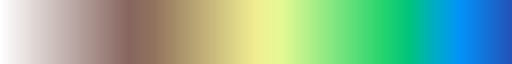

In [200]:
# Just terrain but missing last color. This is jsut so that green lines up with the year 2000
cmap_list = plt.cm.terrain_r(np.linspace(0, 1, len(PLOT_LEVELS['best_tas'])+1))
cmap_list = cmap_list[:-1]
my_cmap = mpl.colors.LinearSegmentedColormap.from_list('terrain_2' ,cmap_list)
my_cmap

In [201]:
toe_metrics_list = np.array(list(toe_tree[list(toe_tree)[0]]))
toe_metrics_list

array(['frac', 'hd', 'ks', 'sn_hawkins_base', 'sn_hawkins_full',
       'sn_lowess_base', 'sn_lowess_full', 'sn_mean', 'sn_mean_roll',
       'ttest'], dtype='<U15')

In [202]:
vars_of_interest = list(toe_tree)#['best_tas', ]'era5_2t', 'best_tas', 'era5_rx1d']
vars_of_interest

['best_tas', 'access_ssp585_tas', 'access_ssp585_pr']

In [203]:
toe_tree = toe_tree.compute()
sign_tf_tree = sign_tf_tree.compute()

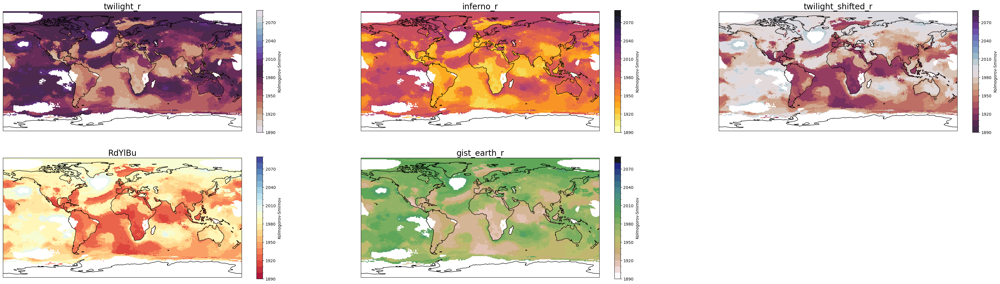

In [204]:
# colormap_list = plt.colormaps()
colormap_list = ['twilight_r', 'inferno_r', 'twilight_shifted_r', 'RdYlBu', 'gist_earth_r']
# Number of columns and rows for subplots
ncols = 3
nrows = int(np.ceil(len(colormap_list) / ncols))

# Adjust the figure size dynamically
fig = plt.figure(figsize=(ncols * 15, nrows *6))

for num, cmap in enumerate(colormap_list):
    # Calculate the subplot index
    row = num // ncols
    col = num % ncols
    ax = fig.add_subplot(nrows, ncols, num + 1, projection=ccrs.PlateCarree())
    
    toe_tree.best_tas.ks.plot(ax=ax, cmap=cmap, levels=PLOT_LEVELS['best_tas'], alpha=0.9)
    
    ax.coastlines()
    ax.set_title(cmap, fontsize=20)  # Add colormap name as title

In [205]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
# plotting_utils.hatch(ax, data_availability_tree.best_tas.to_dataset().to_array().squeeze(),
#                      **plotting_utils.no_emergence_plot_kwargs)

In [206]:
np.array(list(toe_metrics_list))

array(['frac', 'hd', 'ks', 'sn_hawkins_base', 'sn_hawkins_full',
       'sn_lowess_base', 'sn_lowess_full', 'sn_mean', 'sn_mean_roll',
       'ttest'], dtype='<U15')

In [207]:
# no_emergence_plot_kwargs = dict(
#     cmap=cmap_binary, alpha=0.5, add_colorbar=False
# )

In [208]:
no_emergence_plot_kwargs = dict(
    cmap=cmap_binary, alpha=0.5, add_colorbar=False
)

In [209]:
regions = np.array(['global', 'land', 'ocean',  'antarctic', 'mid_lat_sh', 'tropics', 'mid_lat_nh', 'arctic',])

In [210]:
def destroy_ax(ax):
    ax.cla()  # Clears the contents of the axis
    ax.set_facecolor('white')  # Sets the background color to white
    ax.set_xticks([])  # Removes x-axis ticks
    ax.set_yticks([])  # Removes y-axis ticks
    ax.set_frame_on(False)  # Hides the border/frame (optional)

In [211]:
main_toe_metrics = ('sn_lowess_base', 'ks', 'ttest', 'frac', 'hd') #, 'perkins'
main_toe_metrics_no_hype = ('sn_lowess_base', 'frac', 'hd')
regions = np.array(['global', 'tropics','arctic', 'antarctic', 'land', 'ocean'])

In [ ]:
best_metrics = [
    'sn_lowess_base', 'sn_lowess_full', 'sn_mean', 'sn_mean_roll',
    'ks', 'ttest','frac', 'hd']

sn_access_metrics = [
    'sn_lowess_base', 'sn_lowess_full', 'sn_mean', 'sn_mean_roll',
    'sn_pi', 'sn_ens_med']

access_other_metrics = ['ks', 'ttest','frac', 'hd']

best_access_metrics = [
    'sn_lowess_base', 'sn_lowess_full', 'sn_mean', 'sn_mean_roll',
    'sn_pi', 'sn_ens_med',
    'ks', 'ttest','frac', 'hd']

best_access_metrics_no_hype = [
    'sn_lowess_base', 'sn_lowess_full', 'sn_mean', 'sn_mean_roll',
    'sn_pi', 'sn_ens_med',
    'frac', 'hd']

best_metrics_no_hype = [
    'sn_lowess_base', 'sn_lowess_full', 'sn_mean', 'sn_mean_roll',
    'frac', 'hd'] 

coolest_metrics = [
    'sn_lowess_base', 'ks', 'ttest','frac', 'hd']

coolest_metrics_no_hype = [
    'sn_lowess_base','frac', 'hd']

sn_metrics = ['sn_lowess_base', 'sn_lowess_full', 'sn_mean','sn_mean_roll']

<h3 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Maps and Time Series </h3>


#### Functions

In [213]:
def plot_time_of_emergence_maps(
    toe_tree,
    emergence_time_series_tree,
    does_not_emerge_tree,
    data_availability_tree,
    # Default parameters
    tests_subset_used=None,
    tests_var_used=None,
    fontscale=1.1,
    cmap=plt.cm.RdYlBu,
    cmap_binary=None,
    toe_emergence_levels=None,

):
    """
    Plots time of emergence (ToE) maps and bottom-panel time series
    for a set of variables and metrics.

    Parameters
    ----------
    toe_tree : xarray Dataset or dict-like
        Your tree holding the time-of-emergence (ToE) data.
    emergence_time_series_tree : xarray Dataset or dict-like
        Tree holding global emergence time series data.
    does_not_emerge_tree : xarray Dataset or dict-like
        Holds data indicating where emergence does not occur.
    data_availability_tree : xarray Dataset or dict-like
        Indicates data availability.
    tests_subset_used : list, optional
        The metrics to be shown along the rows. Defaults to ['sn_lowess_base', 'ks', 'frac'].
    tests_var_used : list, optional
        The variables to be shown along the columns. Defaults to list of keys in toe_tree.
    fontscale : float, optional
        Scaling factor for fonts.
    cmap : matplotlib Colormap, optional
        Colormap to use for the ToE map. Defaults to plt.cm.RdYlBu.
    Returns
    -------
    fig : matplotlib Figure
        The generated figure.
    axes : 2D array of matplotlib Axes
        Axes for the map panels (shape = [len(tests_subset_used), len(tests_var_used)]).
    bottom_axes : list of matplotlib Axes
        Axes for the bottom time series panels.
    """
    # Default fallbacks if None

    if tests_var_used is None:
        tests_var_used = list(toe_tree.keys())
    if tests_subset_used is None:
        tests_subset_used = list(toe_tree[tests_var_used[0]])
    if cmap_binary is None:
        # Provide a default fallback or raise an error if necessary
        cmap_binary = plt.cm.binary

    fig = plt.figure(figsize=(6*len(list(tests_var_used)), 4.5*len(tests_subset_used)))
    gs  = gridspec.GridSpec(
        len(tests_subset_used)+2, len(tests_var_used),
        height_ratios = [1]*len(tests_subset_used)+[0.2]+[1],
        wspace=0.15, hspace=0.25
    )

    
    axes = np.array([
        [fig.add_subplot(gs[row, col], projection=ccrs.PlateCarree()) for col in np.arange(len(tests_var_used))]
        for row in range(len(tests_subset_used))
    ])
    
    bottom_axes = [fig.add_subplot(gs[-1, col]) for col in np.arange(len(tests_var_used))]#

    # caxes = [plt.subplot(gs[-2, col]) for col in [0, 1]]

    for col, variable in enumerate(tests_var_used):
        print(f"\nPlotting {variable}: ", end="")
        

        toe_plot_kwargs = dict(
            add_colorbar=False, levels=PLOT_LEVELS.get(variable, np.arange(1920, 2030, 10))
        )

        for row, metric in enumerate(tests_subset_used):
            print(f"{metric} ", end="")

            ax = axes[row, col]

            toe_ds = toe_tree[variable].to_dataset()[metric]
            emergence_time_series_ds = (
                emergence_time_series_tree[variable]
                .to_dataset()
                .sel(region='global')
            )

            if 'member' in toe_ds.coords:
                toe_ds = calculate_percent_member_emergence(toe_ds).compute() #.median(dim='member')
                does_not_emerge_da = xr.where(np.isnan(toe_ds), 1, 0)

            else:
  
                does_not_emerge_da = does_not_emerge_tree[variable].to_dataset()[metric]
                plotting_utils.hatch(
                    ax,
                    data_availability_tree[variable].to_dataset().to_array().squeeze(),
                    **plotting_utils.no_data_plot_kwargs
                )

            max_value  = np.max(toe_plot_kwargs['levels']-15)
            toe_ds = xr.where(toe_ds >= max_value, max_value, toe_ds)

            does_not_emerge_da.plot(ax=ax, **no_emergence_plot_kwargs)
            toe_ds.plot(cmap=cmap, ax=ax, **toe_plot_kwargs)
            
            ax.coastlines()
            add_lat_markers(ax, side='right')

            if col == 0:
                ax.annotate(
                    toe_plots.METRIC_MAP.get(metric, metric),
                    xy=(-0.17, 0.5),
                    xycoords='axes fraction',
                    rotation=0, ha='center', va='center',
                    fontsize=12*fontscale
                )
            else:
                ax.set_title('')
            if row == 0:
                ax.set_title(
                    toe_plots.NAME_MAPPING.get(variable, variable),
                    fontsize=14*fontscale
                )

        # Now add the time series in the bottom panel
        bax = bottom_axes[col]
        dataset_for_series = (emergence_time_series_ds.median(dim='member')
                              if 'member' in list(emergence_time_series_ds.coords)
                              else emergence_time_series_ds)
        
        toe_plots.percent_emerged_series(dataset_for_series,
                                         tests_subset_used, ax=bax, legend=False,
                                         fontscale=fontscale)

        bax.xaxis.set_major_locator(mticker.MultipleLocator(20))
        bax.xaxis.set_minor_locator(mticker.MultipleLocator(10))
        bax.tick_params(axis='x', rotation=45)
        bax.tick_params(axis='x', which='major', length=6, width=1)
        bax.tick_params(axis='x', which='minor', length=3, width=1)
        bax.set_xlim(np.take(toe_plot_kwargs['levels'], [0, -1]))
        
    for bax in bottom_axes: bax.set_xlabel("Time", fontsize=14*fontscale)
    bottom_axes[0].set_ylabel("Percent of Surface\nArea Emerged", fontsize=14*fontscale)
    leg = bottom_axes[0].legend(ncol=4, loc='center', bbox_to_anchor=(1.5, -.65),
                                fontsize=10*fontscale)

    cbar1 = plotting_utils.create_discrete_colorbar(
        cmap, PLOT_LEVELS['best_tas'], plt.subplot(gs[-2, :]) ,
        'Time of Emergence', fontscale=fontscale, orientation='horizontal', pad=7
    )
    # cbar2 = plotting_utils.create_discrete_colorbar(
    #     cmap, PLOT_LEVELS['access_ssp585_tas'], caxes[1],
    #     'Time of Emergence', fontscale=fontscale, orientation='horizontal', pad=7,
    # )

    return fig, axes, bottom_axes

In [214]:
def plot_percent_emerged_series(
    emergence_time_series_tree, variables=None, toe_metrics=None, regions=None,
    fig=None, axes=None, labels='ylabels'):


    if variables is None: variables = list(emergence_time_series_tree)
    if toe_metrics is None: toe_metrics = list(emergence_time_series_tree[variables[0]])
    if regions is None: regions = list(emergence_time_series_tree[variables[0]].region.values)
    
    if axes is None:
        fig = plt.figure(figsize=(4*len(variables), len(regions)))
        gs = gridspec.GridSpec(len(regions), len(variables), hspace=.1, wspace=.25)
        all_axes = []

    
    for column, var in enumerate(variables):
        percent_time_ds = emergence_time_series_tree[var].to_dataset()
        
        axes_column = [fig.add_subplot(gs[i, column]) for i in range(len(regions))] if axes is None else axes[:, column]

        for row, region in enumerate(regions):
            ax = axes_column[row]
            
            percent_time_region_ds = percent_time_ds.sel(region=region)
            if 'member' in list(percent_time_region_ds.coords):
                percent_time_region_ds = percent_time_region_ds.median(dim='member')
                
            toe_plots.percent_emerged_series(
                percent_time_region_ds, toe_metrics, ax=ax,
                legend=False, fontscale=0.65, xticks=np.arange(1890, 2110, 10)
            )
            ax.xaxis.set_major_locator(mticker.MultipleLocator(20))
            ax.xaxis.set_minor_locator(mticker.MultipleLocator(10))
            ax.tick_params(axis='x', rotation=45)
            ax.tick_params(axis='x', which='major', length=6, width=1)  # Bigger major ticks
            ax.tick_params(axis='x', which='minor', length=3, width=1)  # Smaller minor ticks
    

            if labels == 'ylabels':
        
                if column == len(variables)-1:
                    ax.set_ylabel(toe_const.NAMING_MAP.get(region, region).replace('Mid', 'Mid-\n').replace('itudes', 'itudes\n'),
                                  fontsize=10, rotation=0, labelpad=25)
                    ax.yaxis.tick_right()
                if row == 3 and column == 0:
                    ax.set_ylabel('Percent of Surface Area Emerged', fontsize=12)
            elif labels == 'annotations':
                if row == 3: 
                    ax.set_ylabel('Percent of Surface Area Emerged', fontsize=12)
                ax.annotate(
                    toe_const.NAMING_MAP.get(region, region), xy=(0.95, 0.1),
                    xycoords = 'axes fraction',
                    ha='right', va='center', fontsize=15)
                
                
            if row == 0:
                ax.xaxis.set_label_position('top')
                ax.xaxis.tick_top()
                ax.set_title(NAME_MAPPING.get(var, var))
                
            if row == 0 or row == len(regions)-1:
                ax.set_xlabel('Year', fontsize=10)
            else:
                ax.set_xlabel('')
                ax.set_xticklabels([])
                    

                
        if axes is None:
            all_axes.append(axes_column)

    midde_axes =  int(np.ceil(len(all_axes)/2)) - 1
    print(midde_axes)
    all_axes[midde_axes][-1].legend(
        fontsize=8, loc='lower center', bbox_to_anchor=(1 if len(all_axes) == 2 else 0.5, -2), ncol=3
    )

    return fig, all_axes

In [215]:
def plot_time_of_emergence_maps_single_var_with_iqr(
    toe_ds,
    does_not_emerge_ds,
    data_availability_ds,
    tests_subset_used=None,
    fontscale=1.1,
    levels:np.ndarray = np.arange(1920, 2030, 10),
    iqr_levels:np.ndarray = np.arange(0, 16, 1),
    cmap=plt.cm.terrain_r,
):
    """
    Plots time of emergence (ToE) maps and bottom-panel time series
    for a single variable and multiple metrics.
    """

    if tests_subset_used is None: tests_subset_used = list(toe_ds[tests_var_used])

    ncols = 2
    nrows = len(tests_subset_used)
    fig = plt.figure(figsize=(3.7*ncols, 2 * nrows))
    gs = gridspec.GridSpec(2, 1, hspace=0.1, height_ratios=[1, 0.05], wspace=0.2)
    axes_gs = gridspec.GridSpecFromSubplotSpec(nrows, ncols, subplot_spec=gs[0])
    axes = np.array([
        [fig.add_subplot(axes_gs[row, col], projection=ccrs.PlateCarree())
         for col in range(ncols)] for row in range(nrows)])
    caxes_gs = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs[-1])
    caxes = [plt.subplot(caxes_gs[i]) for i in [-2, -1]]
    

    toe_plot_kwargs = dict(add_colorbar=False, levels=levels)

    toe_ds_iqr = (toe_ds.quantile(0.75, dim='member') - toe_ds.quantile(0.25, dim='member')).compute()

    for row, metric in enumerate(tests_subset_used):
        print(f"{metric} ", end="")

        if 'member' in list(toe_ds[metric].coords):
            toe_ds_median = calculate_percent_member_emergence(toe_ds[metric]).compute()
            does_not_emerge_da = xr.where(np.isnan(toe_ds_median), 1, 0)
            does_not_emerge_da.plot(ax=axes[row, 0], **no_emergence_plot_kwargs)
            toe_ds_median.plot(cmap=cmap, ax=axes[row, 0], **toe_plot_kwargs, extend='max')
            

            
            toe_ds_iqr[metric].plot(cmap=cmap, ax=axes[row, 1], levels=iqr_levels, add_colorbar=False, extend='max')
            local_axes = [axes[row, 0], axes[row, 1]]

        
        else:
            toe_ds[metric].plot(cmap=cmap, ax=axes[row, 0], **toe_plot_kwargs, extend='max')
            local_axes = [axes[row, 0]]

        for ax in local_axes:
            ax.coastlines()
            add_lat_markers(ax, side='right')
            
        axes[row, 0].annotate(
            toe_plots.METRIC_MAP.get(metric, metric), xy=(-0.29, 0.5),
            xycoords='axes fraction', rotation=0, ha='center', va='center',
            fontsize=10*fontscale)

        [axes[row, col].set_title('') for col in range(ncols)]


    cbar_kwargs = dict(fontscale=fontscale, orientation='horizontal', pad=7, extend='max')
    
    cbar1 = plotting_utils.create_discrete_colorbar(
        cmap, levels, caxes[0],'Time of Emergence', tick_slice=slice(None, None, 4) ,  **cbar_kwargs)
    cbar2 = plotting_utils.create_discrete_colorbar(
        cmap, iqr_levels, caxes[1],'Interquartile Range', tick_slice=slice(None, None, 4), **cbar_kwargs)

    axes[0, 0].set_title('Median')
    axes[0, 1].set_title('Inter-Quartile Range')
    
    # for ax in axes.ravel():
        # ax.coastlines()
        # add_lat_markers(ax, side='right')
        
    return fig, axes, bottom_axes

In [216]:
def plot_time_of_emergence_maps_single_var(
    toe_ds,
    does_not_emerge_ds,
    data_availability_ds,
    tests_subset_used=None,
    fontscale=1.1,
    levels:np.ndarray = np.arange(1920, 2030, 10),
    cmap=plt.cm.RdYlBu,
    toe_emergence_levels=None,
    fig = None,
    axes = None,
    cax  = None,
    ncol=3,
    cbar_title='Time of Emergence',

):
    """
    Plots time of emergence (ToE) maps and bottom-panel time series
    for a single variable and multiple metrics.
    """

    if tests_subset_used is None:
        tests_subset_used = list(toe_ds[tests_var_used])

    if axes is None:
        num_rows = int(np.ceil(len(tests_subset_used)/ ncol))
        fig = plt.figure(figsize=(5 * ncol, 3.2 * num_rows))
        
        # Create GridSpec
        gs = gridspec.GridSpec(
            num_rows + 1, ncol,  # +1 for the colorbar row
            height_ratios=[1] * num_rows + [0.1],  # Last row reserved for colorbar
            wspace=0.2, hspace=0.2
        )
        
        # Compute empty slots
        total_slots = num_rows * ncol
        diff = total_slots - len(tests_subset_used)
        
        print(f"Empty slots: {diff}, Total plots: {len(tests_subset_used)}")
        
        # Compute positions to fill
        positions_to_fill = list(range(len(tests_subset_used)))  # Fill normally
        
        if diff == 1:
            # Fill leftmost and rightmost on last row
            positions_to_fill = positions_to_fill[:-1]
            leftmost = total_slots - ncol
            rightmost = total_slots - 1
            positions_to_fill += [leftmost+1, rightmost+1]
        elif diff == 2:
            positions_to_fill = positions_to_fill[:-1]
            # Place single plot in the center of last row
            mid_position = total_slots - ncol + (ncol // 2)
            positions_to_fill.append(mid_position)
  
        print("Final positions to fill:", positions_to_fill)
        
        # Create Axes with the specified positions
        axes = np.array([fig.add_subplot(gs[num], projection=ccrs.PlateCarree()) for num in positions_to_fill])
        
        # Create Colorbar Axis
        cax = plt.subplot(gs[-1, :])  # Colorbar at the bottom

    toe_plot_kwargs = dict(
        add_colorbar=False, levels=levels,
    )

    for num, metric in enumerate(tests_subset_used):
        print(f"{metric} ", end="")

        ax = axes[num]

        does_not_emerge_ds[metric].plot(ax=ax, **no_emergence_plot_kwargs)
        
        plotting_utils.hatch(
            ax,
            data_availability_ds.to_array().squeeze(),
            **plotting_utils.no_data_plot_kwargs
        )
        toe_ds[metric].plot(cmap=cmap, ax=ax, **toe_plot_kwargs)
        
        ax.coastlines()
        add_lat_markers(ax, side='right')

        ax.set_title(toe_plots.METRIC_MAP.get(metric, metric).replace('\n', ' '),fontsize=12 * fontscale)

    cbar1 = plotting_utils.create_discrete_colorbar(
        cmap, levels, cax, cbar_title,
        fontscale=fontscale, orientation='horizontal', pad=7,
        tick_slice=slice(None, None, 2)
    )


    return fig, axes, cax

In [217]:
def add_agg_line(axes, ds, region):
    toe_agg_df = ds.to_pandas()
    for ax, region in zip(axes, regions):
        reg_df = toe_agg_df.loc[region, :]
        for metric, loc in reg_df.items():
            # Define visual style explicitly for each metric
            label = toe_plots.METRIC_MAP.get(metric, metric)
            color = toe_plots.test_styles.get(metric, {}).get('color', 'black')
            # Define linestyle, zorder, and visibility tweaks
            if metric == 'sn':
                # linestyle = '--'
                zorder = 2
                linewidth = 2
            elif metric == 'ks':
                # linestyle = '-.'
                zorder = 3
                linewidth = 2
            elif metric == 'frac':
                # linestyle = '-'
                zorder = 4
                linewidth = 2.5  # Slightly thicker to stand out
            ax.axvline(loc, label=label, linewidth=1.5, linestyle='-', color=color)

#### Time Series

In [218]:
list(toe_region_agg_unfamiliar.best_tas.region.values)

['global',
 'land',
 'ocean',
 'nh',
 'sh',
 'tropics',
 'mid_lat_sh',
 'mid_lat_nh',
 'arctic',
 'antarctic']

In [219]:
best_metrics_no_hype

['sn_lowess_base', 'sn_lowess_full', 'sn_mean', 'sn_mean_roll', 'frac', 'hd']

0


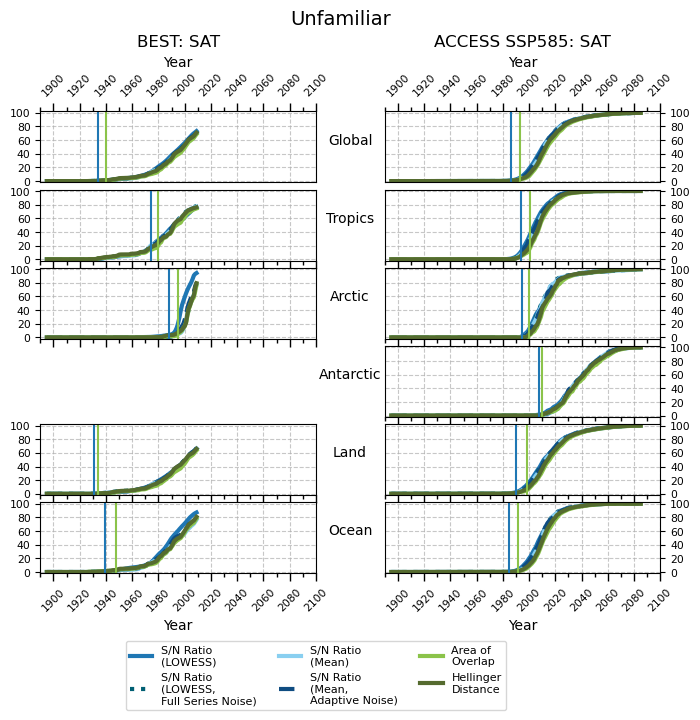

In [220]:
fig, axes = plot_percent_emerged_series(emergence_time_series_unfamiliar_tree,
                                        variables=['best_tas', 'access_ssp585_tas'],
                                        toe_metrics=best_metrics_no_hype, regions=regions)
fig.suptitle('Unfamiliar', fontsize=14, y=1.05);

add_agg_line(axes[0],  toe_region_agg_unfamiliar.best_tas.to_dataset(), regions)
add_agg_line(axes[1],  toe_region_agg_unfamiliar.access_ssp585_tas.to_dataset().median(dim='member'), regions)
destroy_ax(axes[0][3])
# add_agg_line(axes[2],  toe_region_agg_unfamiliar.access_ssp585_pr.to_dataset().median(dim='member'), regions)

0


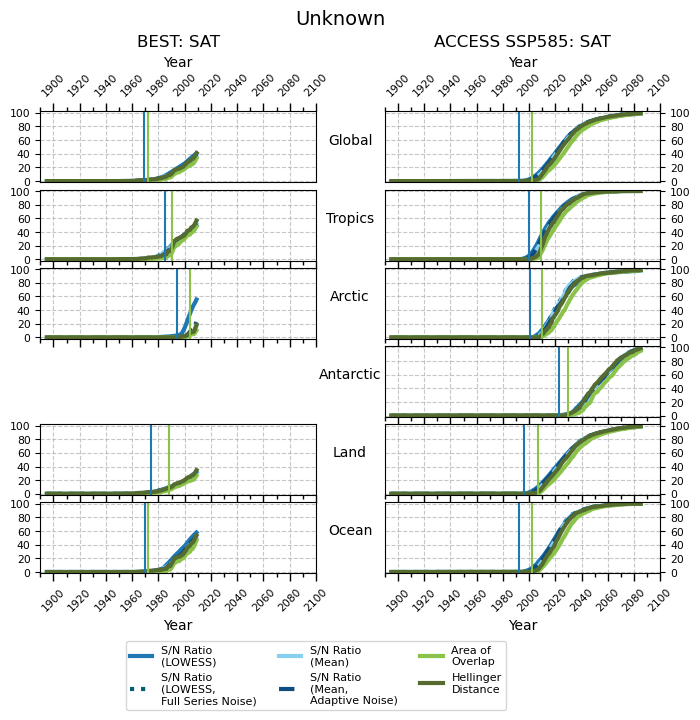

In [221]:
fig, axes = plot_percent_emerged_series(
    emergence_time_series_unknown_tree, variables=['best_tas', 'access_ssp585_tas'],
    toe_metrics=best_metrics_no_hype, regions=regions)
fig.suptitle('Unknown', fontsize=14, y=1.05);

add_agg_line(axes[0],  toe_region_agg_unknown.best_tas.to_dataset(), regions)
add_agg_line(axes[1],  toe_region_agg_unknown.access_ssp585_tas.to_dataset().median(dim='member'), regions)
destroy_ax(axes[0][3])
# add_agg_line(axes[2],  toe_region_agg_unfamiliar.access_ssp585_pr.to_dataset().median(dim='member'), regions)

0


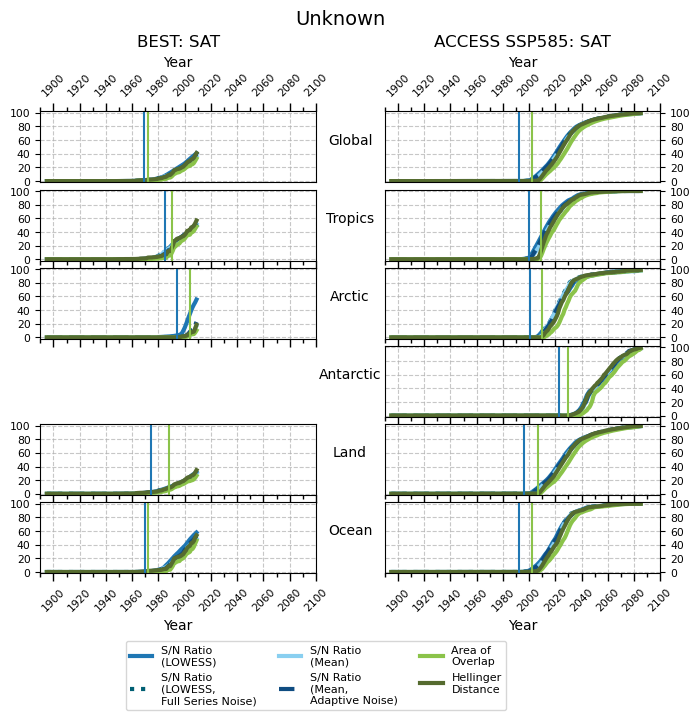

In [222]:
fig, axes = plot_percent_emerged_series(
    emergence_time_series_50pct_unknown_tree, variables=['best_tas', 'access_ssp585_tas'],
    toe_metrics=best_metrics_no_hype, regions=regions)
fig.suptitle('Unknown', fontsize=14, y=1.05);

add_agg_line(axes[0],  toe_region_agg_unknown.best_tas.to_dataset(), regions)
add_agg_line(axes[1],  toe_region_agg_unknown.access_ssp585_tas.to_dataset().median(dim='member'), regions)
destroy_ax(axes[0][3])
# add_agg_line(axes[2],  toe_region_agg_unfamiliar.access_ssp585_pr.to_dataset().median(dim='member'), regions)

In [223]:
# fig, axes = plot_percent_emerged_series(emergence_time_series_unknown_tree, toe_metrics=main_toe_metrics_no_hype, regions=regions)
# fig.suptitle('Unknown', fontsize=14, y=1.05);
# add_agg_line(axes[0],  toe_region_agg_unknown.best_tas.to_dataset(), regions)
# add_agg_line(axes[1],  toe_region_agg_unknown.access_ssp585_tas.to_dataset().median(dim='member'), regions)
# add_agg_line(axes[2],  toe_region_agg_unknown.access_ssp585_pr.to_dataset().median(dim='member'), regions)

In [224]:
variable = 'access_ssp585_pr'

In [225]:
toe_best_agg_ds = toe_region_agg[variable].to_dataset()
# toe_best_agg_df = toe_best_agg_ds.to_pandas()
toe_best_agg_ds_stats = toe_best_agg_ds.quantile([0.25, 0.5, 0.75], dim='member').compute()
# toe_best_agg_df_med = .median().to_pandas()

In [226]:
toe_best_agg_df = (toe_best_agg_ds_stats.sel(quantile=0.5)
                   .drop_vars('quantile')
                   .to_pandas()
                   .astype(int).astype(str))

In [227]:
toe_best_agg_iqr_df = (
    (toe_best_agg_ds_stats.sel(quantile=0.75) - toe_best_agg_ds_stats.sel(quantile=0.25))
    .drop_vars('quantile', errors='ignore')
    .to_pandas()
    .astype(int).astype(str))

In [228]:
print(toe_best_agg_df + ' ('+ toe_best_agg_iqr_df +')')

                   sn         ks       frac
region                                     
global       2008 (5)   2010 (5)  2005 (40)
land        2045 (40)  2050 (37)  2050 (36)
ocean        2009 (6)   2009 (6)   2008 (7)
nh           2021 (6)   2022 (6)   2022 (7)
sh          2075 (17)  2076 (15)  2080 (20)
tropics      2011 (4)   2011 (4)   2011 (5)
mid_lat_sh  2050 (12)   2048 (9)  2048 (10)
mid_lat_nh   2026 (7)   2027 (7)   2026 (8)
arctic      1999 (10)  2001 (13)  2002 (15)
antarctic   1982 (13)  1984 (14)  1984 (12)


In [229]:
# toe_access_agg_df = (toe_region_agg.best_tas.to_dataset()
#                      .drop_vars('height', errors='ignore').to_pandas())

In [230]:
regions = np.array(['global', 'land', 'ocean', 'antarctic', 'mid_lat_sh', 'tropics',
       'mid_lat_nh', 'arctic'])

1


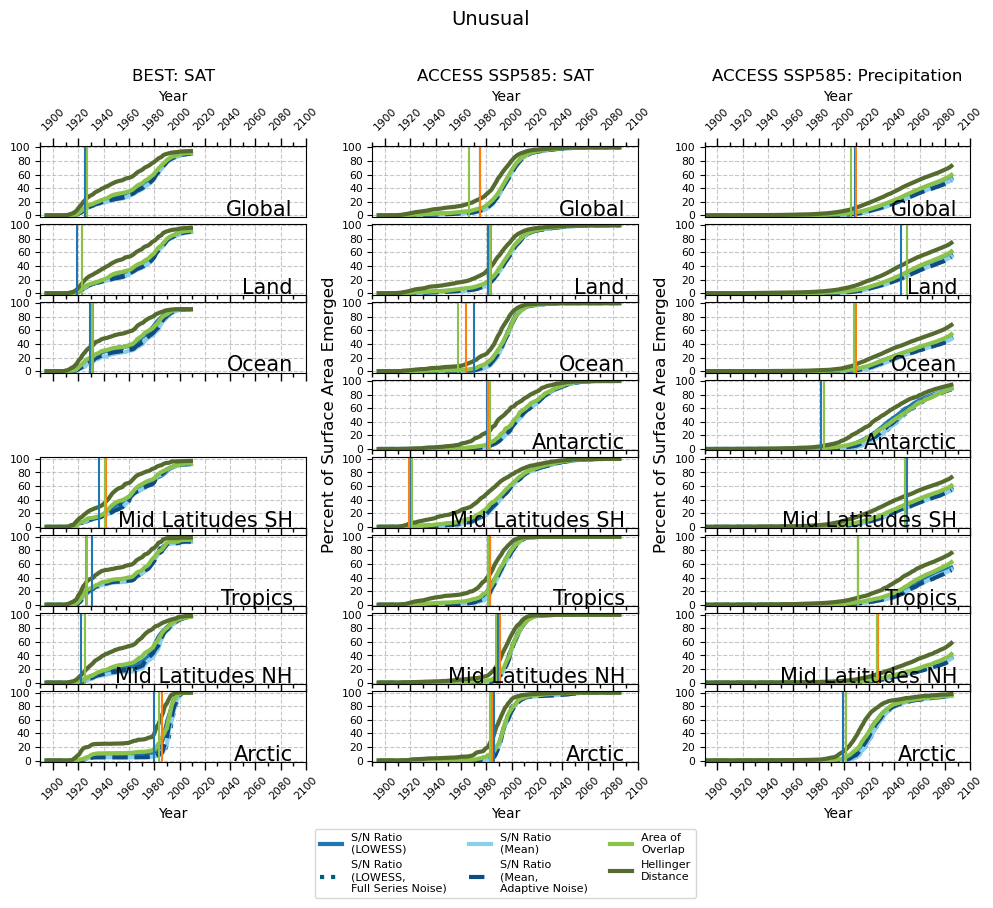

In [231]:
fig, axes = plot_percent_emerged_series(
    emergence_time_series_tree, toe_metrics=best_metrics_no_hype, regions=regions,
    labels='annotations')
fig.suptitle('Unusual', fontsize=14, y=1.05);
add_agg_line(axes[0],  toe_region_agg.best_tas.to_dataset(), regions)
add_agg_line(axes[1],  toe_region_agg.access_ssp585_tas.to_dataset().median(dim='member'), regions)
add_agg_line(axes[2],  toe_region_agg.access_ssp585_pr.to_dataset().median(dim='member'), regions)

destroy_ax(axes[0][3])

#### Maps

In [232]:
PLOT_LEVELS

{'access_ssp585_tas': array([1890, 1900, 1910, 1920, 1930, 1940, 1950, 1960, 1970, 1980, 1990,
        2000, 2010, 2020, 2030, 2040, 2050, 2060, 2070, 2080, 2090]),
 'best_tas': array([1890, 1900, 1910, 1920, 1930, 1940, 1950, 1960, 1970, 1980, 1990,
        2000, 2010, 2020, 2030, 2040, 2050, 2060, 2070, 2080, 2090]),
 'access_ssp585_pr': array([1890, 1900, 1910, 1920, 1930, 1940, 1950, 1960, 1970, 1980, 1990,
        2000, 2010, 2020, 2030, 2040, 2050, 2060, 2070, 2080, 2090])}

In [233]:
# fig, axes, bottom_axes = plot_time_of_emergence_maps(
#     toe_tree=toe_50pct_emergence_tree,
#     emergence_time_series_tree=emergence_time_series_tree,
#     does_not_emerge_tree=does_not_emerge_50pct_tree,
#     data_availability_tree=data_availability_tree,
#     tests_subset_used = main_tests,
#     cmap=plt.cm.terrain_r
# )

In [234]:
toe_region_agg.best_tas.sel(region='global')

<xarray.DataTree 'best_tas'>
Group: /
    Dimensions:  ()
    Coordinates:
        region   <U6 24B 'global'
    Data variables:
        sn       float64 8B 1.925e+03
        ks       float64 8B 1.927e+03
        frac     float64 8B 1.927e+03

In [235]:
reload(plotting_utils)

<module 'plotting_utils' from '/home/563/ab2313/Documents/time_of_emergene_drafts/src/plotting_utils.py'>

In [236]:
def add_data_clarity_legend(ax, bbox_to_anchor=(0.42, -0.02), fontsize=10, ncol=2):
    # Add a legend for both the hatching and "Does Not Emerge"
    legend_elements = [
        plt.Rectangle([0, 0], 1, 1, fc='white', hatch='//', edgecolor='black', lw=0.5),
        plt.Rectangle([0, 0], 1, 1, fc='grey', alpha=0.5)  # Gray for "Does Not Emerge"
    ]
    legend_labels = ['Not Enough Data', 'Does Not Emerge']
    legend = ax.legend(legend_elements, legend_labels, loc='upper center',
                               bbox_to_anchor=bbox_to_anchor, fontsize=fontsize, ncol=ncol)


Plotting best_tas: sn_lowess_base ks frac 
Plotting access_ssp585_tas: sn_lowess_base ks frac 
Plotting access_ssp585_pr: sn_lowess_base ks frac 

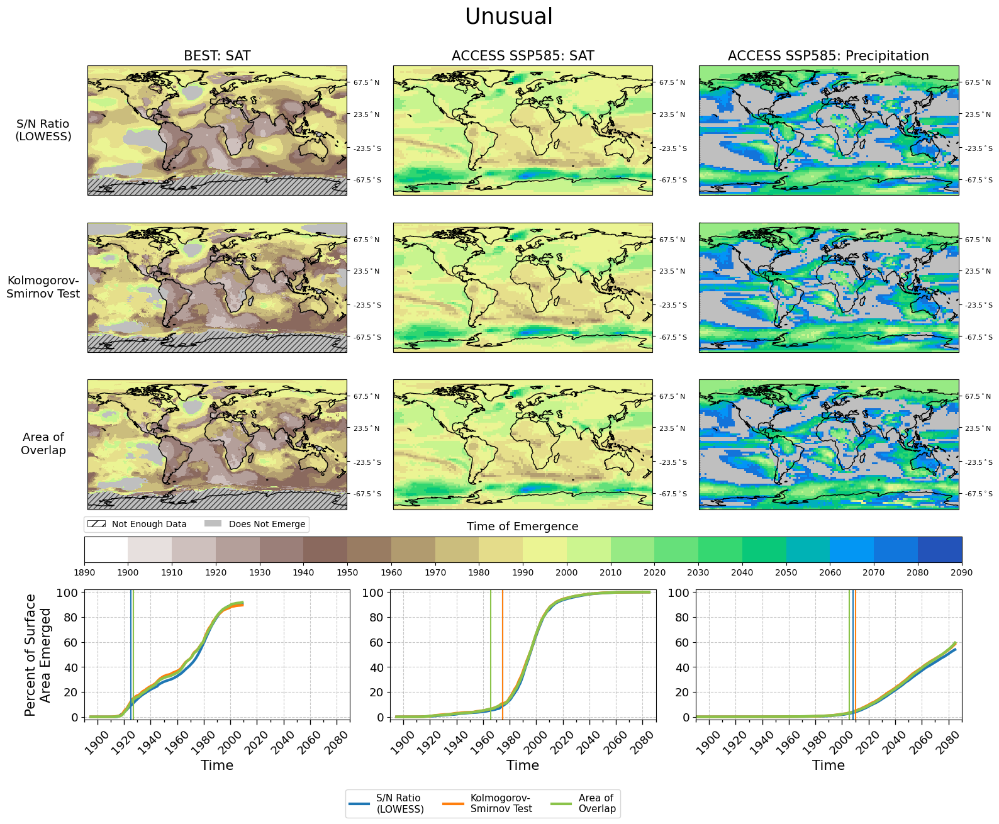

In [237]:
fig, axes, bottom_axes = plot_time_of_emergence_maps(
    toe_tree=toe_tree,
    emergence_time_series_tree=emergence_time_series_tree,
    does_not_emerge_tree=does_not_emerge_tree,
    data_availability_tree=data_availability_tree,
    tests_subset_used = main_tests,
    cmap=my_cmap, #plt.cm.terrain_r
)


add_data_clarity_legend(axes[-1][-3])

regions_main = ['global']
fig.suptitle('Unusual', fontsize=25, y=0.95);
add_agg_line([bottom_axes[0]],  toe_region_agg.best_tas.to_dataset(), regions_main)
add_agg_line([bottom_axes[1]],  toe_region_agg.access_ssp585_tas.to_dataset().median(dim='member'), regions_main)
add_agg_line([bottom_axes[2]],  toe_region_agg.access_ssp585_pr.to_dataset().median(dim='member'), regions_main)

In [238]:
iqr_levels = np.arange(0, 2*len(PLOT_LEVELS['access_ssp585_tas'])+2, 2)

In [239]:
best_access_metrics

['sn_lowess_base',
 'sn_lowess_full',
 'sn_mean',
 'sn_mean_roll',
 'sn_pi',
 'sn_ens_med',
 'ks',
 'ttest',
 'frac',
 'hd']

In [240]:
reload(toe_plots)

<module 'toe_plots' from '/home/563/ab2313/Documents/time_of_emergene_drafts/src/toe_plots.py'>

sn_lowess_base sn_lowess_full sn_mean sn_mean_roll sn_pi sn_ens_med 

Text(0.5, 0.92, 'ACCESS SSP585: SAT - Unusual')

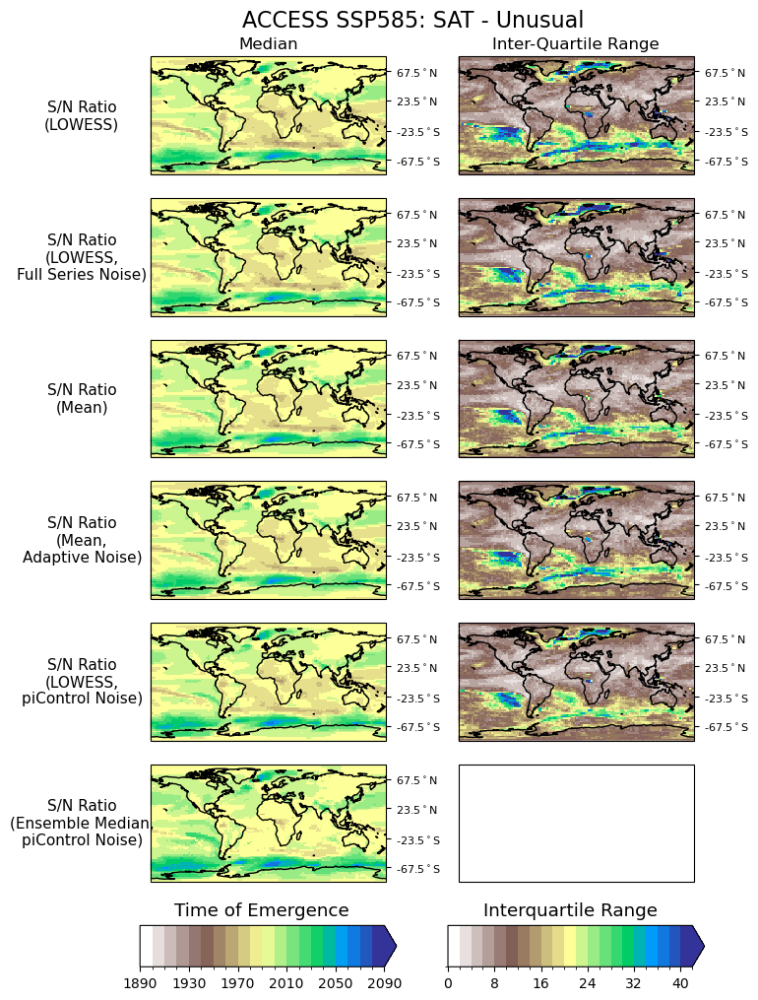

In [241]:
fig, axes, bottom_axes = plot_time_of_emergence_maps_single_var_with_iqr(
    toe_ds=toe_tree['access_ssp585_tas'].to_dataset(),
    does_not_emerge_ds=does_not_emerge_tree['access_ssp585_tas'].to_dataset(),
    data_availability_ds=data_availability_tree['access_ssp585_tas'].to_dataset(),
    tests_subset_used = sn_access_metrics,
    levels = PLOT_LEVELS['access_ssp585_tas'],
    iqr_levels = iqr_levels
);
fig.suptitle(toe_plots.NAME_MAPPING['access_ssp585_tas'] + ' - Unusual', fontsize=16, y=0.92)

ks ttest frac hd 

Text(0.5, 0.98, 'ACCESS SSP585: SAT - Unusual')

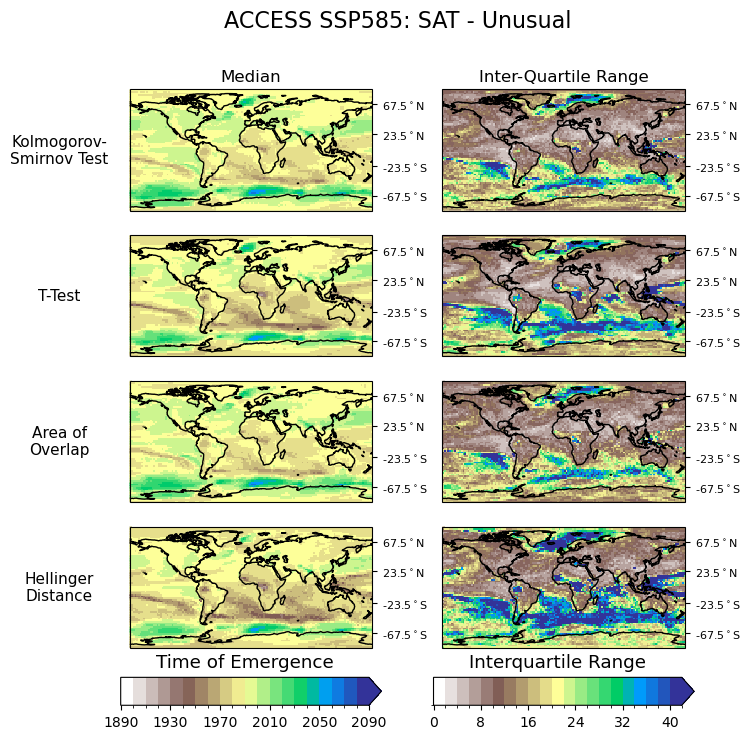

In [242]:
fig, axes, bottom_axes = plot_time_of_emergence_maps_single_var_with_iqr(
    toe_ds=toe_tree['access_ssp585_tas'].to_dataset(),
    does_not_emerge_ds=does_not_emerge_tree['access_ssp585_tas'].to_dataset(),
    data_availability_ds=data_availability_tree['access_ssp585_tas'].to_dataset(),
    tests_subset_used = access_other_metrics,
    levels = PLOT_LEVELS['access_ssp585_tas'],
    iqr_levels = iqr_levels
);
fig.suptitle(toe_plots.NAME_MAPPING['access_ssp585_tas'] + ' - Unusual', fontsize=16, y=0.98)

sn_lowess_base sn_lowess_full sn_mean sn_mean_roll sn_pi sn_ens_med 

Text(0.5, 0.92, 'ACCESS SSP585: Precipitation - Unusual')

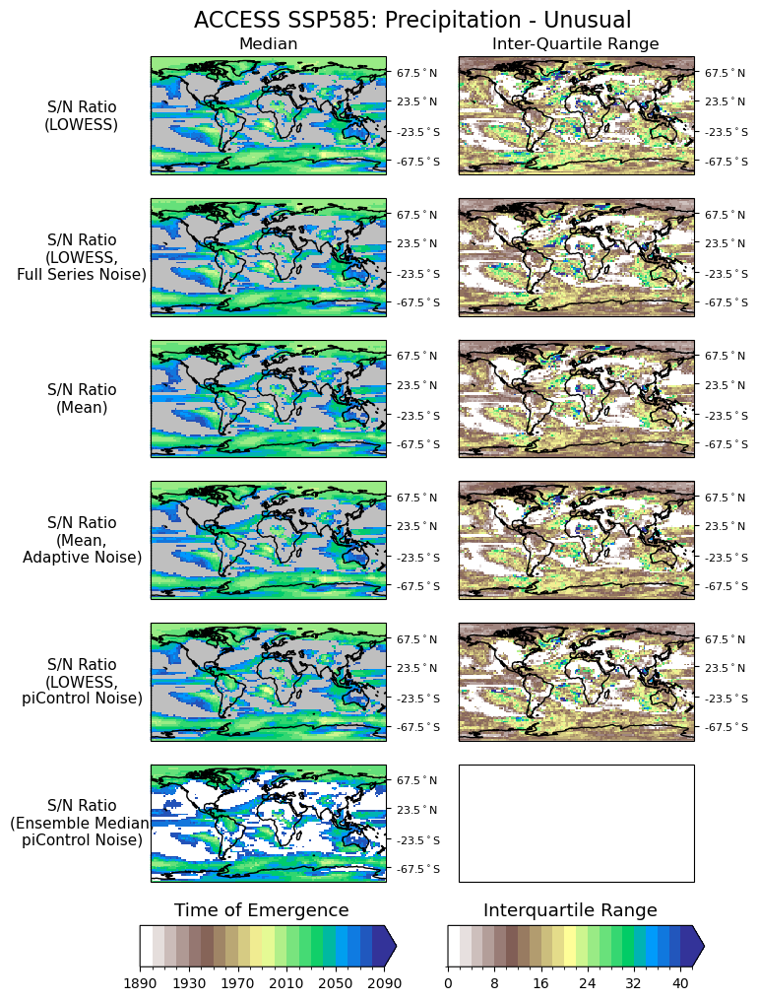

In [243]:
fig, axes, bottom_axes = plot_time_of_emergence_maps_single_var_with_iqr(
    toe_ds=toe_tree['access_ssp585_pr'].to_dataset(),
    does_not_emerge_ds=does_not_emerge_tree['access_ssp585_pr'].to_dataset(),
    data_availability_ds=data_availability_tree['access_ssp585_pr'].to_dataset(),
    tests_subset_used = sn_access_metrics,
    levels = PLOT_LEVELS['access_ssp585_pr'],
    iqr_levels = iqr_levels
);
fig.suptitle(toe_plots.NAME_MAPPING['access_ssp585_pr'] + ' - Unusual', fontsize=16, y=0.92)

ks ttest frac hd 

Text(0.5, 0.98, 'ACCESS SSP585: Precipitation - Unusual')

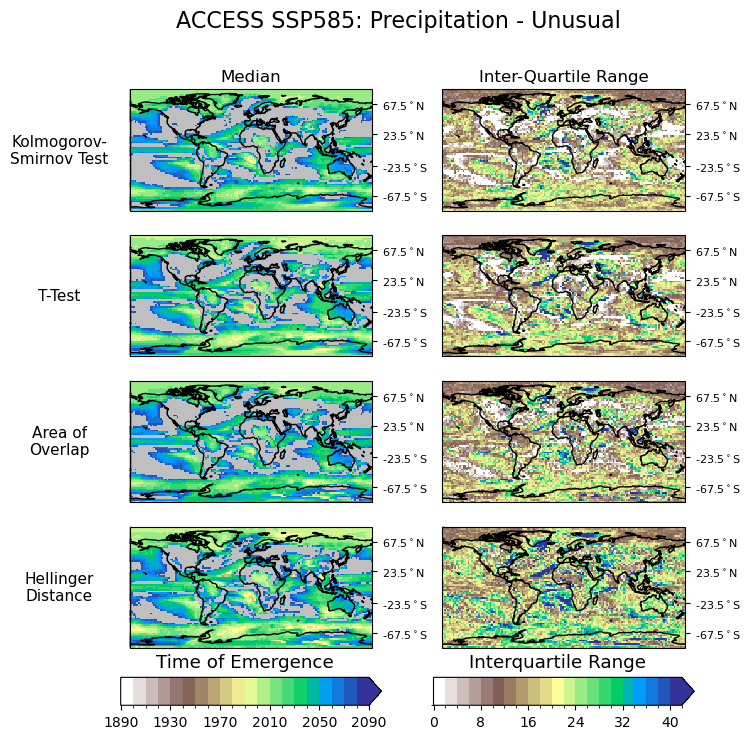

In [244]:
fig, axes, bottom_axes = plot_time_of_emergence_maps_single_var_with_iqr(
    toe_ds=toe_tree['access_ssp585_pr'].to_dataset(),
    does_not_emerge_ds=does_not_emerge_tree['access_ssp585_pr'].to_dataset(),
    data_availability_ds=data_availability_tree['access_ssp585_pr'].to_dataset(),
    tests_subset_used = access_other_metrics,
    levels = PLOT_LEVELS['access_ssp585_pr'],
    iqr_levels = iqr_levels
);
fig.suptitle(toe_plots.NAME_MAPPING['access_ssp585_pr'] + ' - Unusual', fontsize=16, y=0.98)

sn_lowess_base frac hd 

Text(0.5, 0.98, 'ACCESS SSP585: Precipitation - Unfamiliar')

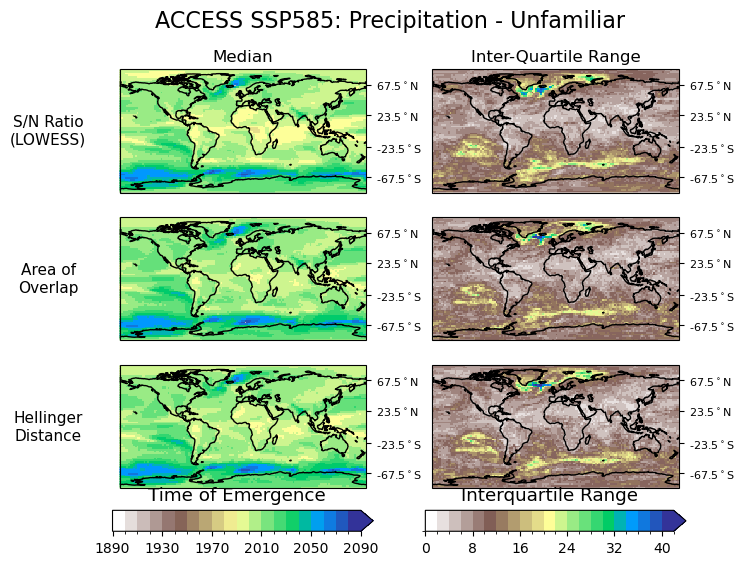

In [245]:
fig, axes, bottom_axes = plot_time_of_emergence_maps_single_var_with_iqr(
    toe_ds=toe_unfamiliar['access_ssp585_tas'].to_dataset(),
    does_not_emerge_ds=does_not_emerge_unfamiliar_tree['access_ssp585_tas'].to_dataset(),
    data_availability_ds=data_availability_tree['access_ssp585_tas'].to_dataset(),
    tests_subset_used = coolest_metrics_no_hype,#sn_access_metrics
    levels = PLOT_LEVELS['access_ssp585_tas'],
    iqr_levels = iqr_levels
);
fig.suptitle(toe_plots.NAME_MAPPING['access_ssp585_pr'] + ' - Unfamiliar', fontsize=16, y=0.98)

sn_lowess_base frac hd 

Text(0.5, 0.95, 'ACCESS SSP585: SAT - Unfamiliar')

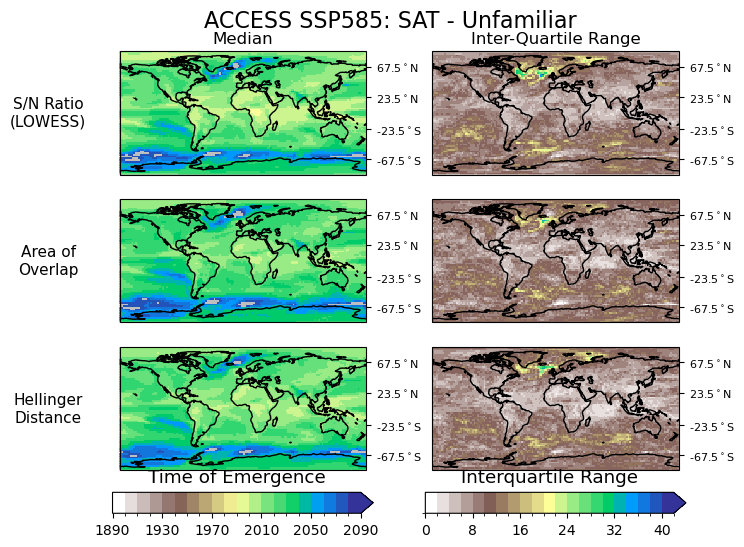

In [246]:
fig, axes, bottom_axes = plot_time_of_emergence_maps_single_var_with_iqr(
    toe_ds=toe_unknown['access_ssp585_tas'].to_dataset(),
    does_not_emerge_ds=does_not_emerge_unknown_tree['access_ssp585_tas'].to_dataset(),
    data_availability_ds=data_availability_tree['access_ssp585_tas'].to_dataset(),
    tests_subset_used = coolest_metrics_no_hype,
    levels = PLOT_LEVELS['access_ssp585_tas'],
    iqr_levels = iqr_levels
);

fig.suptitle(toe_plots.NAME_MAPPING['access_ssp585_tas'] + ' - Unfamiliar', fontsize=16, y=0.95)

sn_lowess_base frac hd 

Text(0.5, 0.95, 'ACCESS SSP585: SAT - Unknown')

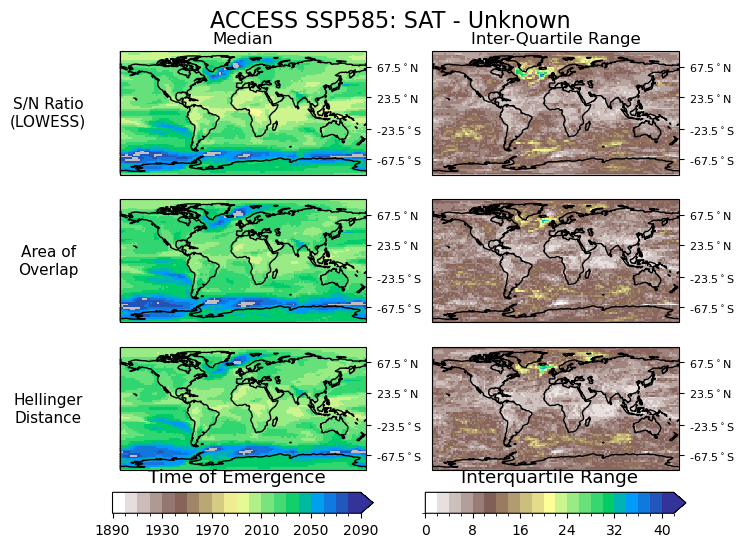

In [247]:
fig, axes, bottom_axes = plot_time_of_emergence_maps_single_var_with_iqr(
    toe_ds=toe_unknown['access_ssp585_tas'].to_dataset(),
    does_not_emerge_ds=does_not_emerge_unknown_tree['access_ssp585_tas'].to_dataset(),
    data_availability_ds=data_availability_tree['access_ssp585_tas'].to_dataset(),
    tests_subset_used = coolest_metrics_no_hype,#sn_access_metrics
    levels = PLOT_LEVELS['access_ssp585_tas'],
    iqr_levels = iqr_levels
);
fig.suptitle(toe_plots.NAME_MAPPING['access_ssp585_tas'] + ' - Unknown', fontsize=16, y=0.95)

In [248]:
best_metrics_v2  = ['sn_lowess_full','sn_mean', 'sn_mean_roll', 'ks', 'ttest', 'frac', 'hd'] #, 'perkins'
best_metrics_no_hype_v2 = ['sn_lowess_full','sn_mean', 'sn_mean_roll', 'frac', 'hd']

In [249]:

def create_custom_coolwarm():
    """Creates a modified coolwarm colormap with white inserted in the middle."""
    # Get the original coolwarm colormap
    coolwarm = plt.get_cmap("coolwarm", 10)

    # Extract colors
    colors = coolwarm(np.linspace(0, 1, 10))

    # Insert white in the middle
    mid = len(colors) // 2
    white = np.array([[1, 1, 1, 1]])  # Pure white (RGBA)
    
    # Insert white at the center
    new_colors = np.vstack([colors[:mid], white, colors[mid:]])

    # Clip to the original length
    indices = np.linspace(0, len(new_colors) - 1, 10).astype(int)
    new_colors = new_colors[indices]

    # Create a new colormap
    custom_coolwarm = mcolors.LinearSegmentedColormap.from_list("custom_coolwarm", new_colors)
    
    return custom_coolwarm

In [250]:
num_steps = 20
num_whites = 2

In [251]:
import cmocean

In [252]:
list_cmap = plt.get_cmap('coolwarm', num_steps)(np.linspace(0, 1, num_steps))
new_list = np.concatenate([
    list_cmap[num_whites:num_steps//2-num_whites],
    [[1,1,1,1]]*2*num_whites,
    list_cmap[num_steps//2+num_whites:-num_whites]])
new_cmap = mcolors.LinearSegmentedColormap.from_list('cool', new_list)

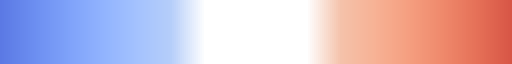

In [253]:
new_cmap

In [254]:
best_metrics_v2 

['sn_lowess_full', 'sn_mean', 'sn_mean_roll', 'ks', 'ttest', 'frac', 'hd']

In [255]:
best_metrics_v3 = [
    'sn_lowess_full', 'sn_mean', 'sn_mean_roll', 'sn_pi',
    'ks', 'ttest', 'frac', 'hd']

Empty slots: 1, Total plots: 8
Final positions to fill: [0, 1, 2, 3, 4, 5, 6, 7, 9]
sn_lowess_full sn_mean sn_mean_roll sn_pi ks ttest frac hd 

Text(0.5, 0.98, 'ACCESS SSP585: Precipitation - Unusual')

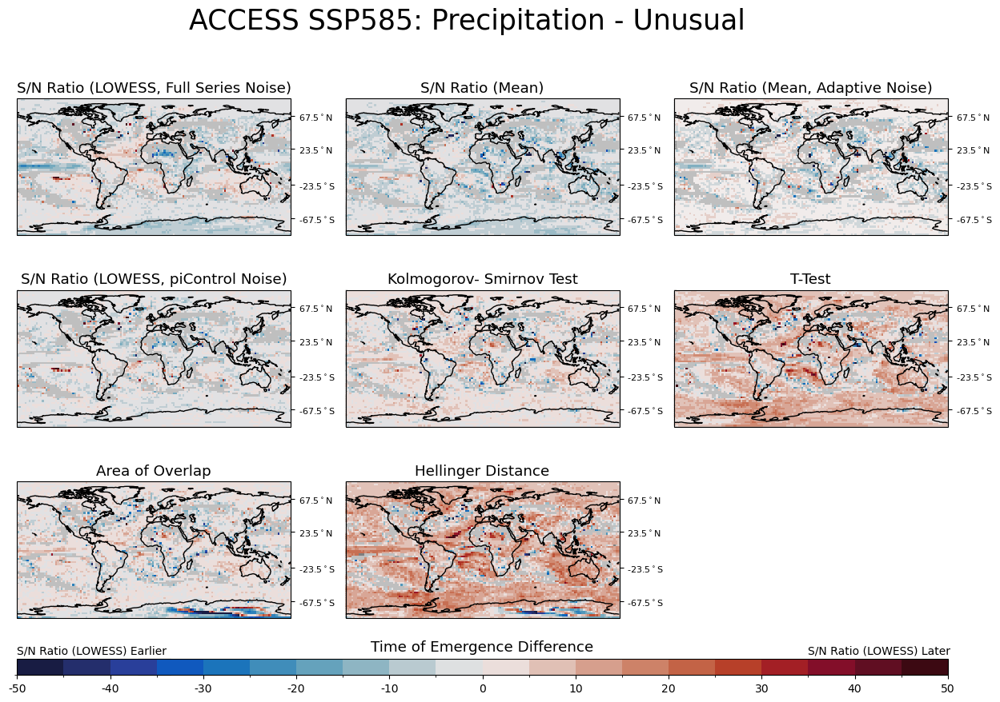

In [256]:
fig, axes, bottom_axes = plot_time_of_emergence_maps_single_var(
    toe_ds=(
    toe_tree['access_ssp585_pr'].to_dataset().sn_lowess_base.median(dim='member') -
    toe_tree['access_ssp585_pr'].to_dataset()[best_metrics_v3].median(dim='member')),
    does_not_emerge_ds=does_not_emerge_tree['access_ssp585_pr'].to_dataset().median(dim='member'),
    data_availability_ds=data_availability_tree['access_ssp585_pr'].to_dataset().median(dim='member'),
    tests_subset_used =best_metrics_v3 ,#main_toe_metrics_no_hype,
    levels = np.arange(-50, 55,  5),
    cmap=cmocean.cm.balance,
    ncol=3,
    cbar_title='Time of Emergence Difference'
)

bottom_axes.annotate('S/N Ratio (LOWESS) Later', xy=(0.85, 1.3), xycoords='axes fraction')
bottom_axes.annotate('S/N Ratio (LOWESS) Earlier', xy=(0., 1.3), xycoords='axes fraction')

fig.suptitle(toe_plots.NAME_MAPPING['access_ssp585_pr'] + ' - Unusual', fontsize=25, y=0.98)

Empty slots: 1, Total plots: 8
Final positions to fill: [0, 1, 2, 3, 4, 5, 6, 7, 9]
sn_lowess_full sn_mean sn_mean_roll sn_pi ks ttest frac hd 

Text(0.5, 0.98, 'ACCESS SSP585: SAT - Unusual')

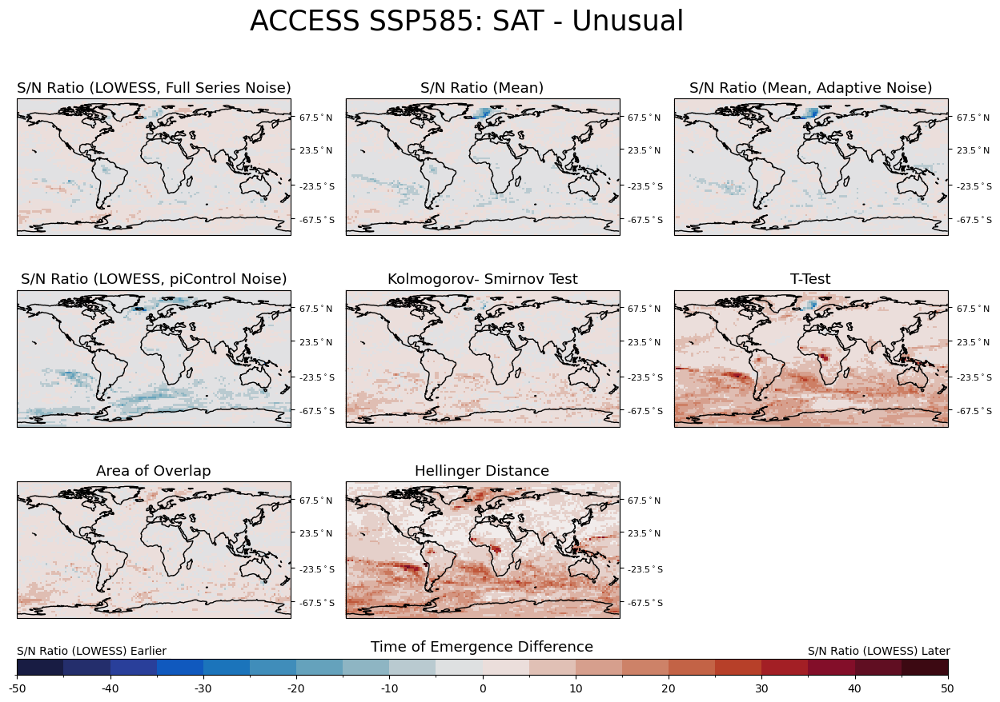

In [257]:
fig, axes, bottom_axes = plot_time_of_emergence_maps_single_var(
    toe_ds=(
    toe_tree['access_ssp585_tas'].to_dataset().sn_lowess_base.median(dim='member') -
    toe_tree['access_ssp585_tas'].to_dataset()[best_metrics_v3].median(dim='member')),
    does_not_emerge_ds=does_not_emerge_tree['access_ssp585_tas'].to_dataset().median(dim='member'),
    data_availability_ds=data_availability_tree['access_ssp585_tas'].to_dataset().median(dim='member'),
    tests_subset_used = best_metrics_v3,#main_toe_metrics_no_hype,
    levels = np.arange(-50, 55,  5),
    cmap=cmocean.cm.balance,
    ncol=3,
    cbar_title='Time of Emergence Difference'
)



bottom_axes.annotate('S/N Ratio (LOWESS) Later', xy=(0.85, 1.3), xycoords='axes fraction')
bottom_axes.annotate('S/N Ratio (LOWESS) Earlier', xy=(0., 1.3), xycoords='axes fraction')

fig.suptitle(toe_plots.NAME_MAPPING['access_ssp585_tas'] + ' - Unusual', fontsize=25, y=0.98)

In [258]:
toe_best_diff = toe_tree['best_tas'].to_dataset().sn_lowess_base - toe_tree['best_tas'].to_dataset()[best_metrics_v2]

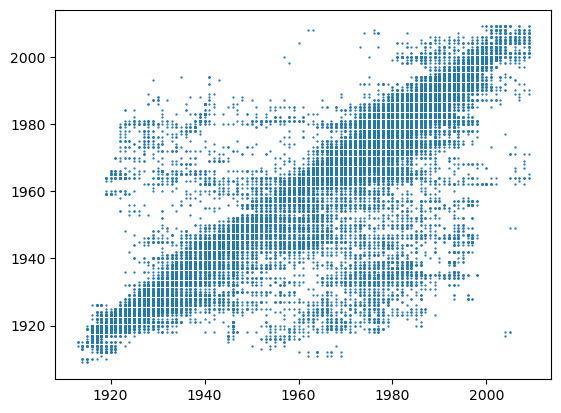

In [259]:
plt.scatter(
    toe_tree['best_tas'].to_dataset().sn_lowess_base.values,
    toe_tree['best_tas'].to_dataset().ks.values, s=0.4)

Empty slots: 2, Total plots: 7
Final positions to fill: [0, 1, 2, 3, 4, 5, 7]
sn_lowess_full sn_mean sn_mean_roll ks ttest frac hd 

Text(0.5, 0.98, 'BEST: SAT - Unusual')

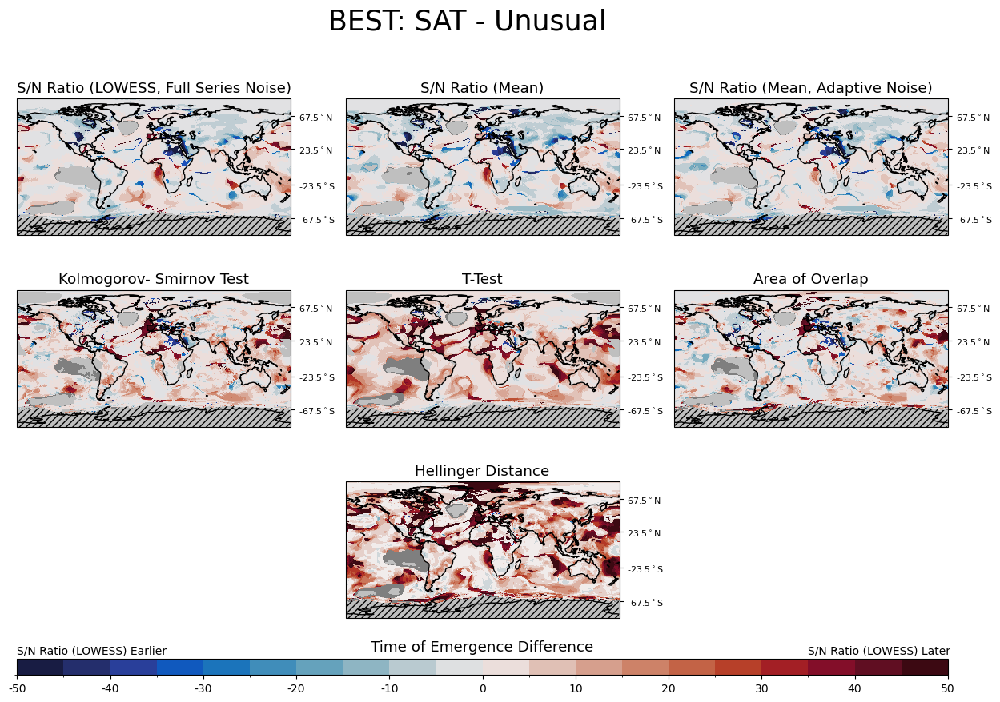

In [260]:
fig, axes, bottom_axes = plot_time_of_emergence_maps_single_var(
    toe_ds=toe_tree['best_tas'].to_dataset().sn_lowess_base - toe_tree['best_tas'].to_dataset()[best_metrics_v2],
    does_not_emerge_ds=does_not_emerge_tree['best_tas'].to_dataset(),
    data_availability_ds=data_availability_tree['best_tas'].to_dataset(),
    tests_subset_used = best_metrics_v2,#main_toe_metrics_no_hype,
    levels = np.arange(-50, 55,  5),
    cmap=cmocean.cm.balance,
    ncol=3,cbar_title='Time of Emergence Difference'

)

bottom_axes.annotate('S/N Ratio (LOWESS) Later', xy=(0.85, 1.3), xycoords='axes fraction')
bottom_axes.annotate('S/N Ratio (LOWESS) Earlier', xy=(0., 1.3), xycoords='axes fraction')


fig.suptitle(toe_plots.NAME_MAPPING['best_tas'] + ' - Unusual', fontsize=25, y=0.98)

Empty slots: 0, Total plots: 6
Final positions to fill: [0, 1, 2, 3, 4, 5]
sn_lowess_base sn_lowess_full sn_mean sn_mean_roll frac hd 

Text(0.5, 1, 'BEST: SAT - Unknown')

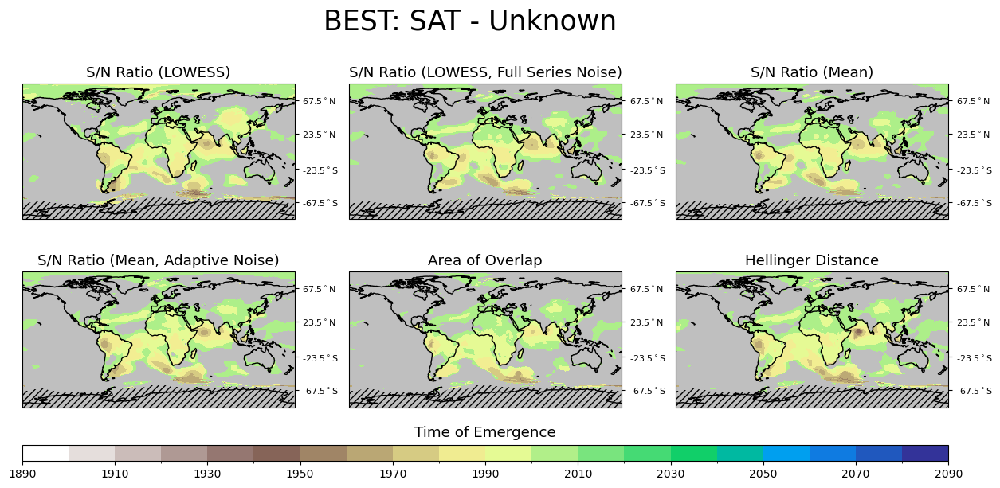

In [261]:
fig, axes, bottom_axes = plot_time_of_emergence_maps_single_var(
    toe_ds=toe_unknown['best_tas'].to_dataset(),
    does_not_emerge_ds=does_not_emerge_unknown_tree['best_tas'].to_dataset(),
    data_availability_ds=data_availability_tree['best_tas'].to_dataset(),
    tests_subset_used = best_metrics_no_hype,#main_toe_metrics_no_hype,
    levels = PLOT_LEVELS['best_tas'],
    cmap=plt.cm.terrain_r, ncol=3
)

fig.suptitle(toe_plots.NAME_MAPPING['best_tas']  + ' - Unknown', fontsize=25, y=1)

Empty slots: 0, Total plots: 6
Final positions to fill: [0, 1, 2, 3, 4, 5]
sn_lowess_base sn_lowess_full sn_mean sn_mean_roll frac hd 

Text(0.5, 1, 'BEST: SAT - Unfamiliar')

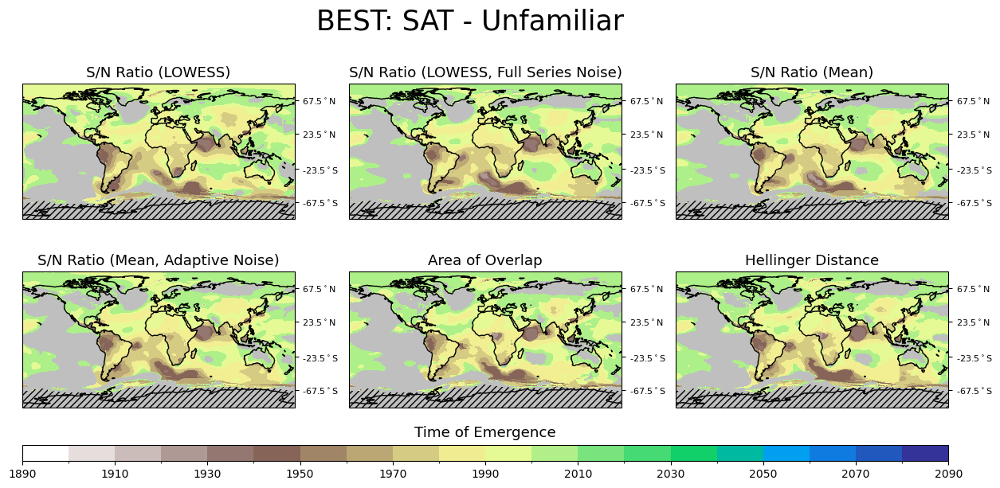

In [262]:
fig, axes, bottom_axes = plot_time_of_emergence_maps_single_var(
    toe_ds=toe_unfamiliar['best_tas'].to_dataset(),
    does_not_emerge_ds=does_not_emerge_unfamiliar_tree['best_tas'].to_dataset(),
    data_availability_ds=data_availability_tree['best_tas'].to_dataset(),
    tests_subset_used = best_metrics_no_hype,
    levels = PLOT_LEVELS['best_tas'], ncol=3, cmap=plt.cm.terrain_r
)

fig.suptitle(toe_plots.NAME_MAPPING['best_tas']  + ' - Unfamiliar', fontsize=25, y=1)

Empty slots: 1, Total plots: 8
Final positions to fill: [0, 1, 2, 3, 4, 5, 6, 7, 9]
sn_lowess_base sn_lowess_full sn_mean sn_mean_roll ks ttest frac hd 

Text(0.5, 0.98, 'BEST: SAT - Unusual')

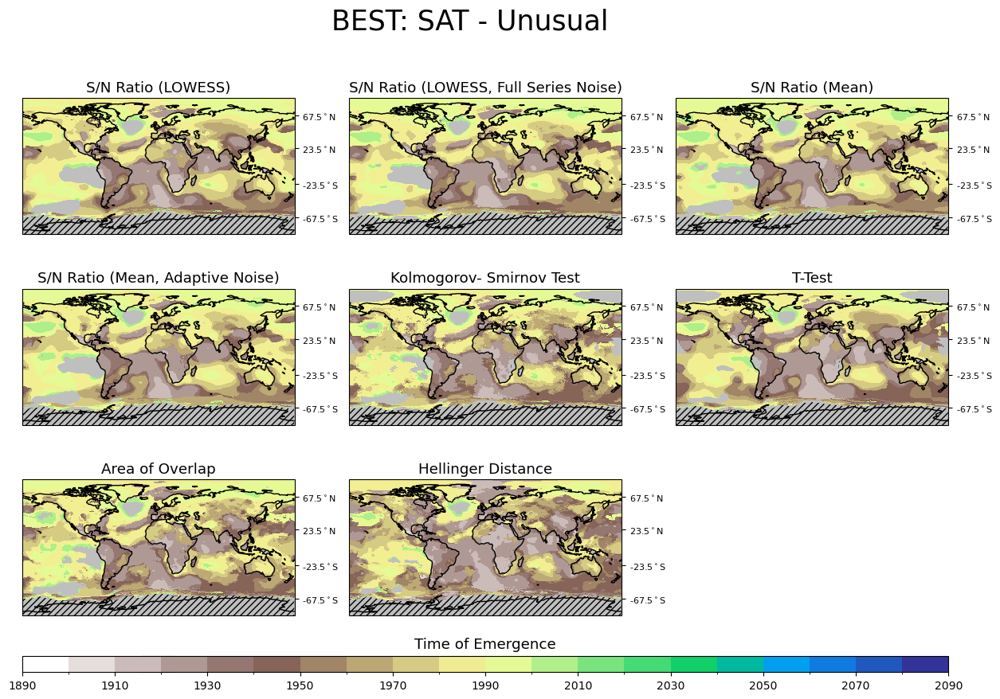

In [263]:
fig, axes, bottom_axes = plot_time_of_emergence_maps_single_var(
    toe_ds=toe_tree['best_tas'].to_dataset(),
    does_not_emerge_ds=does_not_emerge_tree['best_tas'].to_dataset(),
    data_availability_ds=data_availability_tree['best_tas'].to_dataset(),
    tests_subset_used = best_metrics,
    levels = PLOT_LEVELS['best_tas'], cmap=plt.cm.terrain_r, ncol=3
)

fig.suptitle(toe_plots.NAME_MAPPING['best_tas']  + ' - Unusual', fontsize=25, y=0.98)

<h3 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'>Region Aggegation </h3>


In [264]:
import toe_data_analysis

In [265]:
def assign_regions(ds, lsm_ds, regions=None):

    if regions is None: regions = toe_const.regionLatLonTuples
    
    region_store = []
    for region in list(regions):
        print(region)
        region_name = region.value.name
        lat_slice = region.value.latlon
    
        ds_region = ds.sel(lat=lat_slice).expand_dims({'region': [region_name]})
    
        if region_name in ['land', 'ocean']:
            mask_to_use_ds = lsm_ds if region_name == 'land' else xr.where(lsm_ds, 0, 1)
    
            ds_region = ds_region.where(mask_to_use_ds)
            
        region_store.append(ds_region)
    
    all_region_ds = xr.concat(region_store, dim='region').compute()
    
    return all_region_ds

In [266]:
def weighted_mean(da):
    weights_da = toe_data_analysis.compute_weights(da)
    mean_da = da.weighted(weights_da).mean(dim=['lat', 'lon']).compute()
    return mean_da

In [267]:
# member_sel_kwargs = dict(member=0)
# member_sel_kwargs = dict()

In [268]:
def calculate_lat_lon_region_percentiles(ds: xr.Dataset, variable:str, member_sel_kwargs:dict=None, variable_subset:list=None):

    if not isinstance(ds, xr.Dataset): ds = ds.to_dataset()
    if member_sel_kwargs: ds = ds.isel(**member_sel_kwargs)
    if variable_subset: ds = ds[variable_subset]

    mask_selection = 'access' if 'access' in variable else 'best'
    
    lsm_da = lsm_tree[mask_selection].to_dataset().to_array()
    
    ds_region = assign_regions(ds, lsm_da)
    
    return ds_region

In [269]:
def calculate_quantiles(ds, dim=['lat', 'lon'], quantiles = [0, 0.01, 0.25, 0.5, 0.75, 0.99, 1]):
    quantile_ds = ds.quantile(quantiles, dim=dim).compute().squeeze()
    return quantile_ds

In [270]:
    # selection_quantile_ds = td_region.quantile(
    #     [0.01, 0.25, 0.5, 0.75, 0.99], dim=['lat', 'lon']).compute().squeeze()

In [271]:
signal_select_tree = signal_tree.map_over_datasets(tree_subset_vars, ['signal_lowess'])

In [272]:
signal_quantile_tree = xr.DataTree.from_dict(
    {branch: calculate_quantiles(signal_select_tree[branch].to_dataset()) for branch in list(signal_select_tree)})

In [273]:
variable_subset = ['sn_lowess_base', 'frac', 'ks']

In [274]:
quantile_dict = {}
region_dict = {}
region_mean_dict = {}

for branch in list(toe_metric_tree):
    print(f'{branch}\n--------')
    member_sel_kwargs = {} if branch == 'best_tas' else dict(member=0)
    ds = calculate_lat_lon_region_percentiles(toe_metric_tree[branch], branch, member_sel_kwargs, variable_subset)
    
    quantile_ds = calculate_quantiles(ds)
    
    quantile_dict[branch] = quantile_ds
    region_dict[branch] = ds

region_quantile_tree = xr.DataTree.from_dict(quantile_dict)
region_tree = xr.DataTree.from_dict(region_dict)

best_tas
--------
regionLatLonTuples.GLOBAL
regionLatLonTuples.LAND
regionLatLonTuples.OCEAN
regionLatLonTuples.NH
regionLatLonTuples.SH
regionLatLonTuples.TROPICS
regionLatLonTuples.MID_LAT_SH
regionLatLonTuples.MID_LAT_NH
regionLatLonTuples.ARCTIC
regionLatLonTuples.ANTARCTIC
access_ssp585_tas
--------
regionLatLonTuples.GLOBAL
regionLatLonTuples.LAND
regionLatLonTuples.OCEAN
regionLatLonTuples.NH
regionLatLonTuples.SH
regionLatLonTuples.TROPICS
regionLatLonTuples.MID_LAT_SH
regionLatLonTuples.MID_LAT_NH
regionLatLonTuples.ARCTIC
regionLatLonTuples.ANTARCTIC
access_ssp585_pr
--------
regionLatLonTuples.GLOBAL
regionLatLonTuples.LAND
regionLatLonTuples.OCEAN
regionLatLonTuples.NH
regionLatLonTuples.SH
regionLatLonTuples.TROPICS
regionLatLonTuples.MID_LAT_SH
regionLatLonTuples.MID_LAT_NH
regionLatLonTuples.ARCTIC
regionLatLonTuples.ANTARCTIC


In [275]:
def fill_between_quantile(ds, ax, time=None):
    if time is None: time = ds.time.dt.year.values
    
    # ax.fill_between(time, ds.sel(quantile=0).values, ds.sel(quantile=1).values,
    #                 alpha=0.15, color='grey', label='Max to Min')

    
    ax.fill_between(time, ds.sel(quantile=.01).values, ds.sel(quantile=.99).values,
                    alpha=0.5, color='grey', label='1st to 99th Percentile')

    ax.fill_between(time, ds.sel(quantile=.25).values, ds.sel(quantile=.75).values,
                    alpha=0.5, color='grey', label='25th to 75th Percentile')
    ax.plot(time, ds.sel(quantile=0.5), color='k', linewidth=2, label='Median')

In [276]:
def format_axis_time(ax):
    ax.xaxis.set_major_locator(mticker.MultipleLocator(20))
    ax.xaxis.set_minor_locator(mticker.MultipleLocator(10))
    # ax.tick_params(axis='x', rotation=45)
    ax.tick_params(axis='x', which='major', length=6, width=1)  # Bigger major ticks
    ax.tick_params(axis='x', which='minor', length=3, width=1)  # Smaller minor ticks

In [277]:
agg_std = {
     variable: (region_agg_tree[variable]
    .noise.sel(region='global')
    # .isel(**member_sel_kwargs)
    .isel(time=slice(0, 30))
    .std()
    .values.item()) for variable in list(region_agg_tree)
}

In [278]:
agg_std

{'access_ssp585_tas': 0.11030534877518562,
 'access_ssp585_pr': 4.2449836285849,
 'best_tas': 0.1104781962045704}

best_tas 0.1104781962045704
access_ssp585_tas 0.10990909912473538
access_ssp585_pr 3.7551335284704526


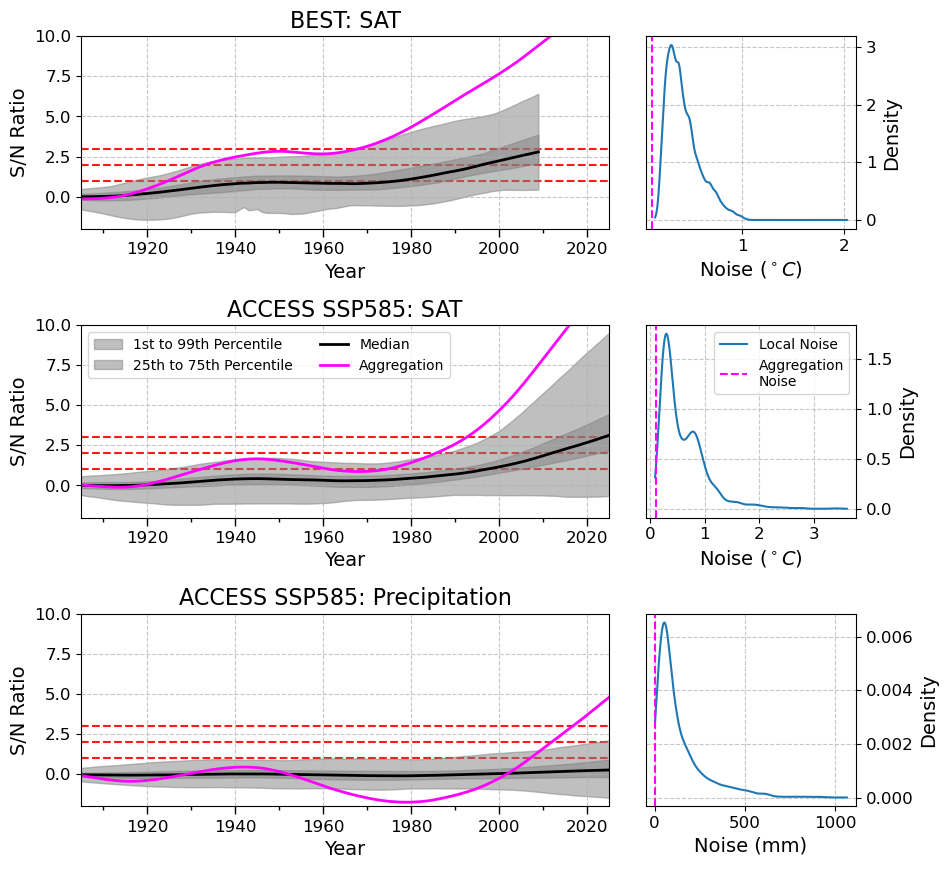

In [279]:
region = 'global'

# 3 x 2
fig = plt.figure(figsize=(10, 10))
gs = gridspec.GridSpec(3, 2, width_ratios=[1, 0.4], hspace=0.5, wspace=0.1)
# axes = [fig.add_subplot(gs[i]) for i in range(6)]
axes_left = [fig.add_subplot(gs[i, 0]) for i in range(3)]
axes_right = [fig.add_subplot(gs[i, 1]) for i in range(3)]

for i, variable in enumerate(list(region_quantile_tree)):

    member_sel_kwargs = {} if variable == 'best_tas' else dict(member=0)

    # 2 x 3 grid
    ax1 = axes_left[i]
    ax2 = axes_right[i]

    selection_quantile_ds = region_quantile_tree[variable]['sn_lowess_base'].sel(region=region).squeeze()
    time = region_agg_tree[variable].time.dt.year.values
    quantile_time = selection_quantile_ds.time.dt.year.values

    fill_between_quantile(selection_quantile_ds, ax1, quantile_time)

    ax1.plot(
        time,
        region_agg_tree[variable]['sn'].sel(region=region).isel(**member_sel_kwargs).values,
        color='magenta', linewidth=2, label='Aggregation'
    )

    for val in [1, 2, 3]:
        ax1.axhline(val, color='red', linestyle='--', zorder=-100, alpha=0.9)

    # Standard Deviations
    std_values = (
        signal_tree[variable]
        .noise_lowess
        .isel(**member_sel_kwargs).isel(time=slice(0, 30))
        .std(dim='time')
        .values.flatten()
    )
    std_values = std_values[np.isfinite(std_values)]

    std_x = np.linspace(std_values.min(), std_values.max(), 10000)
    kde = toe_calc.create_kde_x_exists(std_values, std_x)

    agg_std = (
        region_agg_tree[variable]
        .noise.sel(region=region)
        .isel(**member_sel_kwargs)
        .isel(time=slice(0, 30))
        .std()
        .values.item()
    )
    print(variable, agg_std)

    labelsize= 14
    ax2.plot(std_x, kde, label='Local Noise')
    ax2.axvline(agg_std, color='magenta', linestyle='--', label='Aggregation\nNoise')
    # ax2.set_xlim(0, ax2.get_xlim()[-1])
    units = r'$^\circ C$' if 'tas' in variable else 'mm'
    ax2.set_xlabel(f'Noise ({units})', fontsize=labelsize)
    ax1.set_xlabel('Year', fontsize=labelsize)
    ax1.tick_params(axis='x', labelsize=12)
    ax1.tick_params(axis='y', labelsize=12)
    ax2.tick_params(axis='x', labelsize=12)
    ax2.tick_params(axis='y', labelsize=12)


    format_axis_time(ax1)
    ax1.set_xlim(1905, 2025)
    ax1.set_ylim(-2, 10)
    # ax1.set_xlim(np.take(quantile_time, [0, -1]))

    for ax in [ax1, ax2]:
        ax.grid(True, linestyle='--', alpha=0.7)

    # if i == 0:
    ax1.set_ylabel('S/N Ratio', fontsize=labelsize)
    ax2.set_ylabel('Density', fontsize=labelsize)
    ax2.yaxis.set_ticks_position('right')           # Move ticks to the right
    ax2.yaxis.set_label_position('right')           # Move label to the right
    ax2.spines['right'].set_position(('outward', 0))  # Optional: move spine outward

    ax1.set_title(toe_plots.NAME_MAPPING.get(variable, variable), fontsize=16)

axes_left[1].legend(loc='upper left', fontsize=10, ncol=2)
axes_right[1].legend(loc='upper right', fontsize=10)

In [280]:
agg_std

3.7551335284704526

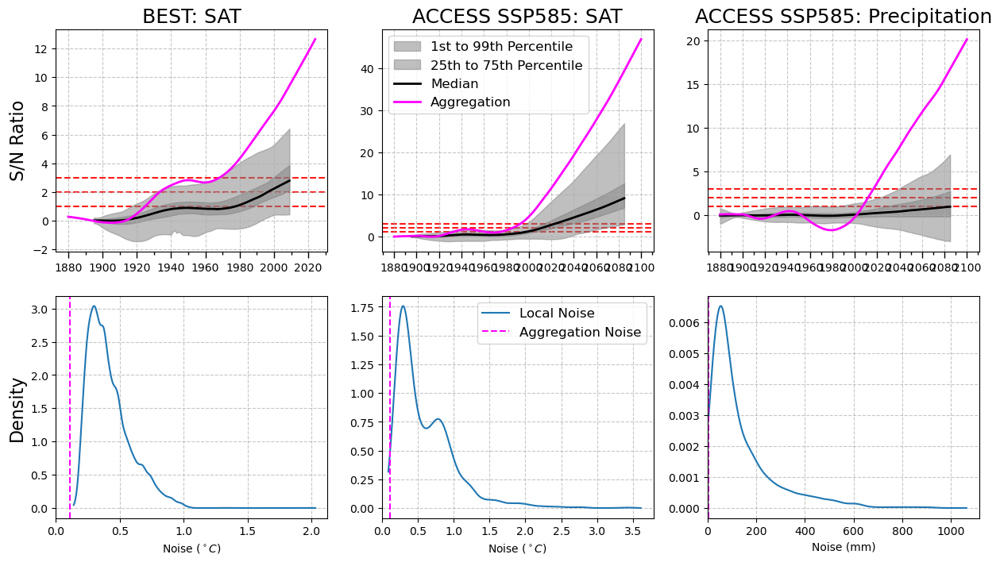

In [281]:
region = 'global'

# 2 x 3 grid
fig = plt.figure(figsize=(15, 8))
gs = gridspec.GridSpec(2, 3)
axes = [fig.add_subplot(gs[i]) for i in range(6)]

for i, variable in enumerate(list(region_quantile_tree)):

    member_sel_kwargs = {} if variable == 'best_tas' else dict(member=0)

    ax1 = axes[i]
    ax2 = axes[i + 3]

    selection_quantile_ds = region_quantile_tree[variable]['sn_lowess_base'].sel(region=region).squeeze()
    time = region_agg_tree[variable].time.dt.year.values
    quantile_time = selection_quantile_ds.time.dt.year.values

    fill_between_quantile(selection_quantile_ds, ax1, quantile_time)

    ax1.plot(
        time,
        region_agg_tree[variable]['sn'].sel(region=region).isel(**member_sel_kwargs).values,
        color='magenta', linewidth=2, label='Aggregation'
    )

    for val in [1, 2, 3]:
        ax1.axhline(val, color='red', linestyle='--', zorder=-100, alpha=0.9)

    # Standard Deviations
    std_values = (
        signal_tree[variable]
        .noise_lowess
        .isel(**member_sel_kwargs).isel(time=slice(0, 30))
        .std(dim='time')
        .values.flatten()
    )
    std_values = std_values[np.isfinite(std_values)]

    std_x = np.linspace(std_values.min(), std_values.max(), 10000)
    kde = toe_calc.create_kde_x_exists(std_values, std_x)

    agg_std = (
        region_agg_tree[variable]
        .noise.sel(region=region)
        .isel(**member_sel_kwargs)
        .isel(time=slice(0, 30))
        .std()
        .values.item()
    )

    ax2.plot(std_x, kde, label='Local Noise')
    ax2.axvline(agg_std, color='magenta', linestyle='--', label='Aggregation Noise')
    ax2.set_xlim(0, ax2.get_xlim()[-1])
    units = r'$^\circ C$' if 'tas' in variable else 'mm'
    ax2.set_xlabel(f'Noise ({units})')

    format_axis_time(ax1)
    # ax1.set_xlim(np.take(quantile_time, [0, -1]))

    for ax in [ax1, ax2]:
        ax.grid(True, linestyle='--', alpha=0.7)

    if i == 0:
        ax1.set_ylabel('S/N Ratio', fontsize=16)
        ax2.set_ylabel('Density', fontsize=16)

    ax1.set_title(toe_plots.NAME_MAPPING.get(variable, variable), fontsize=18)

axes[1].legend(loc='upper left', fontsize=12)
axes[-2].legend(loc='upper right', fontsize=12)

In [282]:
# variable = 'best_tas'
# variable = 'access_ssp585_pr'
variable = 'access_ssp585_pr'

In [283]:
region_agg_ds = region_agg_tree[variable].to_dataset()

In [284]:
regions = ['global', 'land', 'ocean',
           'antarctic', 'mid_lat_sh', 'tropics', 'mid_lat_nh', 'arctic', ]

Text(0.5, 0.93, 'ACCESS SSP585: Precipitation')

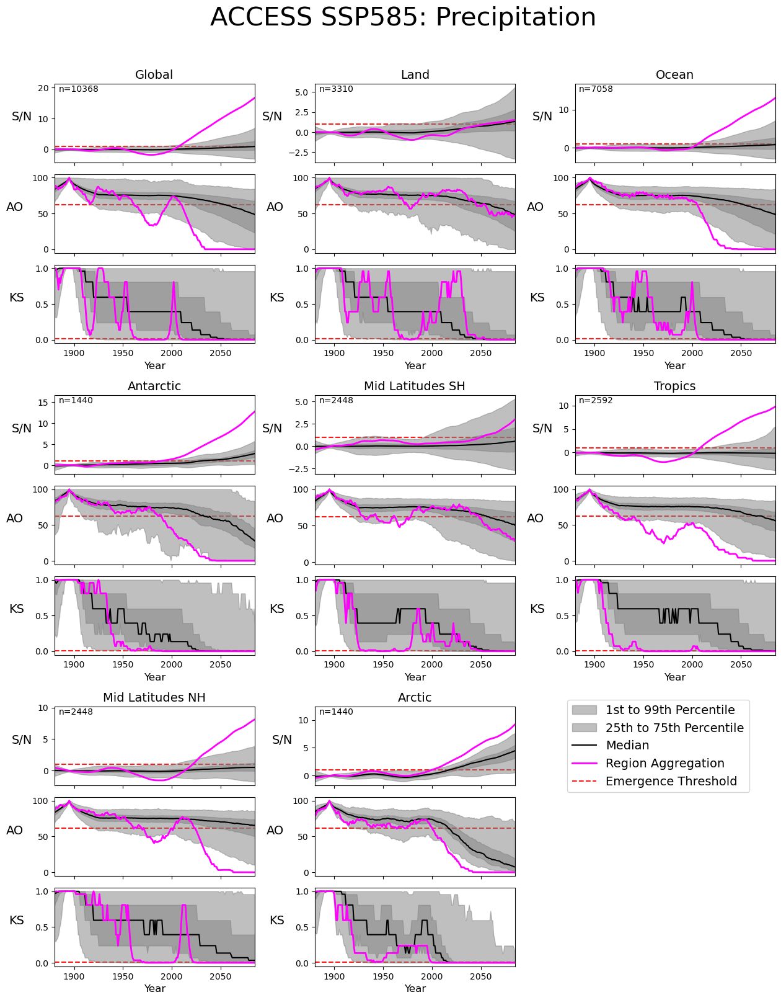

In [285]:
member_sel_kwargs = {} if variable == 'best_tas' else dict(member=0)

fig = plt.figure(figsize=(15, 25))
nrows = 4
outer_gs = gridspec.GridSpec(nrows, 3, hspace=0.2, wspace=0.3) 

tests = ['sn', 'frac', 'ks']
axes= []
for idx, region in enumerate(regions):
    row, col = divmod(idx, 3)
    outer_spec = outer_gs[row, col]
    inner_gs = gridspec.GridSpecFromSubplotSpec(3, 1, subplot_spec=outer_spec, hspace=0.15)
    ax_sub = []
    for j, test in enumerate(tests):
        ax = fig.add_subplot(inner_gs[j])
        time = selection_quantile_ds.time.dt.year.values

        qname = test if test != 'sn' else 'sn_lowess_base'

        time = region_quantile_tree[variable].time.dt.year.values
        # ax.fill_between(
        #     time,
        #     region_quantile_tree[variable][qname].sel(region=region).sel(quantile=0).values,
        #     region_quantile_tree[variable][qname].sel(region=region).sel(quantile=1).values,
        #     alpha=0.1, color='grey', label='Max to Min'
        # )

        
        ax.fill_between(
            time,
            region_quantile_tree[variable][qname].sel(region=region).sel(quantile=.01).values,
            region_quantile_tree[variable][qname].sel(region=region).sel(quantile=.99).values,
            alpha=0.5, color='grey', label='1st to 99th Percentile'
        )

        ax.fill_between(
            time,
            region_quantile_tree[variable][qname].sel(region=region).sel(quantile=.25).values,
            region_quantile_tree[variable][qname].sel(region=region).sel(quantile=.75).values,
            alpha=0.5, color='grey', label='25th to 75th Percentile'
        )

        ax.plot(
            time,
            region_quantile_tree[variable][qname].sel(region=region).sel(quantile=.5).values,
            color='k', label='Median'
        )

        ax.plot(
            region_agg_ds.time.dt.year.values,
            region_agg_ds[test].sel(region=region).isel(**member_sel_kwargs).values,
            color='magenta', linewidth=2, label='Region Aggregation'
        )

        threshold = get_test_threshold(test, toe_const.ThresholdProfileUnusual)
        ax.axhline(threshold, color='red', linestyle='--', zorder=-100, alpha=0.9, 
                  label='Emergence Threshold')
        
        ax.set_ylabel(toe_plots.METRIC_MAP_SHORT.get(test, test), rotation=0, fontsize=14, labelpad=30, ha='left');
        ax.set_xlim(np.take(time, [0, -1]))
        
        number_points = int(region_tree[variable].sel(region=region).isel(time=0).frac.count().values.item())
        if j == 0: 
            ax.set_title(toe_const.NAMING_MAP.get(region, region),  fontsize=14)
            ax.annotate(f'n={number_points}', xy=(0.02, 0.9), xycoords='axes fraction')
    
            
        if j < 2: ax.set_xticklabels([])
        else: ax.set_xlabel('Year', fontsize=12)

        if region == 'antarctic' and variable == 'best_tas': destroy_ax(ax)

        ax_sub.append(ax)
    axes.append(ax_sub)

leg = axes[-1][0].legend(loc='center right', bbox_to_anchor=(2.2, 0.5), fontsize=14)


fig.suptitle(toe_plots.NAME_MAPPING[variable], fontsize=30, y=0.93)

<h3 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Time Seires Quantiles </h3>

In [286]:
time_series_quantiles_access_tas = calculate_quantiles(
    emergence_time_series_tree.access_ssp585_tas.sel(region='global').to_dataset(),
    dim='member', quantiles=[0.1, 0.5, 0.9])

In [287]:
time_series_quantiles_access_pr = calculate_quantiles(
    emergence_time_series_tree.access_ssp585_pr.sel(region='global').to_dataset(),
    dim='member', quantiles=[0.1, 0.5, 0.9])

In [288]:
test_without_member = np.array(
    [test for test in list(time_series_quantiles_access_pr) if test not in ['sn_ens_med']])
test_without_member

array(['frac', 'hd', 'ks', 'sn_lowess_base', 'sn_lowess_full', 'sn_mean',
       'sn_mean_roll', 'sn_pi', 'ttest'], dtype='<U14')

In [289]:
test_without_member = np.array(['sn_lowess_base', 'frac', 'ks'])

In [290]:
def plot_time_series_spread_for_member(
    time_series_quantiles_ds: xr.Dataset,
    toe_metrics = None, 
    fig=None, axes=None, 
    add_legend=True, annotate=True,
    ylabel='', c=None,
):

    import matplotlib.lines as mlines
    import matplotlib.patches as mpatches

    if toe_metrics is None:
        toe_metrics = list(time_series_quantiles_ds)

    
    if fig is None or axes is None:
        fig = plt.figure(figsize=(6, 2*len(toe_metrics)))
        gs = gridspec.GridSpec(len(toe_metrics), 1, hspace=0.1)
        axes = [fig.add_subplot(gs[i]) for i in range(len(toe_metrics))]

    time = time_series_quantiles_ds.time.dt.year.values
    for num, metric in enumerate(toe_metrics):
        ax = axes[num]
        ax.grid(True, linestyle='--', color='grey', alpha=0.5)

        color = toe_plots.TEST_STYLES[metric]['color'] if c is None else c
        label = toe_plots.METRIC_MAP[metric]

        time_series_quantiles_ds[metric]#.sel(quantile=0.1).values

        ax.fill_between(
            time,
            time_series_quantiles_ds[metric].sel(quantile=0.1).values,
            time_series_quantiles_ds[metric].sel(quantile=0.9).values,
            color=color, alpha=.75
        )


        
        ax.plot(
            time, 
            time_series_quantiles_ds[metric].sel(quantile=0.5).values,
            color='k', label=label
        )
        
        if annotate: ax.annotate(
            label, xy=(0.05, 0.85), xycoords='axes fraction', ha='left', va='center',
            color='k', fontsize=12
        )
        
        ax.set_ylim(0, 100)
        ax.set_title('')
        ax.set_xlim(np.take(time, [0, -1]))

        if num == 1:
            ax.set_xticklabels('')
            ax.set_xlabel('')   
        if num == 0:
            # ax.xaxis.set_label_position('top')
            ax.xaxis.tick_top()

    # if ylabel: axes[1].set_ylabel(ylabel, fontsize=12)
    
    for ax in [axes[-1]]:#np.take(axes, [-1, 0]):
        ax.set_xlabel('Year', fontsize=12)

    if add_legend:
        # Create custom legend handles
        black_line = mlines.Line2D([], [], color='k', label='Median')
        shaded_area = mpatches.Patch(color='grey', alpha=0.5, label='10th to 90th\nPercentile')
        
        # Place the legend outside the plot
        axes[0].legend(handles=[black_line, shaded_area], loc='lower right', fontsize=10)
    
    return fig, axes

In [291]:
# tds = toe_metric_tree.access_ssp585_pr.sn_lowess_base.sel(lat=-39, lon=145, method='nearest')

In [292]:
# tds.quantile(0.9, dim='member').plot()

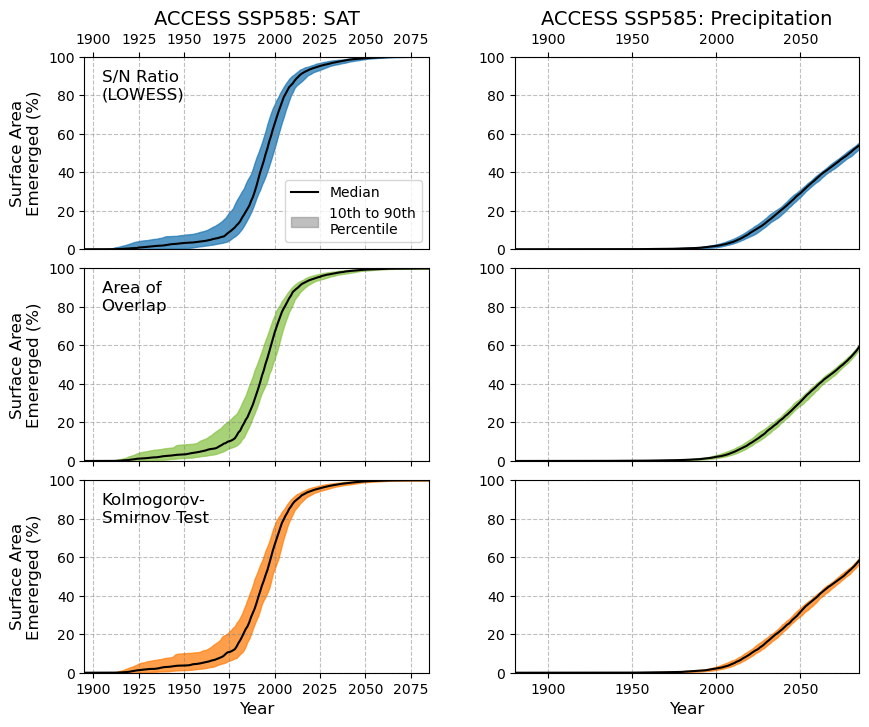

In [293]:
# Create figure and gridspec (multiple rows, 1 column)
fig = plt.figure(figsize=(10, 8))
gs = gridspec.GridSpec(3, 2, hspace=0.1, wspace=0.25)
axes_left = [fig.add_subplot(gs[i, 0]) for i in range(3)]
axes_right = [fig.add_subplot(gs[i, 1]) for i in range(3)]


plot_time_series_spread_for_member(time_series_quantiles_access_tas, test_without_member, 
                                  annotate=True, fig=fig, axes=axes_left)


plot_time_series_spread_for_member(time_series_quantiles_access_pr, test_without_member, 
                                  annotate=False, fig=fig, axes=axes_right, add_legend=False)


axes_left[0].set_title(toe_plots.NAME_MAPPING['access_ssp585_tas'], fontsize=14)
axes_right[0].set_title(toe_plots.NAME_MAPPING['access_ssp585_pr'], fontsize=14)


for label, ax in zip(['sn', 'frac', 'ks'],axes_left):
    # ax.annotate(toe_plots.METRIC_MAP.get(label, label), xy=(-0.3, 0.6), fontsize=14,
    #             ha='center', va='center', xycoords='axes fraction', rotation=90)
    ax.set_ylabel('Surface Area\nEmererged (%)', fontsize=12)

<h3 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Variance Changes and ToE Differences </h3>

In [294]:
from scipy.stats import spearmanr, kendalltau

In [295]:
def get_noise_change(toe_val, noise_arr, time):
    if np.isnan(toe_val): return np.nan
    toe_arg = np.argwhere(time == toe_val).item()
    noise_base_val = np.std(noise_arr[:30])
    noise_toe_val = np.std(noise_arr[toe_arg-15:toe_arg+15])
    noise_change = noise_toe_val/noise_base_val
    return noise_change

def calcalute_noise_change_at_toe(toe_tree, signal_tree, metric1:str, metric2:str):


    noise_dict = {}
    for branch in list(toe_tree):
        print(f'{branch}, ', end='')
        
        noise_ds = signal_tree[branch].noise_lowess.compute()
        toe_ds = toe_tree[branch]
        toe_da = toe_ds[metric1].compute()

        toe_diff_ds = toe_da - toe_ds[metric2]
        
        noise_change_ds = xr.apply_ufunc(
            get_noise_change,
            toe_da,
            noise_ds,
            kwargs = {'time': noise_ds.time.dt.year.values},
            input_core_dims=[[], ['time']],
            output_core_dims=[[]],
            vectorize=True,
            output_dtypes=[float],
        ).compute().to_dataset(name='dn')
        
        noise_dict[branch] = noise_change_ds

    noise_change_tree = xr.DataTree.from_dict(noise_dict)
    return noise_change_tree

In [296]:
metric1 = 'sn_lowess_base'
metric2 =  'frac'

In [297]:
sn_metric1 =  'sn_lowess_base'
sn_metric2 =  'sn_lowess_full'

In [298]:
noise_change_tree_sn = calcalute_noise_change_at_toe(
    toe_tree, signal_tree, sn_metric1, sn_metric2)

best_tas, access_ssp585_tas, access_ssp585_pr, 

In [299]:
noise_change_tree = calcalute_noise_change_at_toe(toe_tree, signal_tree, metric1,metric2)

best_tas, access_ssp585_tas, 

In [ ]:
noise_change_unfamililar_tree = calcalute_noise_change_at_toe(
    toe_unfamiliar, signal_tree, metric1, metric2)
noise_change_unknown_tree = calcalute_noise_change_at_toe(
    toe_unknown, signal_tree, metric1, metric2)

In [ ]:
def flatten_and_remove_nans(toe_diff_ds, noise_change_ds):
    '''
    Flatten values and remove nans
    '''
    toe_diff_flat = toe_diff_ds.values.flatten()
    noise_change_flat = np.abs(noise_change_ds.values.flatten())

    mask = np.isfinite(noise_change_flat) & np.isfinite(toe_diff_flat)
    noise_change_flat = noise_change_flat[mask]
    toe_diff_flat = toe_diff_flat[mask]

    return toe_diff_flat, noise_change_flat

In [ ]:
        # toe_diff_flat = np.abs(toe_diff_flat)

        # Scatter
        # ax.scatter(noise_change_flat, toe_diff_flat, alpha=0.1, color='grey')
        # Hexbin 1
        # hb = ax.hexbin(noise_change_flat, toe_diff_flat, gridsize=50, cmap='YlOrBr', bins='log')
        # cbar = plt.colorbar(hb, ax=ax)
        # cbar.set_label('Log Density')
        # Hexbin 2
        # hb = ax.hexbin(noise_change_flat, toe_diff_flat, gridsize=50, cmap="viridis",
        #                bins="log", reduce_C_function=np.sum, mincnt=1)
        
        # ax.set_xscale("log") 
        
        # cbar = plt.colorbar(hb, ax=ax)
        # cbar.set_label("Log Density")


        # hist2d
            

In [ ]:
from scipy.stats import spearmanr

In [ ]:
def creat_het_plot(axes, noise_change_tree, toe_tree, metric1, metric2, 
                  title=False, ylabel=None):
    hexbin_objs = []

    for num, (ax, branch) in enumerate(zip(axes, noise_change_tree)):
        toe_diff_ds = toe_tree[branch][metric1] - toe_tree[branch][metric2]
        toe_diff_flat, noise_change_flat = flatten_and_remove_nans(
            toe_diff_ds, noise_change_tree[branch].to_dataset().dn
        )

        h = ax.hist2d(
            noise_change_flat, toe_diff_flat,
            bins=[np.logspace(-1, 2, 100), np.linspace(-100, 100, 100)],
            norm=mpl.colors.LogNorm(vmin=1, vmax=10**4), cmap="viridis"
        )
        hexbin_objs.append(h[3])

        ax.set_xscale("log")
        ax.set_xlim(0.1, 10)
        ax.set_xticks(xticks)
        ax.set_xticklabels(labels, fontsize=14)
        ax.set_xlabel(r'$\sigma_{ToE}/\sigma_{base period}$', fontsize=16)
        if num == 0 and ylabel:
            ax.set_ylabel(ylabel, fontsize=16)
        ax.tick_params(axis='y', labelsize=14)
        

        rho = spearmanr(noise_change_flat, toe_diff_flat,
                         nan_policy='omit').statistic
        ax.annotate(r'$\rho=$'+f'{rho:.2f}', xy=(0.05, 0.95), xycoords='axes fraction',
                   fontsize=14)

        if title:
            ax.set_title(NAME_MAPPING.get(branch, branch), fontsize=18)

    return hexbin_objs

In [ ]:
upper_ticks = np.array([2, 4, 6, 8])
lower_ticks = 1/upper_ticks[::-1]
xticks = np.concatenate([lower_ticks, [1], upper_ticks])

In [ ]:
# lower_labels = list(map(lambda x: f'1/{x}' if (x-int(x)) else f'1/{int(x)}', upper_ticks[::-1]))
lower_labels = [rf'$\dfrac{{1}}{{{int(x)}}}$' for x in upper_ticks[::-1]]

labels = np.concatenate([lower_labels, ['1'], upper_ticks.astype(str)])
labels

In [ ]:
fig = plt.figure(figsize=(16, 9))
gs = gridspec.GridSpec(2, 3, height_ratios=[1, 0.1], hspace=0.4)

axes = [fig.add_subplot(gs[0, i]) for i in range(3)]
cax = fig.add_subplot(gs[1, :])  # shared colorbar

hexbin_objs = creat_het_plot(
    axes, noise_change_tree_sn, toe_unknown,
    metric1=sn_metric1, metric2 = sn_metric2,
    ylabel = 'ToE Difference (Base period minus full series)', title=True)

fig.suptitle('Unknown', fontsize=25)
# Shared colorbar with fixed limits
cbar = fig.colorbar(hexbin_objs[0], cax=cax, orientation='horizontal', label="Density")
cbar.set_label('Count', fontsize=16)  # Larger title
cbar.ax.tick_params(labelsize=14)               # Larger tick labels

In [ ]:
fig = plt.figure(figsize=(16, 9))
gs = gridspec.GridSpec(2, 3, height_ratios=[1, 0.1], hspace=0.4)

axes = [fig.add_subplot(gs[0, i]) for i in range(3)]
cax = fig.add_subplot(gs[1, :])  # shared colorbar

hexbin_objs = creat_het_plot(
    axes, noise_change_unknown_tree, toe_unknown, title=True,
    metric1=metric1, metric2=metric2,
    ylabel = 'ToE Difference (S/N Ratio -  AO )')

fig.suptitle('Unknown', fontsize=25)
# Shared colorbar with fixed limits
cbar = fig.colorbar(hexbin_objs[0], cax=cax, orientation='horizontal', label="Density")
cbar.set_label('Count', fontsize=16)  # Larger title
cbar.ax.tick_params(labelsize=14)               # Larger tick labels

In [ ]:
var_change_dict = {}
for variable in list(signal_tree):
    start_var_da = signal_tree[variable].noise_lowess.isel(time=slice(0, 30)).std(dim='time')
    end_var_da = signal_tree[variable].noise_lowess.isel(time=slice(-30, None)).std(dim='time')
    
    var_frac_da = start_var_da/end_var_da
    
    start_var_da.name = 'start'
    end_var_da.name = 'end'
    var_frac_da.name = 'ratio'
    
    var_ds = xr.merge([start_var_da, end_var_da, var_frac_da])

    var_change_dict[variable] = var_ds

var_change_tree = xr.DataTree.from_dict(var_change_dict)

In [ ]:
# start_var_da = signal_tree.best_tas.noise_lowess.isel(time=slice(0, 30)).std(dim='time')
# end_var_da = signal_tree.best_tas.noise_lowess.isel(time=slice(-30, None)).std(dim='time')

# var_frac_da = start_var_da/end_var_da

# start_var_da.name = 'start'
# end_var_da.name = 'end'
# var_frac_da.name = 'ratio'

# var_ds = xr.merge([start_var_da, end_var_da, var_frac_da])

In [ ]:
var_levels = np.arange(0, 3, 0.25)
var_div_levels = np.arange(0, 3, 0.25)

In [ ]:
upper_levels = np.array([1.25, 1.5, 1.75, 2, 2.5, 3, 4])
lower_levels = 1/upper_levels[::-1]

In [ ]:
div_levels = np.unique(np.concatenate([lower_levels, [1], upper_levels]))

In [ ]:
lower_labels = list(map(lambda x: f'1/{x}' if (x-int(x)) else f'1/{int(x)}', upper_levels[::-1]))
upper_labels = upper_levels.astype(str)
div_labels = np.concatenate([lower_labels, ['1'], upper_labels])

In [ ]:
div_labels

In [ ]:
div_levels

In [ ]:
fig = plt.figure(figsize=(10, 12))
gs = gridspec.GridSpec(4, 1, height_ratios=[1, 1, 1, 0.05], hspace=0.3)

# Get the first three branch from the tree
axes = [fig.add_subplot(gs[i, 0], projection=ccrs.PlateCarree()) for i in range(3)]

# Plot only the ratio maps
for i, branch in enumerate(list(var_change_tree)):

    if 'best' in branch: member_kwargs = dict()
    else: member_kwargs = dict(member=0)
    div_plot = var_change_tree[branch].isel(**member_kwargs).ratio.plot(
        ax=axes[i],
        levels=div_levels,
        cmap='BrBG_r',
        add_colorbar=False,
        extend='both'
    )
    axes[i].set_title(NAME_MAPPING.get(branch, branch))
    axes[i].coastlines()
    # plotting_utils.add_lat_lon_markers(axes[i])

# Add one shared horizontal colorbar at the bottom
cax = plt.subplot(gs[3, 0])
cbar = plt.colorbar(div_plot, cax=cax, orientation='horizontal')
cbar.set_ticks(div_levels)
cbar.set_ticklabels(div_labels)
cbar.ax.set_title('Ratio of Variances' + r' $(\sigma_{future}/\sigma_{base period})$')

In [ ]:
fig = plt.figure(figsize=(12, 12))

gs = gridspec.GridSpec(4,2, height_ratios=[0.5, 0.05, 1, 0.05])
axes_small = [fig.add_subplot(gs[0, i], projection=ccrs.PlateCarree()) for i in range(2)]
ax_big = fig.add_subplot(gs[2, :], projection=ccrs.PlateCarree())

axes = np.concatenate([axes_small, [ax_big]])

var_change_tree['best_tas'].start.plot(ax=axes[0], levels=var_levels, add_colorbar=False)
var_plot = var_change_tree['best_tas'].end.plot(ax=axes[1], levels=var_levels, add_colorbar=False)
div_plot = var_change_tree['best_tas'].ratio.plot(ax=axes[2], levels=div_levels, cmap='BrBG_r',
                        add_colorbar=False, extend='both')
[ax.coastlines() for ax in axes]
[plotting_utils.add_lat_lon_markers(ax) for ax in axes]
# [plotting_utils.add_lon_markers(ax) for ax in axes]


axes[0].set_title('Variance for Years 1940 to 1970')
axes[1].set_title('Variance for Years 1994 to 2024')
axes[2].set_title('Variance Ratios')


cax1 = plt.subplot(gs[1, :])
cax2 = plt.subplot(gs[3, :])

plt.colorbar(var_plot, cax=cax1, orientation='horizontal')
cbar = plt.colorbar(div_plot, cax=cax2, orientation='horizontal')
cbar.set_ticks(div_levels)
cbar.set_ticklabels(div_labels)

<h3 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Lag-1, noise and ToE</h3>

In [ ]:
def calculate_lag_one_autocorr(da):
    """
    Computes the lag-1 autocorrelation along the time dimension for an xarray DataArray.

    Parameters:
        da (xarray.DataArray): Input data with time as a dimension.

    Returns:
        xarray.DataArray: Lag-1 autocorrelation at each spatial point.
    """
    mean_x = da.mean(dim="time")
    num = ((da.shift(time=-1) - mean_x) * (da - mean_x)).sum(dim="time")
    den = ((da - mean_x) ** 2).sum(dim="time")
    
    return (num / den)#.isel(time=0)  # Drop the shifted time dimension

In [ ]:
cmocean.cm.balance

In [ ]:
var = 'access_ssp585_pr'
toe_method = 'ks'

In [ ]:
noise_series_da = signal_tree[var].to_dataset().noise_lowess

In [ ]:
lag1_tas_da = calculate_lag_one_autocorr(
    signal_tree['access_ssp585_tas'].to_dataset().noise_lowess).compute()
lag1_pr_da = calculate_lag_one_autocorr(
    signal_tree['access_ssp585_pr'].to_dataset().noise_lowess).compute()

In [ ]:
lag1_levels = np.arange(-1, 1.1, .1)

In [ ]:
    fig = plt.figure(figsize=(10, 3.5))
gs = gridspec.GridSpec(2, 2, height_ratios=[1, 0.1])
axes = [fig.add_subplot(gs[0, i], projection=ccrs.PlateCarree()) for i in range(2)]

cax = plt.subplot(gs[1, :])

lag1_plot_kwargs = dict(cmap=cmocean.cm.balance, levels=lag1_levels, add_colorbar=False, extend='both')
lag_plot = lag1_tas_da.median(dim='member').plot(ax=axes[0], **lag1_plot_kwargs)
lag1_pr_da.median(dim='member').plot(ax=axes[1], **lag1_plot_kwargs)

for ax in axes: ax.coastlines(); add_lat_markers(ax)
    
cbar = plt.colorbar(lag_plot, cax=cax, orientation='horizontal')
cbar.ax.set_title('Lag-1 Auto-Correlation')

axes[0].set_title(toe_plots.NAME_MAPPING['access_ssp585_tas'])
axes[1].set_title(toe_plots.NAME_MAPPING['access_ssp585_pr'])

In [ ]:
lag1_tas_da.median(dim='member').plot()

In [ ]:
noise_series_da = signal_tree['access_ssp585_tas'].to_dataset().noise_lowess

In [ ]:
# Lag-1 autocorrelation
lag1_tas_da = calculate_lag_one_autocorr(noise_series_da)
lag1_tas_ens_med_da = lag1_tas_da.isel(member=0).compute()#.median(dim='member').compute()

In [ ]:
# Noise calculation
variance_da = noise_series_da.std(dim='time') #.isel(time=slice(0, 30))
variance_ens_med_da = variance_da.isel(member=0).compute()
#.median(dim='member').compute()

In [ ]:
# Uncertainty in ToE
toe_da = toe_tree.access_ssp585_tas.to_dataset()[toe_method]
toe_qunatiles_da = toe_da.quantile([0.25, 0.75], dim='member').compute()
toe_uncertainty_da = toe_qunatiles_da.sel(quantile=0.75) - toe_qunatiles_da.sel(quantile=0.25)

In [ ]:
import seaborn as sns

In [ ]:
spearmanr(lag1_tas_ens_med_da.values.flatten(),
                toe_uncertainty_da.values.flatten())

In [ ]:
spearmanr(variance_ens_med_da.values.flatten(),
                toe_uncertainty_da.values.flatten())

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

scatter_kwargs = dict(s=15, alpha=0.25, edgecolors='none', color='tab:blue')  # Increase marker size

# Plot 1
axes[0].scatter(lag1_tas_ens_med_da.values.flatten(),
                toe_uncertainty_da.values.flatten(),
                **scatter_kwargs)
axes[0].set_xlabel("Lag-1 Autocorrelation", fontsize=12)
axes[0].set_ylabel("ToE Uncertainty (years)", fontsize=12)
axes[0].set_title("Uncertainty vs Autocorrelation", fontsize=14)

# Plot 2
axes[1].scatter(variance_ens_med_da.values.flatten(),
                toe_uncertainty_da.values.flatten(),
                **scatter_kwargs)
axes[1].set_xlabel("Noise (Variance)", fontsize=12)
axes[1].set_title("Uncertainty vs Noise", fontsize=14)

# Shared cleanup
for ax in axes:
    ax.tick_params(labelsize=11)
    ax.set_xlim(left=0)
    ax.set_ylim(0, 70)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)

# fig.tight_layout()


In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.grid(True, linestyle='--', alpha=0.5)

sc = ax.scatter(
    lag1_tas_ens_med_da.values.flatten(),
    toe_uncertainty_da.values.flatten(),
    c=variance_ens_med_da.values.flatten(),
    cmap='viridis',
    s=15,
    alpha=0.7
)

ax.set_xlabel("Lag-1 Autocorrelation")
ax.set_ylabel("ToE Uncertainty (years)")

cbar = fig.colorbar(sc, ax=ax)
cbar.set_label("Noise (Variance)")

fig.tight_layout()

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))

hb = ax.hexbin(
    lag1_tas_ens_med_da.values.flatten(),
    toe_uncertainty_da.values.flatten(),
    C=variance_ens_med_da.values.flatten(),
    gridsize=50,
    cmap='viridis',
    reduce_C_function=np.mean
)

ax.set_xlabel("Lag-1 Autocorrelation")
ax.set_ylabel("ToE Uncertainty (years)")

cbar = fig.colorbar(hb, ax=ax)
cbar.set_label("Mean Noise (Variance)")


<h3 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Signal, noise and S/N at t=-1 </h3>

In [ ]:
def generate_diverging_blue_red_colorbar():
    import matplotlib.colors as mcolors

    # Get the two colormaps with reversed order for deeper colors on either side
    cmap1 = plt.get_cmap("PuBu_r")  # Darker colors start on the left (deep blue)
    cmap2 = plt.get_cmap("OrRd")  # Darker colors on the right (deep red)
    
    # Number of colors from each colormap
    n_colors = 256
    
    # Get color arrays
    colors1 = cmap1(np.linspace(0, 1, n_colors))  # Deep blue to lighter purple
    colors2 = cmap2(np.linspace(0, 1, n_colors))  # Yellow to deep red
    
    # Add a bit of white in the middle
    white_section = np.ones((50, 4))  # 50 pixels of white (RGBA format)
    
    # Concatenate the color arrays with transition from dark blue -> purple -> white -> yellow -> red
    combined_colors = np.vstack((colors1, white_section, colors2))
    
    # Create the combined colormap
    combined_cmap = mcolors.LinearSegmentedColormap.from_list("Custom_YlOrRd_PuBu_r", 
                                                              combined_colors)
    return combined_cmap

In [ ]:
red2blue_cmap = generate_diverging_blue_red_colorbar()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def generate_multi_level_cutom_cmap(
    lower_min, mid_end, step,
    upper_end, upper_step,
    white_lower=None, white_upper=None
):
    """
    Generates a refined colormap and corresponding levels for visualization.

    This version ensures that colors perfectly match the number of transitions
    and supports extend='both' while using distinct colors for extensions.

    Parameters:
    - lower_min (float): Minimum value for the lower range (negative values).
    - mid_end (float): End of the mid-range (orange).
    - step (float): Step size for lower and mid-range levels.
    - upper_end (float): End of the upper range (RdPu colors).
    - upper_step (float): Step size for upper range levels.
    - white_lower (float, optional): Manual lower bound of the white band.
    - white_upper (float, optional): Manual upper bound of the white band.

    Returns:
    - levels (numpy array): Array of unique contour levels.
    - my_cmap (LinearSegmentedColormap): Custom colormap for plotting.
    """

    
    # **Use manual white band placement if provided, otherwise default to step-based**
    if white_lower is None: white_lower = -step
    if white_upper is None: white_upper = step
    
    # white_levels = np.array([white_lower/2, 0, white_upper/2])  # White band placement
    white_levels = np.array([white_lower, 0, white_upper])  # White band placement

    lower_levels = np.arange(lower_min, 0, step)  # Negative values up to -step
    orange_levels = np.arange(0, mid_end + step, step)  # Oranges start AFTER white
    rdpu_levels = np.arange(mid_end, upper_end + upper_step, upper_step)  # RdPu colors

    # **Step 2: Add explicit extension levels for `extend='both'`**
    lower_extend = lower_min - step  # Extend below the lowest level
    upper_extend = upper_end + upper_step  # Extend above the highest level

    # **Step 3: Combine all levels, including extensions**
    levels = np.unique(np.concatenate([
        [lower_extend], 
        lower_levels, white_levels, orange_levels, rdpu_levels,
        [upper_extend]
    ]))

    # DEBUGGING PRINTS
    print("Lower Levels:", lower_levels)
    print("White Levels:", white_levels)
    print("Orange Levels:", orange_levels)
    print("RdPu Levels:", rdpu_levels)
    print("Total Levels:", levels)

    # **Step 4: Calculate the number of transitions (colors needed)**
    num_transitions = len(levels) - 1  # Must match number of colors

    # **Step 5: Generate color gradients with exact sizes**
    blues = plt.get_cmap('Blues_r')(np.linspace(0.1, 1, len(lower_levels)+1))  # Reverse blues
    whites = np.full((len(white_levels) - 1, 4), [1, 1, 1, 1])  # Exact white transition
    oranges = plt.get_cmap('YlOrRd')(np.linspace(0.3, 0.9, len(orange_levels)-1))  # Avoid very light yellow
    rdpu = plt.get_cmap('RdPu')(np.linspace(0.5, 0.9, len(rdpu_levels)))  # Magenta to purple

    # **Step 6: Generate distinct extension colors**
    lower_extend_color = plt.get_cmap('Blues_r')([0]) # New distinct color for lower extension
    upper_extend_color = plt.get_cmap('RdPu_r')([0])  # New distinct color for upper extension

    # **Step 7: Concatenate colors, including distinct extension colors**
    full_colorlist = np.vstack([lower_extend_color, blues, whites, oranges, rdpu, upper_extend_color])


    # **Step 9: Create colormap**
    my_cmap = mcolors.LinearSegmentedColormap.from_list("refined_cmap", full_colorlist)

    return levels, my_cmap


In [ ]:

sn_levels_best, refined_cmap_best = generate_multi_level_cutom_cmap(
    -2, 3, 0.5, 6, 1, #-0.25, #1.5
)

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
toe_metric_tree['best_tas'].sn_lowess_base.isel(time=-1).plot.contourf(
    ax=ax, levels=sn_levels_best, cmap=refined_cmap_best, extend='both')
ax.coastlines()

In [ ]:
signal_levels_access_pr, signal_refined_cmap_access_pr = generate_multi_level_cutom_cmap(
   lower_min = -1000, mid_end=1000, step=100, upper_end=2000, upper_step=200
)

In [ ]:
# Create figure and gridspec
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(2, 1, height_ratios=[20, 1], hspace=0.3)  # Adjust height ratio and spacing

# Create main plot
ax = fig.add_subplot(gs[0], projection=ccrs.PlateCarree())

# Plot data
contour = signal_tree['access_ssp585_pr'].signal_lowess.isel(time=-1, member=-1).plot.contourf(
    ax=ax, levels=signal_levels_access_pr, cmap=signal_refined_cmap_access_pr, extend='both', add_colorbar=False)

ax.coastlines()

# Create a dedicated axis for the colorbar
cax = fig.add_subplot(gs[1])

# Add colorbar
cbar = fig.colorbar(contour, cax=cax, orientation='horizontal')
cbar.set_label("Your Label Here")  # Optional label

plt.show()


In [ ]:
sn_levels_access_pr, refined_cmap_access_pr = generate_multi_level_cutom_cmap(
   lower_min = -3, mid_end=4, step=1, upper_end=9, upper_step=1
)

In [ ]:
# Create figure and gridspec
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(2, 1, height_ratios=[20, 1], hspace=0.3)  # Adjust height ratio and spacing

# Create main plot
ax = fig.add_subplot(gs[0], projection=ccrs.PlateCarree())

# Plot data
contour = toe_metric_tree['access_ssp585_pr'].sn_lowess_base.isel(time=-1, member=-1).plot.contourf(
    ax=ax, levels=sn_levels_access_pr, cmap=refined_cmap_access_pr, extend='both', add_colorbar=False)

ax.coastlines()

# Create a dedicated axis for the colorbar
cax = fig.add_subplot(gs[1])

# Add colorbar
cbar = fig.colorbar(contour, cax=cax, orientation='horizontal')
cbar.set_label("Your Label Here")  # Optional label

plt.show()


In [ ]:
sn_levels_access, refined_cmap_access = generate_multi_level_cutom_cmap(
    -4, 11, 1, 26, 3,# -1.5, 1
)

In [ ]:
# Create figure and gridspec
fig = plt.figure(figsize=(8, 6))
gs = gridspec.GridSpec(2, 1, height_ratios=[20, 1], hspace=0.3)  # Adjust height ratio and spacing

# Create main plot
ax = fig.add_subplot(gs[0], projection=ccrs.PlateCarree())

# Plot data
contour = toe_metric_tree['access_ssp585_tas'].sn_lowess_base.isel(time=-1, member=-1).plot.contourf(
    ax=ax, levels=sn_levels_access, cmap=refined_cmap_access, extend='both', add_colorbar=False)

ax.coastlines()

# Create a dedicated axis for the colorbar
cax = fig.add_subplot(gs[1])

# Add colorbar
cbar = fig.colorbar(contour, cax=cax, orientation='horizontal')
cbar.set_label("Your Label Here")  # Optional label

plt.show()


In [ ]:
data_tree.access_ssp585_pr.pr.isel(member=0).sel(lat=0, lon=200, method='nearest').plot()

In [ ]:
data_tree.access_ssp585_pr.pr.isel(time=-1, member=0).plot(robust=True)

In [ ]:
signal_tree.access_ssp585_pr.signal_lowess.isel(time=-1, member=0).plot(robust=True)

In [ ]:
level_dict = {
        'best_tas': {
        "signal_levels": sn_levels_best,
        "sn_levels": sn_levels_best,
        "std_levels": np.arange(0, 2.75, .25),
        "cmap": refined_cmap_best,
        "cmap_signal": refined_cmap_best,
        'unit':  r'$^\circ C$'


    },
    'access_ssp585_tas': {
        "signal_levels": sn_levels_access,
        "sn_levels": sn_levels_access,
        "std_levels": np.arange(0, 2.75, .25),
        "cmap": refined_cmap_access,
        "cmap_signal": refined_cmap_access,
        'unit':  r'$^\circ C$'

    },
    'access_ssp585_pr': {
        "signal_levels": signal_levels_access_pr,
        "sn_levels": sn_levels_access_pr,
        "std_levels": np.arange(0, 2.75, .25)*100*4,
        "cmap": refined_cmap_access_pr,
        'cmap_signal':signal_refined_cmap_access_pr, 
        'unit':  'mm'
        
    },

}

In [ ]:
access_pr_cbar_ticks = np.unique(np.concatenate([
    np.arange(-1000, 1200, 200),
    np.arange(1000, 2000+400, 400)
]))

In [ ]:
access_pr_cbar_ticks_labels = (access_pr_cbar_ticks/100).astype(int).astype(str)

In [ ]:
access_pr_cbar_ticks_labels

In [ ]:
signal_tree.best_tas.noise_lowess.isel(time=slice(0, 30)).std(dim='time')/signal_tree.best_tas.noise_lowess.isel(time=slice(-30, 0)).std(dim='time')

In [ ]:
fontscale = 1.5
fig = plt.figure(figsize=(18, 12))
gs = gridspec.GridSpec(3, 1, hspace=.1)

gs_kwargs = dict( height_ratios = [1, 0.1], hspace=.1)
gs_top =  gridspec.GridSpecFromSubplotSpec(2, 3, subplot_spec=gs[0], **gs_kwargs) 
gs_mid =  gridspec.GridSpecFromSubplotSpec(2, 3, subplot_spec=gs[1], **gs_kwargs)
gs_bottom =  gridspec.GridSpecFromSubplotSpec(2, 3, subplot_spec=gs[2], **gs_kwargs)

map_locations = range(0,3)
axes_top = [fig.add_subplot(gs_top[i], projection=ccrs.PlateCarree()) for i in map_locations]
axes_middle = [fig.add_subplot(gs_mid[i], projection=ccrs.PlateCarree()) for i in map_locations]
axes_bottom = [fig.add_subplot(gs_bottom[i], projection=ccrs.PlateCarree()) for i in map_locations]



cbars = []
for col, variable in enumerate(list(signal_tree)):
    print(col)
    signal_tf_da = signal_tree[variable].signal_lowess.isel(time=-1)
    ds_std = signal_tree[variable].noise_lowess.std(dim='time')
    sn_tf_da = toe_metric_tree[variable].sn_lowess_base.isel(time=-1)

    if 'member' in list(sn_tf_da.coords):
        signal_tf_da = signal_tf_da.median(dim='member')
        ds_std = ds_std.median(dim='member')
        sn_tf_da = sn_tf_da.median(dim='member')

    signal_levels = level_dict[variable]['signal_levels']
    sn_levels = level_dict[variable]['sn_levels']
    std_levels = level_dict[variable]['std_levels']
    cmap = level_dict[variable]['cmap']
    cmap_signal = level_dict[variable]['cmap_signal']
    unit = level_dict[variable]['unit']
    
    plot_sig = signal_tf_da.plot(
        ax=axes_top[col], levels=signal_levels, add_colorbar=False, cmap=cmap_signal, extend='both')
    
    plot_std = ds_std.plot(ax=axes_middle[col], add_colorbar=False, cmap=std_cmap, levels=std_levels)

    plot_sn = sn_tf_da.plot(
        ax=axes_bottom[col], add_colorbar=False, cmap=cmap, levels=sn_levels, extend='both')

    cbar1 = fig.colorbar(plot_sig, cax=fig.add_subplot(gs_top[-1, col]), orientation='horizontal')
    cbar2 = fig.colorbar(plot_sn, cax=fig.add_subplot(gs_bottom[-1, col]), orientation='horizontal')


    cbar_kwargs = dict(fontscale=fontscale, pad=10)
    if col == 0:
        cbar3 = fig.colorbar(plot_std, cax=fig.add_subplot(gs_mid[-1, :2]), orientation='horizontal')
        plotting_utils.format_colobrar(cbar3, title=f'Standard Deviation ({unit})',  **cbar_kwargs)

    if col == 2:
        cbar3 = fig.colorbar(plot_std, cax=fig.add_subplot(gs_mid[-1, -1]), orientation='horizontal')
        plotting_utils.format_colobrar(cbar3, title=f'Standard Deviation ({unit})', **cbar_kwargs)
        
    plotting_utils.format_colobrar(cbar1, title=f'Signal ({unit})', **cbar_kwargs)
    plotting_utils.format_colobrar(cbar2, title=f'S/N Ratio  ({unit}/{unit})',  **cbar_kwargs)


    for ax in [axes_top[col], axes_middle[col], axes_bottom[col]]:
        add_lat_markers(ax, side='right')

        if variable == 'best_tas':
            plotting_utils.hatch(
            ax, data_availability_tree[variable].to_dataset().to_array().squeeze(),
            **plotting_utils.no_data_plot_kwargs)
        ax.coastlines()

    if col == 0:
        axes_top[col].annotate('Signal', fontsize=16, xy=(-0.15, 0.5), ha='center', va='center', 
                           xycoords = 'axes fraction')
        axes_middle[col].annotate('Noise', fontsize=16, xy=(-0.15, 0.5), ha='center', va='center', 
                   xycoords = 'axes fraction')
        
        axes_bottom[col].annotate('S/N Ratio', fontsize=16, xy=(-0.15, 0.5), ha='center', va='center', 
                   xycoords = 'axes fraction')
    
    axes_bottom[col].set_title('')
    axes_top[col].set_title(NAME_MAPPING.get(variable, variable), fontsize=14)

cbar1.set_ticks(access_pr_cbar_ticks)
cbar1.set_ticklabels(access_pr_cbar_ticks_labels)
cbar1.ax.set_title('Signal (mm)[x10^3]')

<h3 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'>Pattern Correlations </h3>

In [445]:
import matplotlib.gridspec as gridspec
from matplotlib.colors import BoundaryNorm
from matplotlib.colorbar import ColorbarBase
from scipy.stats import spearmanr

In [ ]:
from collections import defaultdict

In [216]:
list(toe_tree)

['best_tas', 'access_ssp585_tas', 'access_ssp585_pr']

In [217]:
reload(toe_data_an)

<module 'toe_data_analysis' from '/home/563/ab2313/Documents/time_of_emergene_drafts/src/toe_data_analysis.py'>

In [218]:
def create_pattern_corr_tree(toe_tree, input_tests, apply_member_median=True):
    corr_restuls = {}
    for branch in toe_tree:
        print(branch)
        ds = toe_tree[branch].to_dataset()
        
        tests = list(set(list(ds)) & set(input_tests))
        ds =  ds[tests]

        if 'member' in list(ds.coords) and apply_member_median==True: ds = ds.median(dim='member')
  
        print(tests)
        corr_restuls[branch] = toe_data_an.xarray_data_var_pattern_correlation_all_combs(ds, 'ERROR')

    pattern_corr_tree = xr.DataTree.from_dict(corr_restuls)
    return pattern_corr_tree

In [311]:
def calcualte_member_correlations(toe_ds):
    from itertools import combinations
    tests = list(toe_ds)
    
    test_combinations = list(combinations(tests, 2))  # Generate unique combinations
        
    test_member_corr_list = []
    tests_run = []
    for test_left, test_right in test_combinations:
        name = f'{test_left}_and_{test_right}'
        # alternative_name = f'{test_right}_and_{test_left}'
        # if (alternative_name in tests_run) or (test_left == test_right):
        #     continue
            
        # print(f'{name=}, ', end='')
        ds_left = toe_ds[test_left]
        ds_right = toe_ds[test_right]
    
        # If one has member and the other does not e.g. sn_ens_med vs other
        # if 'member' in list(ds_left) and 'member' not in list(ds_left):
        if ('member' in ds_left) != ('member' in ds_right):
            if 'member' in ds_left:
                ds_left = ds_left.median(dim='member')
            else:
                ds_right = ds_right.median(dim='member')
        test_member_corr = xr.corr(ds_left, ds_right, dim=['lat', 'lon'])
        test_member_corr.name = name

        tests_run.append(name)
        test_member_corr_list.append(test_member_corr)
    
    test_member_corr_ds = xr.merge(test_member_corr_list)

    return test_member_corr_ds

In [424]:
def plot_pattern_corr_boxplot(pattern_memeber_corr_ds, ordered_vars, grouped_vars,
                              fig=None, ax=None, title=None):
    # Build DataFrame for boxplotting

    dict_stor = {}
    for v in ordered_vars:
        try:
            dict_stor[v] = pattern_memeber_corr_ds[v].values
        except KeyError:
            left, right = v.split('_and_')
            v_revsersed = f'{right}_and_{left}'
            dict_stor[v] = pattern_memeber_corr_ds[v_revsersed].values
    # df = pd.DataFrame({v: pattern_memeber_corr_ds[v].values for v in ordered_vars})
    df = pd.DataFrame(dict_stor)
    # Remove empty groups
    grouped_vars = {k: v for k, v in grouped_vars.items() if v}
    print(grouped_vars)
    
    # Build label lists
    group_labels = []
    sub_labels = []
    
    for group, vars_list in grouped_vars.items():
        for v in vars_list:
            group_labels.append(group)
            sub = v.replace(group, '').replace('_and_', '')
            sub_labels.append(sub)
    
    # Plot
    if fig is None: fig, ax = plt.subplots(figsize=(len(sub_labels) * 0.5, 6))

    
    box = ax.boxplot(df.values, patch_artist=True)
    for line in box['medians']:
        line.set_color('black')
    
    # Color boxes based on group
    for i, patch in enumerate(box['boxes']):
        group = group_labels[i]
        if group == 'sn_lowess_base':
            patch.set_facecolor(toe_plots.TEST_STYLES['sn']['color'])
        elif group == 'frac':
            patch.set_facecolor(toe_plots.TEST_STYLES['frac']['color'])
        elif group == 'ks':
            patch.set_facecolor(toe_plots.TEST_STYLES['ks']['color'])
        else:
            patch.set_facecolor('lightgray')
    
    # Set sub-labels
    xticks = np.arange(1, len(sub_labels) + 1)
    ax.set_xticks(xticks)
    sub_labels_full = [toe_plots.METRIC_MAP_SHORT[met] for met in sub_labels]
    ax.set_xticklabels(sub_labels_full, rotation=90, fontsize=12)
    # ax.set_xlim(0, ax.get_xlim()[-1]-0.5)
    ax.set_ylabel("Correlation", fontsize=12)
    ax.set_title(title, fontsize=12)
    
    # Vertical lines between groups
    group_to_indices = defaultdict(list)
    for idx, group in enumerate(group_labels):
        group_to_indices[group].append(idx)
    
    for group, indices in group_to_indices.items():
        last_idx = max(indices)
        ax.axvline(last_idx + 1.5, color='gray', linestyle='--')
    
    # Group labels below
    for group, indices in group_to_indices.items():
        middle = np.mean(indices) + 1
        ax.text(middle, 0.1, toe_plots.METRIC_MAP[group],
                ha='center', va='top', transform=ax.get_xaxis_transform(), size=12)
    
    ax.set_ylim(0, 1)
    
    ax.grid(True, linestyle='--', alpha=0.5)

In [405]:
pattern_memeber_corr_tree = toe_tree.map_over_datasets(calcualte_member_correlations)

In [406]:
pattern_memeber_corr_unfamiliar_tree = toe_unfamiliar.map_over_datasets(calcualte_member_correlations)

In [407]:
pattern_memeber_corr_unknown_tree = toe_unknown.map_over_datasets(calcualte_member_correlations)

In [426]:
variable = 'access_ssp585_pr'
threshold = 'Unusual'

In [427]:
# Extract dataset from DataTree
pattern_memeber_corr_ds = pattern_memeber_corr_tree[variable] 

In [428]:
pattern_memeber_corr_unfamiliar_ds = pattern_memeber_corr_unfamiliar_tree[variable]
pattern_memeber_corr_unknown_ds = pattern_memeber_corr_unknown_tree[variable] 

In [429]:
# wanted_vars = ['sn_lowess_base', 'frac', 'ks', 'ttest', 'sn_ens_med', 'hd']
wanted_vars = ['sn_lowess_base', 'frac', 'sn_ens_med', 'hd']

In [430]:
wanted_combinations = [
    var for var in pattern_memeber_corr_ds 
    if (parts := var.split('_and_'))[0] in wanted_vars and parts[-1] in wanted_vars
]

In [431]:
wanted_combinations

['frac_and_hd',
 'frac_and_sn_ens_med',
 'frac_and_sn_lowess_base',
 'hd_and_sn_ens_med',
 'hd_and_sn_lowess_base',
 'sn_ens_med_and_sn_lowess_base']

In [432]:
grouped_vars = {
    'sn_lowess_base': [v for v in wanted_combinations if 'sn_lowess_base' in v],
    'frac': [v for v in wanted_combinations if 'frac' in v and 'sn_lowess_base' not in v],
    # 'ks': [v for v in wanted_combinations if 'ks' in v and all(excl not in v for excl in ['sn_lowess_base', 'frac'])],
    # 'ttest': [v for v in wanted_combinations if 'ttest' in v and all(excl not in v for excl in ['sn_lowess_base', 'frac', 'ks'])],
}

In [433]:
grouped_vars

{'sn_lowess_base': ['frac_and_sn_lowess_base',
  'hd_and_sn_lowess_base',
  'sn_ens_med_and_sn_lowess_base'],
 'frac': ['frac_and_hd', 'frac_and_sn_ens_med']}

In [434]:
# Flatten to ordered list
ordered_vars = grouped_vars['sn_lowess_base'] + grouped_vars['frac']# + grouped_vars['ks'] + grouped_vars['ttest']

In [435]:
ordered_vars

['frac_and_sn_lowess_base',
 'hd_and_sn_lowess_base',
 'sn_ens_med_and_sn_lowess_base',
 'frac_and_hd',
 'frac_and_sn_ens_med']

{'sn_lowess_base': ['frac_and_sn_lowess_base', 'hd_and_sn_lowess_base', 'sn_ens_med_and_sn_lowess_base'], 'frac': ['frac_and_hd', 'frac_and_sn_ens_med']}
{'sn_lowess_base': ['frac_and_sn_lowess_base', 'hd_and_sn_lowess_base', 'sn_ens_med_and_sn_lowess_base'], 'frac': ['frac_and_hd', 'frac_and_sn_ens_med']}


Text(0.5, 0.98, 'ACCESS SSP585: Precipitation')

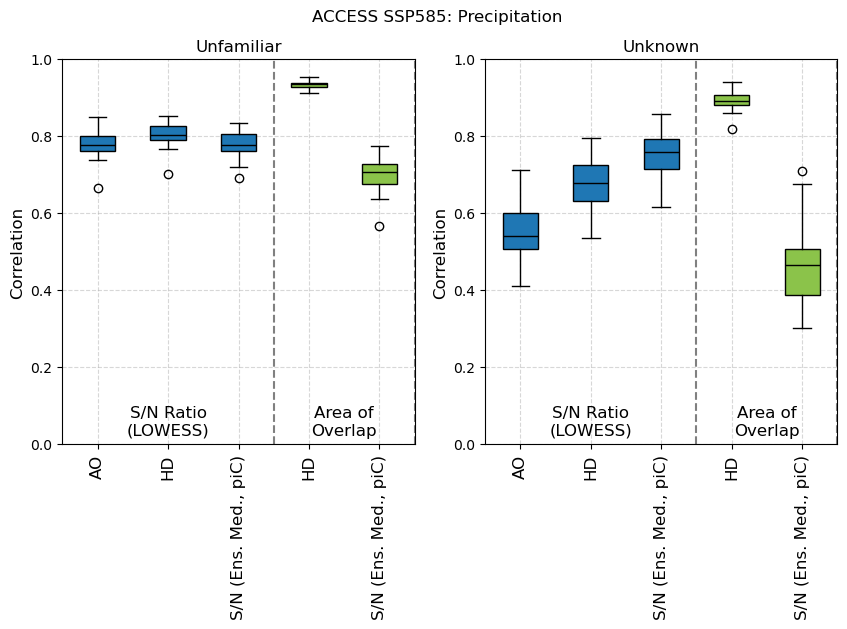

In [436]:
fig = plt.figure(figsize=(10, 5))
axes = [fig.add_subplot(1, 2, i+1) for i in range(2)]

plot_pattern_corr_boxplot(pattern_memeber_corr_unfamiliar_ds, ordered_vars,grouped_vars,
                          title='Unfamiliar', fig=fig, ax=axes[0])


plot_pattern_corr_boxplot(pattern_memeber_corr_unknown_ds, ordered_vars,grouped_vars,
                          title='Unknown', fig=fig, ax=axes[1])

fig.suptitle(toe_plots.NAME_MAPPING[variable])

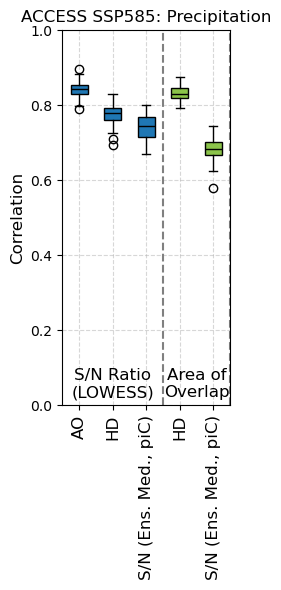

In [437]:
# Build DataFrame for boxplotting
df = pd.DataFrame({v: pattern_memeber_corr_ds[v].values for v in ordered_vars})

# Remove empty groups
grouped_vars_clean = {k: v for k, v in grouped_vars.items() if v}

# Build label lists
group_labels = []
sub_labels = []

for group, vars_list in grouped_vars_clean.items():
    for v in vars_list:
        group_labels.append(group)
        sub = v.replace(group, '').replace('_and_', '')
        sub_labels.append(sub)

# Plot
fig, ax = plt.subplots(figsize=(len(sub_labels) * 0.5, 6))
box = ax.boxplot(df.values, patch_artist=True)
for line in box['medians']:
    line.set_color('black')

# Color boxes based on group
for i, patch in enumerate(box['boxes']):
    group = group_labels[i]
    if group == 'sn_lowess_base':
        patch.set_facecolor(toe_plots.TEST_STYLES['sn']['color'])
    elif group == 'frac':
        patch.set_facecolor(toe_plots.TEST_STYLES['frac']['color'])
    elif group == 'ks':
        patch.set_facecolor(toe_plots.TEST_STYLES['ks']['color'])
    else:
        patch.set_facecolor('lightgray')

# Set sub-labels
xticks = np.arange(1, len(sub_labels) + 1)
ax.set_xticks(xticks)
sub_labels_full = [toe_plots.METRIC_MAP_SHORT[met] for met in sub_labels]
ax.set_xticklabels(sub_labels_full, rotation=90, fontsize=12)
# ax.set_xlim(0, ax.get_xlim()[-1]-0.5)
ax.set_ylabel("Correlation", fontsize=12)
ax.set_title(toe_plots.NAME_MAPPING[variable], fontsize=12)

# Vertical lines between groups
group_to_indices = defaultdict(list)
for idx, group in enumerate(group_labels):
    group_to_indices[group].append(idx)

for group, indices in group_to_indices.items():
    last_idx = max(indices)
    ax.axvline(last_idx + 1.5, color='gray', linestyle='--')

# Group labels below
for group, indices in group_to_indices.items():
    middle = np.mean(indices) + 1
    ax.text(middle, 0.1, toe_plots.METRIC_MAP[group],
            ha='center', va='top', transform=ax.get_xaxis_transform(), size=12)

ax.set_ylim(0, 1)

ax.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


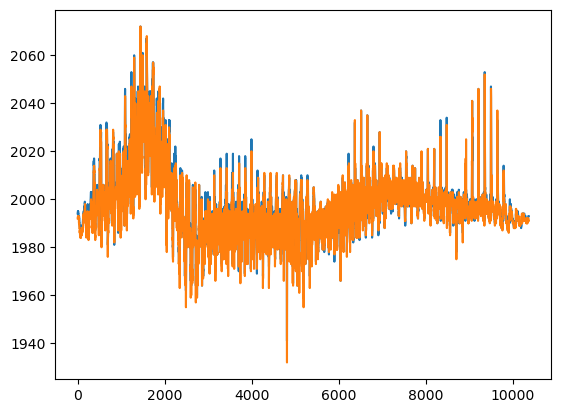

In [449]:
plt.plot(toe_50pct_tree.access_ssp585_tas.sn_lowess_base.values.flatten())
plt.plot(toe_50pct_tree.access_ssp585_tas.ks.values.flatten())

In [448]:
spearmanr(
    toe_50pct_tree.access_ssp585_tas.sn_lowess_base.values.flatten(),
    toe_50pct_tree.access_ssp585_tas.ks.values.flatten(),
)

SignificanceResult(statistic=0.9789583555191673, pvalue=0.0)

In [ ]:
pattern_corr_tree = create_pattern_corr_tree(toe_tree, best_access_metrics)

In [ ]:
pattern_corr_sn_tree = create_pattern_corr_tree(toe_tree_ttest, list(toe_tree_ttest.access_ssp585_tas))

In [ ]:
pattern_corr_unfamiliar_tree = create_pattern_corr_tree(toe_unfamiliar, best_access_metrics_no_hype)

In [ ]:
pattern_corr_unknown_tree = create_pattern_corr_tree(toe_unknown, best_access_metrics_no_hype)

In [ ]:
def plot_corr_heatmap(ax, pattern_corr_ds, relevant_metrics, title=False, heatmap_kwargs=None):
    """
    Plot correlation heatmaps for each branch in a provided data tree.

    Parameters:
    -----------
    axes : list of matplotlib.axes.Axes
        Axes objects for plotting each heatmap subplot.
    pattern_corr_tree : xr.DataTree
        DataTree containing correlation data for each branch.
    relevant_metrics : list of str
        Metrics to be selected and displayed in the heatmaps.
        Colormap for the heatmap.
    title : bool, optional, default=False
        Whether to display titles for each subplot based on branch names.

    Returns:
    --------
    None
    """
    if heatmap_kwargs is None: heatmap_kwargs = {}

    
    metrics = list(set(list(pattern_corr_tree[branch].to_dataset())) & set(relevant_metrics))

    heatmap_data = pattern_corr_ds[metrics].sel(index=metrics).to_pandas().iloc[1:, :-1]

    heatmap = sns.heatmap(heatmap_data, annot=True, annot_kws={"size": 14},
                          fmt=".2f", vmin=0, vmax=1, ax=ax, cbar=False, **heatmap_kwargs)

    heatmap.set_xticklabels([toe_plots.METRIC_MAP_SHORT.get(label.get_text(), label.get_text())
                             for label in heatmap.get_xticklabels()], rotation=90, fontsize=14)

    heatmap.set_yticklabels([toe_plots.METRIC_MAP_SHORT.get(label.get_text(), label.get_text().replace('\n', ' '))
                             for label in heatmap.get_yticklabels()], rotation=0, fontsize=14)

    if title:ax.set_title(NAME_MAPPING.get(branch, branch), fontsize=18, pad=35)

    ax.set_xlabel("")
    ax.set_ylabel("")

In [ ]:
def plot_corr_heatmap_tree(axes, pattern_corr_tree, relevant_metrics, title=False, heatmap_kwargs=None):
    """
    Plot correlation heatmaps for each branch in a provided data tree.

    Parameters:
    -----------
    axes : list of matplotlib.axes.Axes
        Axes objects for plotting each heatmap subplot.
    pattern_corr_tree : xr.DataTree
        DataTree containing correlation data for each branch.
    relevant_metrics : list of str
        Metrics to be selected and displayed in the heatmaps.
        Colormap for the heatmap.
    title : bool, optional, default=False
        Whether to display titles for each subplot based on branch names.

    Returns:
    --------
    None
    """
    if heatmap_kwargs is None: heatmap_kwargs = {}


    for i, branch in enumerate(pattern_corr_tree):
        ax = axes[i]
        metrics = list(set(list(pattern_corr_tree[branch].to_dataset())) & set(relevant_metrics))

        plot_corr_heatmap(ax, pattern_corr_tree[branch].to_dataset(), metrics,
                          heatmap_kwargs=heatmap_kwargs)

In [ ]:
# Define the discrete color levels
levels = np.arange(0, 1.05, .05)
cmap = 'RdYlBu'#'coolwarm_r'  # Use the 'Blues' colormap
norm = BoundaryNorm(levels, ncolors=256)  # Create a normalization for the colorbar

In [ ]:
# Set up the figure with gridspec for a shared colorbar
fig = plt.figure(figsize=(16, 7))
gs = gridspec.GridSpec(2, 2, height_ratios=[0.1] + [1], hspace=0.5, wspace=0.3)
cbar_ax = fig.add_subplot(gs[0, :])  # Top row for the colorbar

# Add the colorbar
cb = ColorbarBase(cbar_ax, cmap=cmap, norm=norm, orientation='horizontal')
cb.ax.set_title('Correlation Coefficient', fontsize=19)
cbar_ax.tick_params(labelsize=15)
cb.set_ticks(levels)
cb.ax.set_xticklabels([f'{level:.2f}'.lstrip('0') for level in levels])  # Set tick labels

# Create the 2x2 grid of heatmaps
axes = [fig.add_subplot(gs[1, i]) for i in range(2)]  # Bottom 2 rows

heatmap_kwargs = dict(norm=norm, cmap=cmap)

plot_corr_heatmap(axes[0], pattern_corr_tree.best_tas.to_dataset(),
                       list(pattern_corr_tree.best_tas),
                       title=False, heatmap_kwargs=heatmap_kwargs)

plot_corr_heatmap(axes[1], pattern_corr_unfamiliar_tree.best_tas.to_dataset(),
                       list(pattern_corr_unfamiliar_tree.best_tas),
                       title=False, heatmap_kwargs=heatmap_kwargs)

# plot_corr_heatmap_tree(axes, pattern_corr_sn_tree,
# list(pattern_corr_sn_tree.access_ssp585_tas), title=True, heatmap_kwargs=heatmap_kwargs)



In [ ]:
# Set up the figure with gridspec for a shared colorbar
fig = plt.figure(figsize=(24, 7))
gs = gridspec.GridSpec(2, 3, height_ratios=[0.1] + [1], hspace=0.5, wspace=0.3)
cbar_ax = fig.add_subplot(gs[0, :])  # Top row for the colorbar

# Add the colorbar
cb = ColorbarBase(cbar_ax, cmap=cmap, norm=norm, orientation='horizontal')
cb.ax.set_title('Correlation Coefficient', fontsize=19)
cbar_ax.tick_params(labelsize=15)
cb.set_ticks(levels)
cb.ax.set_xticklabels([f'{level:.2f}'.lstrip('0') for level in levels])  # Set tick labels

# Create the 2x2 grid of heatmaps
axes = [fig.add_subplot(gs[1, i]) for i in range(3)]  # Bottom 2 rows

heatmap_kwargs = dict(norm=norm, cmap=cmap)
plot_corr_heatmap_tree(axes, pattern_corr_sn_tree, list(pattern_corr_sn_tree.access_ssp585_tas), title=True, heatmap_kwargs=heatmap_kwargs)

In [ ]:
# Define the discrete color levels
levels = np.arange(0, 1.05, .05)
cmap = 'RdYlBu'#'coolwarm_r'  # Use the 'Blues' colormap
norm = BoundaryNorm(levels, ncolors=256)  # Create a normalization for the colorbar

# Set up the figure with gridspec for a shared colorbar
nrows = len(pattern_corr_tree)
fig = plt.figure(figsize=(8*nrows, 22))
gs = gridspec.GridSpec(4, nrows, height_ratios=[0.1] + [1]*3, hspace=0.5, wspace=0.3)
cbar_ax = fig.add_subplot(gs[0, :])  # Top row for the colorbar

# Add the colorbar
cb = ColorbarBase(cbar_ax, cmap=cmap, norm=norm, orientation='horizontal')
cb.ax.set_title('Correlation Coefficient', fontsize=19)
cbar_ax.tick_params(labelsize=15)
cb.set_ticks(levels)
cb.ax.set_xticklabels([f'{level:.2f}'.lstrip('0') for level in levels])  # Set tick labels

# Create the 2x2 grid of heatmaps
axes = [fig.add_subplot(gs[i+nrows]) for i in range(nrows*3)]  # Bottom 2 rows

heatmap_kwargs = dict(norm=norm, cmap=cmap)
plot_corr_heatmap_tree(axes[:nrows], pattern_corr_tree, best_access_metrics, title=True, heatmap_kwargs=heatmap_kwargs)
plot_corr_heatmap_tree(axes[nrows:nrows*2], pattern_corr_unfamiliar_tree, best_access_metrics_no_hype,  heatmap_kwargs=heatmap_kwargs)
plot_corr_heatmap_tree(axes[nrows*2:], pattern_corr_unknown_tree, best_access_metrics_no_hype, heatmap_kwargs=heatmap_kwargs)

destroy_ax(axes[-1])
destroy_ax(axes[-4])


axes[0].set_ylabel('Unusual', fontsize=25);
axes[3].set_ylabel('Unfamiliar', fontsize=25);
axes[6].set_ylabel('Unknown', fontsize=25);

In [ ]:
plt.figure(figsize=(8, 6))
heatmap = sns.heatmap(
    pattern_corr_tree['access_ssp585_tas'].to_dataset().to_pandas().iloc[1:, :-1], annot=True, cmap='Blues', fmt='.2f', vmin=0, vmax=1)

# Change the ticks to long names
heatmap.set_xticklabels(
    [NAME_MAPPING.get(text.get_text(), text.get_text()) for text in heatmap.get_xticklabels()]
)
heatmap.set_yticklabels([METRIC_MAP.get(text.get_text(), text.get_text()) for text in heatmap.get_yticklabels()])

plt.title('Pattern Correlations');
plt.xticks(rotation=45, fontsize=14);  # Rotate x-axis labels for better readability
plt.yticks(rotation=0, fontsize=14) ;  # Keep y-axis labels horizontal

<h3 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Cross Emergence </h3>

In [ ]:
from scipy.stats import gaussian_kde

In [ ]:
def generate_histogram(arr: np.ndarray, bins: np.ndarray) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Generate a histogram from the input array.

    Parameters:
    arr (np.ndarray): The input array to generate the histogram from.
    bins (np.ndarray): The bin edges for the histogram.

    Returns:
    tuple[np.ndarray, np.ndarray, np.ndarray]: A tuple containing the bin centers, the histogram values, and the histogram normalization factor.
    """
    # Remove NaN values from the input array
    vals = arr[np.isfinite(arr)]
    
    # Generate the histogram
    hist, bin_edges = np.histogram(vals, bins=bins, density=True)
    
    # Calculate the histogram normalization factor
    hist_norm = np.sum(hist)
    
    # Normalize the histogram
    hist = hist/hist_norm
    
    # Calculate the bin centers
    bin_centers = (bins[:-1] + bins[1:]) / 2
    
    return bin_centers, hist, hist_norm


def generate_kde(arr: np.ndarray, hist_norm: float, bin_edges: np.ndarray) -> tuple[gaussian_kde, np.ndarray]:
    """
    Generate a kernel density estimate (KDE) from the input array.

    Parameters:
    arr (np.ndarray): The input array to generate the KDE from.
    hist_norm (float): The histogram normalization factor.
    bin_edges (np.ndarray): The bin edges for the histogram.

    Returns:
    tuple[gaussian_kde, np.ndarray]: A tuple containing the KDE generator and the normalized KDE values.
    """
    # Generate the KDE
    arr = arr[np.isfinite(arr)]
    kde_generator = gaussian_kde(arr)
    
    # Generate a grid of x values for the KDE
    x_grid = np.linspace(bin_edges[0], bin_edges[-1], 1000)
    
    # Evaluate the KDE at the x grid points
    kde_values = kde_generator(x_grid)
    
    # Normalize the KDE values
    kde_values_normalized = kde_values/hist_norm
    
    return kde_generator, kde_values_normalized

In [ ]:
def plot_histogram_and_kde(bin_centers, histogram, histogram_norm, kde_generator, kde_values_normalized,
                   data, fig=None, ax=None, fontscale=1, *args, **kwargs):
    """
    Plots a histogram and kernel density estimate (KDE) for the input data.

    Parameters:
    bin_centers (array): The bin centers for the histogram.
    histogram (array): The histogram values.
    histogram_norm (float): The normalization factor for the histogram.
    kde_generator (function): The KDE generator function.
    kde_values_normalized (array): The normalized KDE values.
    data (DataFrame): The input data.

    Returns:
    fig, ax (tuple): The figure and axis objects for the plot.
    """
    if fig is None and ax is None:
        fig, ax = plt.subplots()

    # Plot the histogram with bars of width equal to the bin width
    # (accounting for floating point errors)
    ax.bar(bin_centers, histogram, width=np.unique(np.diff(bin_centers))[0].round(2), alpha=0.5)
    
    # Generate x values for the KDE plot
    x_grid = np.linspace(bin_centers[0], bin_centers[-1], 1000)
    
    # Plot the KDE
    ax.plot(x_grid, kde_values_normalized, label='KDE', color='black')
    
    # Set the axis labels and title
    ax.set_ylabel('Relative Frequency', fontsize=20*fontscale)
    ax.set_xlabel(kwargs.get('xlabel','Value'))
    ax.grid(True, alpha=0.3, color='grey', linestyle='--')

    # Calculate and plot the quantiles
    quantiles = {}
    percentiles = [0.05, 0.25, 0.5, 0.75, 0.95]
    for q in percentiles:
        qval = np.nanpercentile(data, q*100).round(2).item()
        quantiles[q] = qval
        rf_val = kde_generator(qval).item()/ histogram_norm
        if q==0.5: style_dict = dict(linewidth=3, color='k')
        elif q==0.25 or q==0.75: style_dict = dict(linewidth=2, color='k', linestyle='--')
        elif q ==percentiles[0] or q==percentiles[-1]: style_dict = dict(linewidth=2, color='k', linestyle=':')

        # Plot the quantiles as vertical lines
        ax.plot([qval, qval], [0, rf_val], **style_dict)

        # round_number = lambda n: round(n - 0.05) if n % 10 != 0 else round(n)
        # ax.annotate(round_number(qval), xy=(qval+0.025*np.max(bincenters), 0),
        #             size=16, ha='center')

    # print(quantiles)
    
    return fig, ax

In [ ]:
def calculate_and_plot_histogram(data, bins, fig=None, ax=None, fontscale=1, **kwargs):
    """
    Plots the distribution of values.

    Parameters:
    data (array-like): The data to plot.
    bins (array-like): The bins for the histogram.
    xlabel (str, optional): The label for the x-axis. Defaults to 'Distribution Overlap (%)'.

    Returns:
    fig, ax: The figure and axis objects for the plot.
    """
    bin_centers, histogram, histogram_norm = generate_histogram(data.flatten(), bins)
    kde_generator, kde_values_normalized = generate_kde(data.flatten(), histogram_norm, bin_centers)
    fig, ax = plot_histogram_and_kde(bin_centers, histogram, histogram_norm, kde_generator, kde_values_normalized, 
                             data, fig=fig, ax=ax, fontscale=fontscale)
    
    # ax.set_title(kwargs.get('title', ''), fontsize=25)
    # ax.set_xlabel(kwargs.get('xlabel', ''), fontsize=20)

    return fig, ax

In [ ]:
def create_x_and_y_control_dict(good_xandy):

    ordered_vars = [
        'sn_lowess_base', 'ks', 'ttest', 'frac',
        'perkins', 'hd']
    
    # Custom sorting function
    def custom_sort(value):
        return ordered_vars.index(value)
    
    good_xandy_dict = {}
    for item in good_xandy:
        key, value = item.split('_at_')
        value = value.split('_emergence')[0]
        good_xandy_dict.setdefault(key, []).append(value)
    
    # Sort each list based on the custom order
    for key in good_xandy_dict: good_xandy_dict[key] = sorted(good_xandy_dict[key], key=custom_sort)
    
    good_xandy_dict = {key: good_xandy_dict[key] for key in ordered_vars if key in good_xandy_dict}
    
    return good_xandy_dict

In [ ]:
# METRIC_MAP_SHORT = {
#  'sn_lowess_base': 'S/N',
#  'ks': 'KS',
#  'ttest': 'T-Test',
#  'perkins': 'PSS',
#  'frac': 'FGA',
#  'hd': 'HD'
# }

In [ ]:

def create_x_at_y_median_iqr(x_at_y_emergence_tree, good_xandy_dict):

    
    order = np.concatenate(
        [[f'{key}_at_{value}_emergence' for value in good_xandy_dict[key]]for key in good_xandy_dict.keys()])
    
    x_and_y_av_dict = {}
    x_and_y_iqr_dict = {}
    
    for variable in x_at_y_emergence_tree:
        xand_ds = np.abs(x_at_y_emergence_tree[variable].to_dataset()[good_xandy])
        x_and_y_av_dict[variable] = xand_ds.median().to_pandas()
        x_and_y_iqr_dict[variable] = (xand_ds.quantile(0.75) - xand_ds.quantile(0.25)).to_pandas()
    
    x_and_y_av_df = pd.concat(x_and_y_av_dict, axis=1).loc[order]
    x_and_y_iqr_df = pd.concat(x_and_y_iqr_dict, axis=1).loc[order]
    
    return x_and_y_av_df, x_and_y_iqr_df

In [ ]:
def create_percent_error_df(x_and_y_av_df, threshold_profile):
    percent_error_df = x_and_y_av_df.copy()
    # Create a boolean mask: True where row label (index) starts with "sn", False otherwise.
    sn_mask = percent_error_df.index.str.startswith('sn')
    overlap_mask = percent_error_df.index.str.startswith('frac') | percent_error_df.index.str.startswith('perkins')
    hd_mask = percent_error_df.index.str.startswith('hd')
    
    
    # Subtract 1 from rows starting with "sn"
    percent_error_df.loc[sn_mask] = 100*(percent_error_df.loc[sn_mask] - threshold_profile.sn_threshold)
    percent_error_df.loc[overlap_mask] = 100*(percent_error_df.loc[overlap_mask] - threshold_profile.overlap_threshold)/threshold_profile.overlap_threshold
    percent_error_df.loc[hd_mask] = 100*(percent_error_df.loc[hd_mask] - threshold_profile.hd_threshold)/threshold_profile.hd_threshold
    percent_error_df = percent_error_df.map(abs)

    return percent_error_df

In [ ]:
cross_emergence_tree = x_at_y_emergence_tree#x_at_y_emergence_tree
profile = toe_const.ThresholdProfileUnusual#toe_const.ThresholdProfileUnusual
toe_profile_label = 'Unusual'

In [ ]:
# cross_emergence_tree = x_at_y_emergence_unknown_tree#x_at_y_emergence_tree
# profile = toe_const.ThresholdProfileUnknown#toe_const.ThresholdProfileUnusual
# toe_profile_label = 'Unknown'

In [ ]:
banned_xandy = {'sn_lowess_full', 'hawkins', 'sn_mean', 'sn_mean_roll'}
xaty_mets = list(cross_emergence_tree.best_tas)

In [ ]:
if banned_xandy is None: banned_xandy = {}

# Extract valid keys from the dataset, excluding any that contain a banned term
good_xandy = [metric for metric in xaty_mets
              if not any(banned in metric for banned in banned_xandy)]


good_xandy_dict = create_x_and_y_control_dict(good_xandy)

In [ ]:
x_and_y_av_df, x_and_y_iqr_df = create_x_at_y_median_iqr(
    cross_emergence_tree, good_xandy_dict)

In [ ]:
percent_error_df = create_percent_error_df(x_and_y_av_df, profile)

In [ ]:
percent_error_df.head()

In [ ]:
# This is for the purpoe os the heatmap
# Signal to noise is to 2 dp, overlap is to 2dp and iqr in brackets
# e.g. 1.01 (0.3)
av_map_to_string = lambda val: f'{val:.2f}'if val < 10 else f'{int(np.round(val, 0))}'
iqr_map_to_string = lambda val: f' ({val:.1f})'if val < 10 else f' ({val:0.1f})'

x_and_y_formatted_df = x_and_y_av_df.map(av_map_to_string)+ x_and_y_iqr_df.map(iqr_map_to_string)
x_and_y_formatted_df.tail()

In [ ]:
ylabels = []
main_type = percent_error_df.index.values[0].split('_at')[0]
for num, xandy_type in enumerate(percent_error_df.index.values):
    current_type = xandy_type.split('_at')[0]
    secondary_type = xandy_type.split('at_')[-1].split('_emergence')[0]

    if current_type != main_type or num == 0:
        main_type = current_type
        main_type_str = toe_plots.METRIC_MAP_SHORT.get(current_type, current_type).replace('\n', '')
        start_tag = f'{main_type_str} at : '
    else: start_tag = ''

    ylabel = start_tag + toe_plots.METRIC_MAP_SHORT.get(secondary_type, secondary_type).replace('\n', '')
    ylabels.append(ylabel)

In [ ]:
percent_error_df.head()

In [ ]:
# Define the discrete color levels
levels = np.arange(0, 105, 5)
cmap = 'RdYlBu_r'
norm = BoundaryNorm(levels, ncolors=256)

# Set up the figure with gridspec for a shared colorbar
fig = plt.figure(figsize=(8, 8))
gs = gridspec.GridSpec(4, 1, height_ratios=[1]*3 + [0.15], hspace=0.25)  # Move colorbar to the bottom
cbar_ax = fig.add_subplot(gs[-1, :])  # Bottom row for the colorbar

fig.suptitle(toe_profile_label, fontsize=18)

# Add the colorbar
cb = ColorbarBase(cbar_ax, cmap=cmap, norm=norm, orientation='horizontal')
cb.set_label('Percent Difference', fontsize=12, labelpad=10)
cb.ax.xaxis.set_label_position('bottom')  # Move label to the bottom
cb.set_ticks(levels)
cb.ax.set_xticklabels(levels)

for num, start_metric in enumerate(list(good_xandy_dict)):
    mask = percent_error_df.index.str.startswith(start_metric)
    ax = fig.add_subplot(gs[num])

    heatmap = sns.heatmap(percent_error_df.loc[mask],
                          annot=x_and_y_formatted_df.loc[mask],
                          ax=ax, fmt='',
                          linewidths=0.5, vmin=0, vmax=100, norm=norm,
                          cmap=cmap, cbar=False)

    ylabels = []
    for num2, xandy_type in enumerate(heatmap.get_yticklabels()):
        label = ''
        if num2 == 0:
            current_type = xandy_type.get_text().split('_at')[0]
            label += toe_plots.METRIC_MAP_SHORT.get(current_type, current_type).replace('\n', '')
            label += ' : at '
        secondary_type = xandy_type.get_text().split('at_')[-1].split('_emergence')[0]
        label += toe_plots.METRIC_MAP_SHORT.get(secondary_type, secondary_type).replace('\n', '')
        ylabels.append(label)
    
    heatmap.set_yticklabels(ylabels)

    # Move x-axis labels to the top for all heatmaps
    ax.xaxis.set_label_position('top')
    ax.xaxis.tick_top()

    if num == 0:
        heatmap.set_xticklabels(
            [toe_plots.NAME_MAPPING.get(text.get_text(), text.get_text())
             for text in heatmap.get_xticklabels()]
        )
    else: heatmap.set_xticklabels([''] * len(heatmap.get_xticklabels())); heatmap.set_xticks([])

<h3 style='color:green; background-color:palegoldenrod; padding:10px; border-radius:5px;'> Time series </h3>

In [ ]:
africa_lat_lon = dict(lon=10, lat=12.5, method='nearest')

In [ ]:
fig = plt.figure()
ax = fig.add_subplot()
ax2 = ax.twinx()

# Plot the main lines with specified colors and solid linestyle
time = toe_metric_tree.best_tas.time.dt.year.values
ax.plot(time, toe_metric_tree.best_tas.sn_lowess_base.sel(**africa_lat_lon).values,
        color='lightseagreen', linestyle='-')
ax2.plot(time, toe_metric_tree.best_tas.frac.sel(**africa_lat_lon).values,
         color='red', linestyle='-')

# Add horizontal threshold lines as dashed lines
ax.axhline(1, color='lightseagreen', linestyle='--', linewidth=1.5)
ax2.axhline(62, color='red', linestyle='--', linewidth=1.5)

# Match tick positions and styles
ax.tick_params(axis='both', labelsize=12)
ax2.tick_params(axis='both', labelsize=12)

ax.set_xlim(1895, 2005)
ax2.set_ylim(ax2.get_ylim()[::-1])

# Match y-axis labels styles
ax.set_ylabel("S/N Ratio", fontsize=14, color='lightseagreen')
ax2.set_ylabel("Area of Overlap (%)", fontsize=14, color='red')

# Match y-tick colors
ax.yaxis.label.set_color('lightseagreen')
ax2.yaxis.label.set_color('red')
ax.tick_params(axis='y', colors='lightseagreen')
ax2.tick_params(axis='y', colors='red')
ax.set_title('BEST: TAS (' +plotting_utils.format_latlon(africa_lat_lon) +')', fontsize=18)
ax2.set_title(None)
ax.spines['left'].set_color('lightseagreen'); ax2.spines['right'].set_color('red')


ax.set_xlabel('Year', fontsize=14)

In [ ]:
fig = plt.figure()
ax = fig.add_subplot()
ax2 = ax.twinx()
toe_metric_tree.best_tas.sn_lowess_base.sel(**africa_lat_lon).plot(ax=ax)
toe_metric_tree.best_tas.frac.sel(**africa_lat_lon).plot(ax=ax2)

ax2.axhline(62)
ax.axhline(1)

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111)#, projection=ccrs.PlateCarree())
(toe_tree.best_tas.sn_lowess_base - toe_tree.best_tas.ks).sel(lat=slice(0, 20), lon=slice(0, 30)).plot(ax=ax)
# ax.coastlines()

<h1 style='color:yellow'> Different Base Periods </h1>

<h2 style='color:cyan; background-color:#0b3d3b; padding:10px; border-radius:5px;'>Opening Data </h2>

In [ ]:
metric_base_period_best_ds = xr.open_dataset(
    '/g/data/w40/ab2313/time_of_emergence/toe_metrics/'
    'best_tas_multi_base_period.zarr',
    engine='zarr'
).chunk(CHUNK_DICT['best_tas']).persist()
wait(metric_base_period_best_ds);

In [ ]:
ACCESS_CHUNKS = {'time':-1, 'member':1, 'lat': 72, 'lon':144//2} # 80 chunks

In [ ]:
metric_base_period_access_ds = xr.open_dataset(
    '/g/data/w40/ab2313/time_of_emergence/toe_metrics/'
    'access_ssp585_tas_multi_base_period_v4.zarr',
    engine='zarr', drop_variables = ['noise', 'sn_roll', 'signal', 'noise_roll', 'sn_lowess_full']
).chunk(ACCESS_CHUNKS).persist()
wait(metric_base_period_access_ds);

In [ ]:
metric_base_period_access_ds

<h2 style='color:cyan; background-color:#0b3d3b; padding:10px; border-radius:5px;'> Calculations </h2>

In [ ]:
# toe_base_period_best_ds = get_permanent_exceedance_multi_metrics(
#     metric_base_period_best_ds, toe_const.ThresholdProfileUnusual).persist()
# wait(metric_base_period_best_ds);

In [ ]:
toe_base_period_access_ds = get_permanent_exceedance_multi_metrics(
    metric_base_period_access_ds, toe_const.ThresholdProfileUnusual).persist()
wait(toe_base_period_access_ds);

In [ ]:
toe_unfamiliar_base_period_access_ds = get_permanent_exceedance_multi_metrics(
    metric_base_period_access_ds[['sn', 'frac']], toe_const.ThresholdProfileUnfamiliar).persist()
wait(toe_unfamiliar_base_period_access_ds);

In [ ]:
toe_unknown_base_period_access_ds = get_permanent_exceedance_multi_metrics(
    metric_base_period_access_ds[['sn', 'frac']], toe_const.ThresholdProfileUnknown).persist()
wait(toe_unknown_base_period_access_ds);

In [ ]:
def get_toe_delay(ds: xr.Dataset) -> xr.DataArray:
    """
    Calculate the delay in Time of Emergence (ToE) relative to the center of each base period.

    Parameters:
    ds (xr.Dataset): An xarray Dataset containing a coordinate 'base_period' 
                     with values formatted as strings (e.g., '1990_2000').

    Returns:
    xr.DataArray: A DataArray representing the delay in ToE for each base period.
    """
    time_until_emergence_stor = []
    
    for base_period in list(ds.base_period.values):
        # The start of the base period + half the length of the base period
        base_period_center = int(base_period.split('_')[0]) + 15
    
        toe_delay_ds = ds.sel(base_period=base_period) - base_period_center
        
        time_until_emergence_stor.append(toe_delay_ds)
    
    time_until_emergence_ds = xr.concat(time_until_emergence_stor, dim='base_period')

    return time_until_emergence_ds


In [ ]:
time_until_emergence_access_ds = get_toe_delay(toe_base_period_access_ds.median(dim='member'))
time_until_emergence_unfamiliar_access_ds = get_toe_delay(toe_unfamiliar_base_period_access_ds.median(dim='member'))
time_until_emergence_unknown_access_ds = get_toe_delay(toe_unknown_base_period_access_ds.median(dim='member'))

In [ ]:
# quantiles = [0.05, 0.5, 0.95] 
quantiles = [0.01, 0.25, 0.5, 0.75, 0.99]

In [ ]:
time_until_emergence_access_stats = time_until_emergence_access_ds.quantile(
   quantiles , dim=['lat', 'lon']).compute()

In [ ]:
time_until_emergence_unfamiliar_access_stats = time_until_emergence_unfamiliar_access_ds.quantile(
    quantiles, dim=['lat', 'lon']).compute()

time_until_emergence_unknown_access_stats = time_until_emergence_unknown_access_ds.quantile(
    quantiles, dim=['lat', 'lon']).compute()

In [ ]:
# time_until_emergence_best_ds = get_toe_delay(toe_base_period_best_ds)
# time_until_emergence_best_ds = time_until_emergence_best_ds.isel(base_period=slice(None, -5))

In [ ]:
# time_until_emergence_best_stats_ds = time_until_emergence_best_ds.quantile(
#     [0.05, 0.5, 0.95], dim=['lat', 'lon']).compute().sortby('base_period')

In [ ]:
# time_until_emergence_best_stats_ds.base_period.values

In [ ]:
def percent_not_emerging(ds, dim):
    percent_ds = 100*ds.count(dim=dim)/xr.where(ds, 1, 1).count(dim=dim)
    return percent_ds

In [ ]:
percent_access = percent_not_emerging(toe_base_period_access_ds, dim=['member', 'lat', 'lon']).compute()
percent_access_unknown = percent_not_emerging(toe_unknown_base_period_access_ds, dim=['member', 'lat', 'lon']).compute()
percent_access_unfamiliar = percent_not_emerging(toe_unfamiliar_base_period_access_ds, dim=['member', 'lat', 'lon']).compute()

In [ ]:
# toe_base_period_best_ds.sortby('base_period').sn.isel(base_period=[0, 10, -10, -1]).plot(col='base_period', col_wrap=2)

<h2 style='color:cyan; background-color:#0b3d3b; padding:10px; border-radius:5px;'>Plots </h2>

In [ ]:
def plot_time_until_emergence(
    time_until_emergence_stats_ds: xr.Dataset,
    fig=None, axes=None, 
    add_legend=True, annotate=True,
    ylim:float=150, ylabel='Years Until Emergence', c=None,
):
    """
    Plots the time until emergence using different statistical metrics.
    
    Parameters:
    time_until_emergence_stats_ds : xarray.Dataset
        Dataset containing time until emergence statistics.
    fig : matplotlib.figure.Figure, optional
        Figure object to use for plotting. If None, a new figure is created.
    axes : list of matplotlib.axes.Axes, optional
        List of axes to use for plotting. If None, new axes are created.
    
    Returns:
    fig : matplotlib.figure.Figure
        The figure containing the plot.
    axes : list of matplotlib.axes.Axes
        The list of axes used in the plot.
    """


    import matplotlib.lines as mlines
    import matplotlib.patches as mpatches

    toe_metrics = list(time_until_emergence_stats_ds)
    base_period_centres = np.array([
        int(x.split('_')[0]) + 15 for x in time_until_emergence_stats_ds.base_period.values
    ])
    
    if fig is None or axes is None:
        fig = plt.figure(figsize=(6, 2*len(toe_metrics)))
        gs = gridspec.GridSpec(len(toe_metrics), 1, hspace=0.1)
        axes = [fig.add_subplot(gs[i]) for i in range(len(toe_metrics))]
    
    for num, metric in enumerate(toe_metrics):
        ax = axes[num]
        ax.grid(True, linestyle='--', color='grey', alpha=0.5)

        color = toe_plots.TEST_STYLES[metric]['color'] if c is None else c
        label = toe_plots.METRIC_MAP[metric]

        ax.fill_between(
            base_period_centres,
            time_until_emergence_stats_ds[metric].sel(quantile=0.01).values,
            time_until_emergence_stats_ds[metric].sel(quantile=0.99).values,
            color=color, alpha=.75
        )

        # ax.fill_between(
        #     base_period_centres,
        #     time_until_emergence_stats_ds[metric].sel(quantile=0.25).values,
        #     time_until_emergence_stats_ds[metric].sel(quantile=0.75).values,
        #     color=color, alpha=.75
        # )
        
        ax.plot(
            base_period_centres, 
            time_until_emergence_stats_ds[metric].sel(quantile=0.5).values,
            color='k', label=label
        )
        
        if annotate: ax.annotate(
            label, xy=(0.5, 0.7), xycoords='axes fraction', ha='center', va='center',
            color='k', fontsize=12
        )
        
        ax.set_ylim(0, ylim)
        ax.set_title('')
        ax.set_xlim(np.take(base_period_centres, [0, -1]))

        if num == 1:
            ax.set_xticklabels('')
            ax.set_xlabel('')   
        if num == 0:
            # ax.xaxis.set_label_position('top')
            ax.xaxis.tick_top()

    if ylabel: axes[1].set_ylabel(ylabel, fontsize=12)
    
    for ax in [axes[-1]]:#np.take(axes, [-1, 0]):
        ax.set_xlabel('Base Period Central Year (length=30 years)', fontsize=12)

    if add_legend:
        # Create custom legend handles
        black_line = mlines.Line2D([], [], color='k', label='Median')
        shaded_area = mpatches.Patch(color='grey', alpha=0.5, label='1st to 99th Percentile')
        
        # Place the legend outside the plot
        axes[0].legend(handles=[black_line, shaded_area], loc='upper right', fontsize=12)
    
    return fig, axes

In [ ]:
def percent_emerged_plot_adder(ds, metrics, axes):
    axes_twinx = []
    for metric, ax in zip(metrics, axes):
        ax_twinx = ax.twinx()
        ax_twinx.plot(ax.lines[0].get_xdata(), ds[metric].values, linewidth=1, color='purple')
        ax_twinx.set_ylim(0, 102)
        axes_twinx.append(ax_twinx)
        # Set tick labels, y-ticks, and right spine to purple
        ax_twinx.tick_params(axis='y', colors='purple')
        ax_twinx.yaxis.label.set_color('purple')
        ax_twinx.spines['right'].set_color('purple')
    return axes_twinx

In [ ]:
plt.figure(figsize=(6, 2))
plt.plot(percent_access.sn.values)
plt.plot(percent_access_unknown.sn.values)
plt.plot(percent_access_unfamiliar.sn.values)

In [ ]:
# Create figure and gridspec (multiple rows, 1 column)
fig = plt.figure(figsize=(5, 8))
gs = gridspec.GridSpec(3, 1, hspace=0.1)
axes = [fig.add_subplot(gs[i]) for i in range(3)]


plot_kwargs = dict(ylim=230, ylabel=None, add_legend=False, annotate=False)


plot_time_until_emergence(time_until_emergence_access_stats[['sn', 'frac', 'ks']],
                          fig=fig, axes=axes, annotate=False, ylim=plot_kwargs['ylim'], c='green');

plot_time_until_emergence(time_until_emergence_unfamiliar_access_stats[['sn', 'frac']],
                          fig=fig, axes=axes, c='yellow', **plot_kwargs);
plot_time_until_emergence(time_until_emergence_unknown_access_stats[['sn', 'frac']],
                          fig=fig, axes=axes, c='blue', **plot_kwargs);


percent_emerged_plot_adder(percent_access, ['sn', 'frac', 'ks'], axes_left);
percent_emerged_plot_adder(percent_access_unfamiliar, ['sn', 'frac'], axes_middle);
axes_twinx_right = percent_emerged_plot_adder(percent_access_unknown, ['sn', 'frac'], axes_right);

axes_twinx_right[1].set_ylabel('Percent with No Emergence', fontsize=12)


titles = ['Unusual', 'Unfamiliar', 'Unknown']
for title, ax in zip(titles, [axes_left[0], axes_middle[0], axes_right[0]]): ax.set_title(title, fontsize=14)

for label, ax in zip(['sn', 'frac', 'ks'],axes_left):
    ax.annotate(toe_plots.METRIC_MAP.get(label, label), xy=(-0.3, 0.6), fontsize=14,
                ha='center', va='center', xycoords='axes fraction', rotation=90)
    ax.set_ylabel('Years Until Emergence', fontsize=12)

In [ ]:
data_tree.access_ssp585_tas.tas.sel(lat=-39, lon=145, method='nearest').isel(member=0).plot()

In [ ]:
time_until_emergence_access_stats['frac'].sel(base_period='1985_2014')

In [ ]:
# Create figure and gridspec (multiple rows, 1 column)
fig = plt.figure(figsize=(14, 8))
gs = gridspec.GridSpec(3, 3, hspace=0.1, wspace=0.25)
axes_left = [fig.add_subplot(gs[i, 0]) for i in range(3)]
axes_middle = [fig.add_subplot(gs[i, 1]) for i in range(2)]
axes_right = [fig.add_subplot(gs[i, 2]) for i in range(2)]


plot_kwargs = dict(ylim=230, ylabel=None, add_legend=False, annotate=False)


plot_time_until_emergence(time_until_emergence_access_stats[['sn', 'frac', 'ks']],
                          fig=fig, axes=axes_left, annotate=False, ylim=plot_kwargs['ylim']);

plot_time_until_emergence(time_until_emergence_unfamiliar_access_stats[['sn', 'frac']],
                          fig=fig, axes=axes_middle, **plot_kwargs);
plot_time_until_emergence(time_until_emergence_unknown_access_stats[['sn', 'frac']],
                          fig=fig, axes=axes_right, **plot_kwargs);


percent_emerged_plot_adder(percent_access, ['sn', 'frac', 'ks'], axes_left);
percent_emerged_plot_adder(percent_access_unfamiliar, ['sn', 'frac'], axes_middle);
axes_twinx_right = percent_emerged_plot_adder(percent_access_unknown, ['sn', 'frac'], axes_right);

axes_twinx_right[1].set_ylabel('Percent with No Emergence', fontsize=12)


titles = ['Unusual', 'Unfamiliar', 'Unknown']
for title, ax in zip(titles, [axes_left[0], axes_middle[0], axes_right[0]]): ax.set_title(title, fontsize=14)

for label, ax in zip(['sn', 'frac', 'ks'],axes_left):
    ax.annotate(toe_plots.METRIC_MAP.get(label, label), xy=(-0.3, 0.6), fontsize=14,
                ha='center', va='center', xycoords='axes fraction', rotation=90)
    ax.set_ylabel('Years Until Emergence', fontsize=12)

In [ ]:
plot_time_until_emergence(time_until_emergence_access_stats, ylim=100);

<h3 style='color:green'>  Large Ensemble Sample Plots </h3>

#### ToE of data

In [ ]:
# signal_tree.access_ssp585_tas = signal_tree.access_ssp585_tas

In [ ]:
le_pi_ds_noise = le_pi_ds.std(dim='time').compute()
le_pi_ds_noise

In [ ]:
singal_ens_median = data_tree.access_ssp585_tas.to_dataset().tas.median(dim='member')

In [ ]:
# Noise of just the base period
access_noise_base_period = (signal_tree
                           .access_ssp585_tas.to_dataset()
                           .noise_lowess
                           .isel(time=slice(0,30))
                           .std(dim='time')
                           .median(dim='member')
                           .compute()
                           )

# Noise of the whole series
access_noise_full = (signal_tree
                    .access_ssp585_tas.to_dataset()
                    .noise_lowess
                    .std(dim='time')
                    .median(dim='member')
                    .compute()
                   )

In [ ]:
std_levels = np.arange(0, 2.1, .1)
std_cmap = plt.cm.terrain_r

In [ ]:
le_pi_ds_noise

In [ ]:
access_noise_base_period#/le_pi_ds_noise

In [ ]:
fig = plt.figure(figsize=(12, 3))
gs = gridspec.GridSpec(2, 3, height_ratios=[1, 0.1])

axes = [fig.add_subplot(gs[i], projection=ccrs.PlateCarree()) for i in range(3)]

plot_kwargs = dict(add_colorbar=False, levels=std_levels, cmap=std_cmap)

access_noise_base_period.plot(ax=axes[0], **plot_kwargs)
access_noise_full.plot(ax=axes[1], **plot_kwargs)
le_pi_ds_noise.plot(ax=axes[2], **plot_kwargs)


axes[0].set_title('Base Period')
axes[1].set_title('Full Simulation')
axes[2].set_title('Pi-Control')

[ax.coastlines() for ax in axes];

cbar1 = plotting_utils.create_discrete_colorbar(
        std_cmap, std_levels, plt.subplot(gs[-1, :]) ,
        r'Standard Deviation ' + r'$(\circ C)$', fontscale=1, orientation='horizontal', pad=7,
    tick_slice = slice(None, None, 2)
    )

In [ ]:
singal_access_ds = signal_tree.access_ssp585_tas.to_dataset().signal_lowess

In [ ]:
sn_bp = singal_access_ds/access_noise_base_period
sn_full = singal_access_ds/access_noise_full
sn_pi = singal_access_ds/le_pi_ds_noise
sn_ens_med = singal_ens_median/le_pi_ds_noise

In [ ]:
sn_ens_med = sn_ens_med.compute()

In [ ]:
toe_bp = toe_calc.get_permanent_exceedance(sn_bp, 1, np.greater)
toe_full = toe_calc.get_permanent_exceedance(sn_full, 1, np.greater)
toe_pi = toe_calc.get_permanent_exceedance(sn_pi, 1, np.greater)
toe_ens_med = toe_calc.get_permanent_exceedance(sn_ens_med, 1, np.greater)

In [ ]:
fig = plt.figure(figsize=(12, 6))
gs = gridspec.GridSpec(3, 2, height_ratios=[1, 1, 0.1])

axes = [fig.add_subplot(gs[i], projection=ccrs.PlateCarree()) for i in range(4)]

plot_kwargs = dict(add_colorbar=False, levels=np.arange(1980, 2100, 10), cmap=std_cmap)

toe_bp.median(dim='member').plot(ax=axes[0], **plot_kwargs)
toe_full.median(dim='member').plot(ax=axes[1], **plot_kwargs)
toe_pi.median(dim='member').plot(ax=axes[2], **plot_kwargs)
toe_ens_med.plot(ax=axes[3], **plot_kwargs)



axes[0].set_title('Base Period')
axes[1].set_title('Full Simulation')
axes[2].set_title('Pi-Control')

[ax.coastlines() for ax in axes];

cbar1 = plotting_utils.create_discrete_colorbar(
        std_cmap, std_levels, plt.subplot(gs[-1, :]) ,
        r'Standard Deviation ' + r'$(\circ C)$', fontscale=1, orientation='horizontal', pad=7,
    tick_slice = slice(None, None, 2)
    )

In [ ]:
toe_pi.median(dim='member').plot()

In [ ]:
sn_pi.sel(lat=-39, lon=145, method='nearest').median(dim='member').plot()
sn_full.sel(lat=-39, lon=145, method='nearest').median(dim='member').plot()
sn_bp.sel(lat=-39, lon=145, method='nearest').median(dim='member').plot();

In [ ]:
sn_pi.sel(lat=-39, lon=145, method='nearest').plot(hue='member', add_legend=False);
sn_full.sel(lat=-39, lon=145, method='nearest').plot(hue='member', add_legend=False);
sn_bp.sel(lat=-39, lon=145, method='nearest').plot(hue='member', add_legend=False);

In [ ]:
le_pi_ds_noise.plot()

<h1 style='color:yellow'> Different Resolution</h1>

<h2 style='color:cyan'> Opening Data </h2>

In [ ]:
def extract_resolution(s):
    """Extracts numeric resolution as an integer tuple (smaller first)."""
    match = re.search(r"_(\d+)p0x(\d+)p0", s)
    if match:
        return tuple(map(int, match.groups()))  # Convert '4p0x4p0' -> (4, 4)
    return (float('inf'), float('inf'))  # Pl

In [ ]:
def natural_sort_key(s):
    """Extract the leading number from the filename for sorting."""
    match = re.search(r'(\d+)p\d+x\d+', s)
    return int(match.group(1)) if match else float('inf')

In [ ]:
BEST_RES_PATH = '/g/data/w40/ab2313/time_of_emergence/toe_metrics/best_tas_regrid_conservative'

In [ ]:
# Files that contain different resolutions for best
# resultion_pattern = re.compile(r"_\d+p0x\d+p0")  # Matches "_Xp0xXp0" where X is any number
# resolution_files = [s for s in all_files if resultion_pattern.search(s)]
# resolution_files = sorted(resolution_files, key=extract_resolution)
# resolution_files = np.insert(resolution_files, 0, 'best_tas_(1920_1950)')
resolution_files = np.sort(os.listdir(BEST_RES_PATH))
resolution_files = np.array([f for f in resolution_files if 'zarr' in f])
resolution_files

In [ ]:
resolution_files = sorted(resolution_files, key=natural_sort_key)
resolution_files

In [ ]:
resolution_file_manager = FileNameManager(resolution_files, BEST_RES_PATH)
resolution_file_manager

In [ ]:
resolution_dict = resolution_file_manager.generate_dict(extension='zarr')
resolution_dict

In [ ]:
CHUNK_DICT#['best_tas']

In [ ]:
%%time
best_resolution_tree = open_files_datatree(
    resolution_dict, tree_name='resolution', engine='zarr', use_cftime=True,
    chunks={'time':-1, 'lat':'auto', 'lon':'auto'}).persist()
wait(best_resolution_tree);

In [ ]:
list(best_resolution_tree)

In [ ]:
best_resolution_tree['16p0x16p0']

<h2 style='color:cyan'> Calculations </h2>

In [ ]:
list(best_resolution_tree)

In [ ]:
to_tree = {}

for branch in list(best_resolution_tree):
    ds = best_resolution_tree[branch].to_dataset()
    ds = ds.where(ds.notnull(), np.nan).squeeze()[['ks', 'frac', 'sn']]
    
    to_tree[branch] = get_permanent_exceedance_multi_metrics(
        ds, toe_const.ThresholdProfileUnusual, 'INFO').compute()

In [ ]:
toe_best_resolution_tree = xr.DataTree.from_dict(to_tree)

In [ ]:
# toe_best_resolution_tree = best_resolution_tree.map_over_datasets(
#     get_permanent_exceedance_multi_metrics, toe_const.ThresholdProfileUnusual, 'INFO').compute()

In [ ]:
list(toe_best_resolution_tree)

In [ ]:
metric = 'sn'

In [ ]:
fig = plt.figure(figsize=(20, 20))
axes = [fig.add_subplot(len(toe_best_resolution_tree), 3, i+1)
        for i in range(len(toe_best_resolution_tree))]

for num, branch in enumerate(list(toe_best_resolution_tree)):
    ax = axes[num]
    res_da = toe_best_resolution_tree[branch].to_dataset()[metric]
    res_da.plot.hist(ax=ax)
    lat_lon_resolution = branch.split('_')[-1].replace('p', '.').replace('x', ' x ')  # Adjust as necessary
    if num == 0: lat_lon_resolution = '1.0 x 1.0'
    lat_lon_resolution = lat_lon_resolution.replace('0', r'$0^\circ $')
    p5, med, p95 = res_da.quantile([0.05, 0.5, 0.95]).compute().astype(int).values

    ax.set_title(lat_lon_resolution + f'\n(Median={med}, p5={p5}, p95={p95})')
    ax.set_xlim(1880, 2020)

    # ax.set_title(res_da.median().values.item(), res_da.min().values, res_da.max().values)

In [ ]:
levels = np.arange(1880, 2020, 10)

In [ ]:
fig = plt.figure(figsize=(20, 20))
axes = [fig.add_subplot(len(toe_best_resolution_tree), 3, i+1, projection=ccrs.PlateCarree())
        for i in range(len(toe_best_resolution_tree))]

for num, branch in enumerate(list(toe_best_resolution_tree)):
    ax = axes[num]
    res_da = toe_best_resolution_tree[branch].to_dataset()[metric]
    res_da.plot(ax=ax, levels=levels)
    ax.coastlines()
    lat_lon_resolution = branch.split('_')[-1].replace('p', '.').replace('x', ' x ')  # Adjust as necessary
    if num == 0: lat_lon_resolution = '1.0 x 1.0'
    lat_lon_resolution = lat_lon_resolution.replace('0', r'$0^\circ $')
    p5, med, p95 = res_da.quantile([0.05, 0.5, 0.95]).compute().astype(int).values

    ax.set_title(lat_lon_resolution + f'\n(Median={med}, p5={p5}, p95={p95})')

    # ax.set_title(res_da.median().values.item(), res_da.min().values, res_da.max().values)